In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 330s - loss: 2.7483e-04
Epoch 2/10
 - 327s - loss: 1.9152e-05
Epoch 3/10
 - 328s - loss: 1.2314e-05
Epoch 4/10
 - 325s - loss: 1.0899e-05
Epoch 5/10
 - 326s - loss: 1.0109e-05
Epoch 6/10
 - 325s - loss: 9.6471e-06
Epoch 7/10
 - 325s - loss: 9.5066e-06
Epoch 8/10
 - 326s - loss: 9.3852e-06
Epoch 9/10
 - 325s - loss: 8.8361e-06
Epoch 10/10
 - 326s - loss: 8.6156e-06


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.2234 RMSE


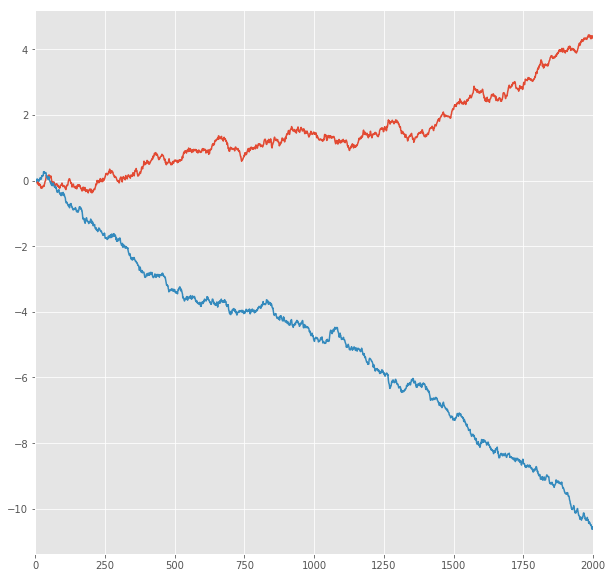

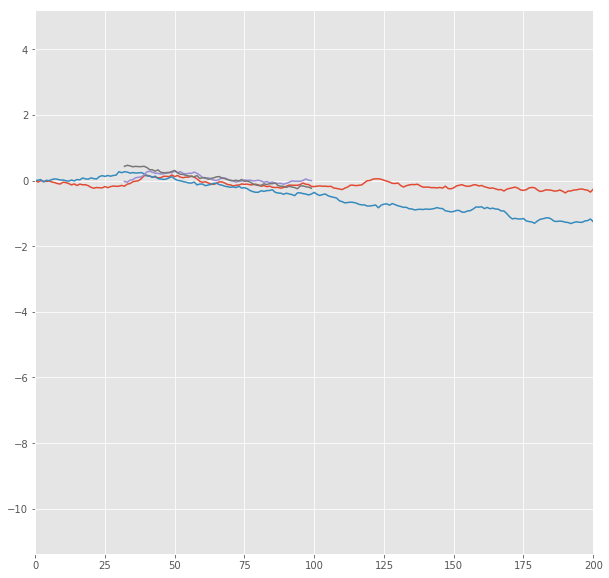

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.3742 RMSE
Predict Score for 1 -steps forecast: 0.3020 RMSE
Error Test Score for 1 -steps forecast: 0.0978 RMSE
RT Test Score for 1 -steps forecast: 0.0961 RMSE
Error Test Corr for 1 -steps forecast: 0.9829
RT Test Corr for 1 -steps forecast: 0.9732


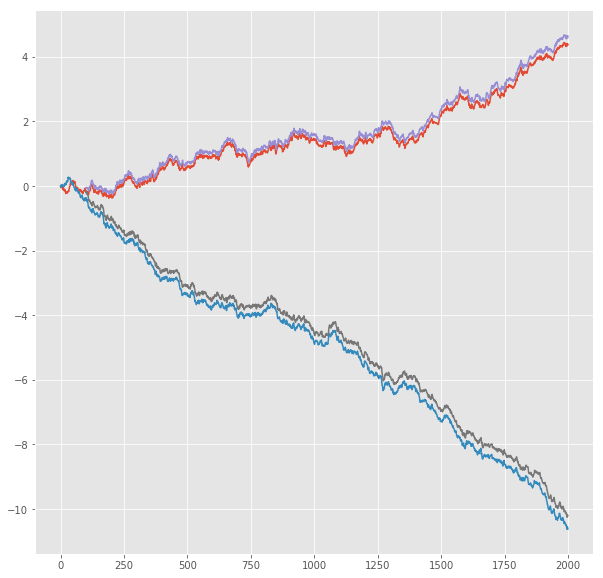

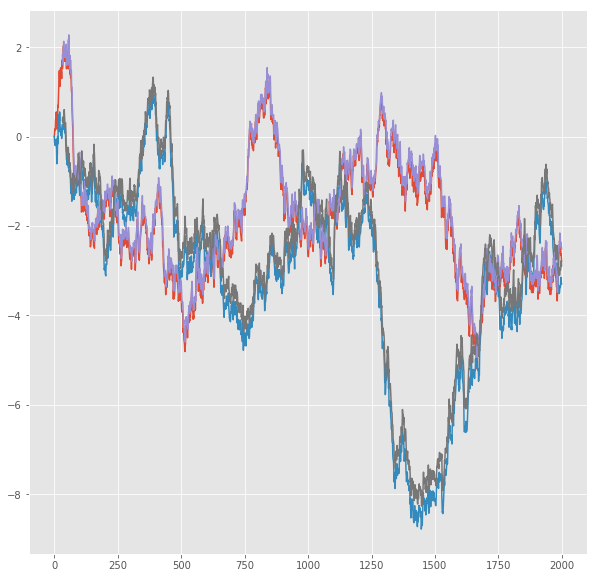

R^2 score for regression on Error: 0.9662
k = 0.9932


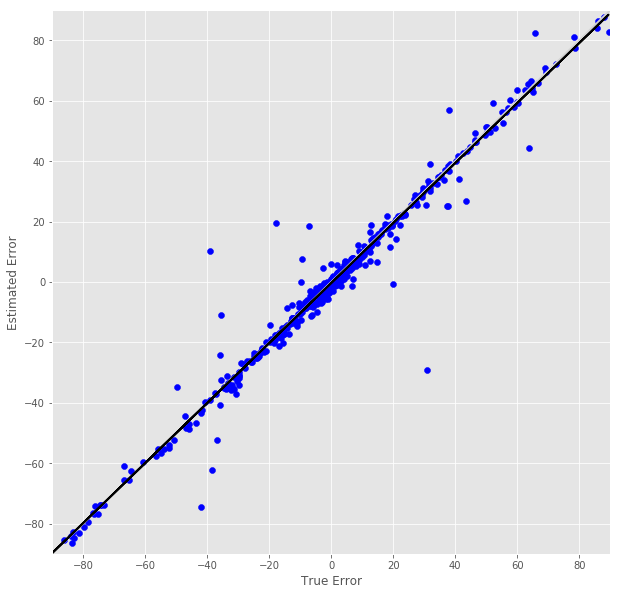

R^2 score for regression on RT: 0.9470
k = 0.9981


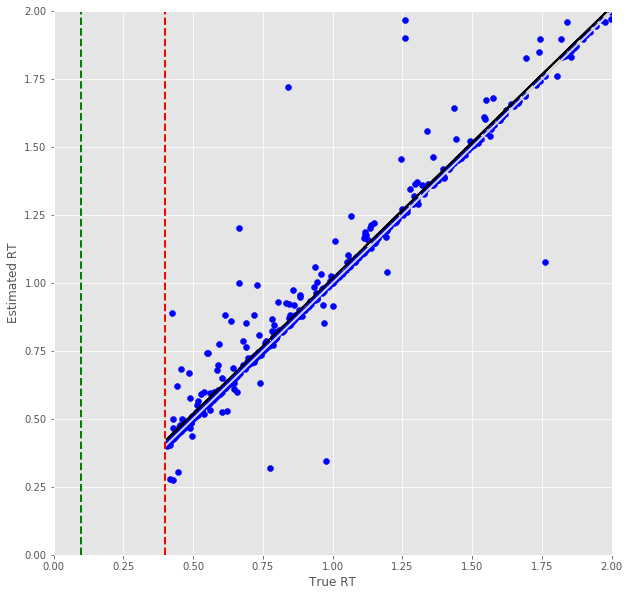

Error Prediction Score: 0.1405 RMSE
RT Prediction Score: 0.2055 RMSE
Error Prediction Corr: 0.9579
RT Prediction Corr: 0.8850
R^2 score for regression on Error: 0.9176
k = 0.9112


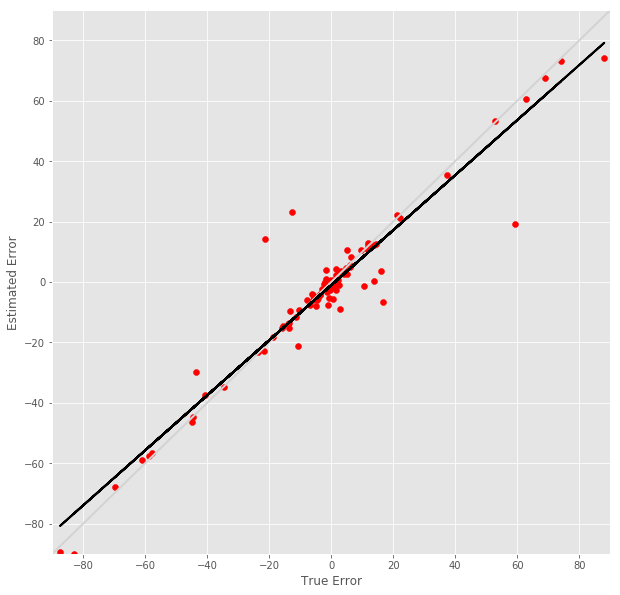

R^2 score for regression on RT: 0.7832
k = 0.8976


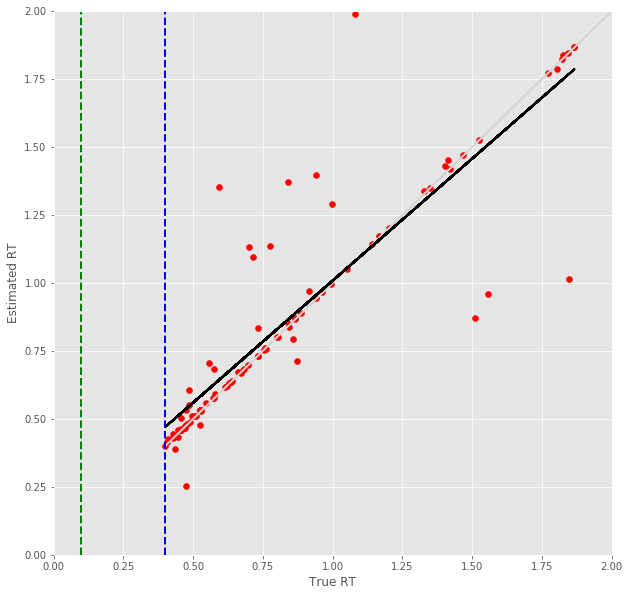

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.6785 RMSE
Predict Score for 2 -steps forecast: 0.5322 RMSE
Error Test Score for 2 -steps forecast: 0.1561 RMSE
RT Test Score for 2 -steps forecast: 0.1517 RMSE
Error Test Corr for 2 -steps forecast: 0.9594
RT Test Corr for 2 -steps forecast: 0.9344


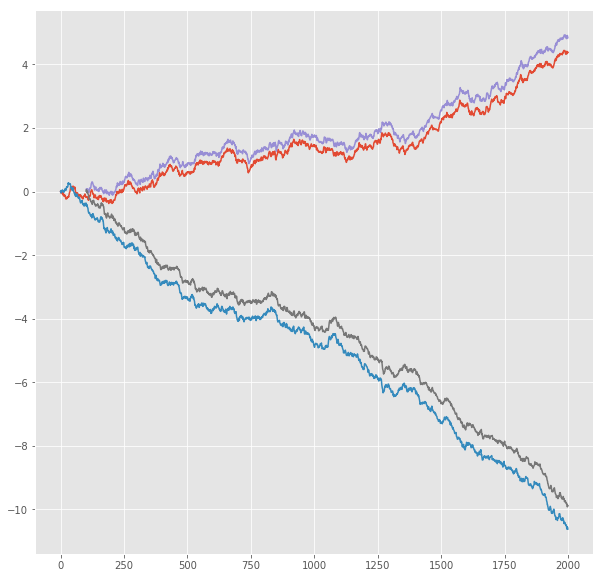

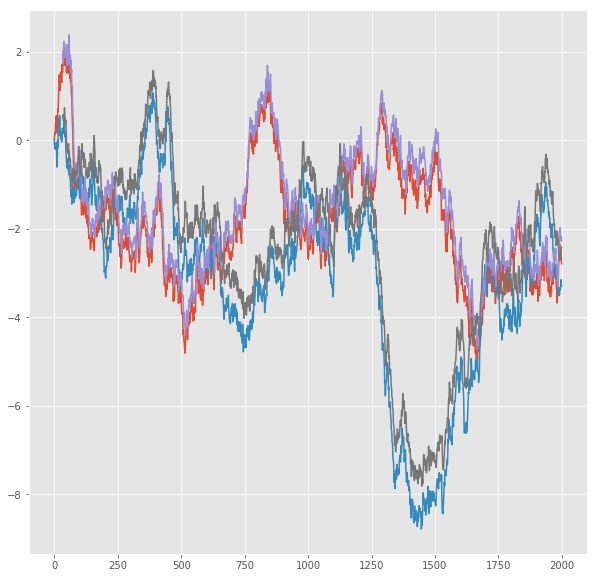

R^2 score for regression on Error: 0.9205
k = 1.0064


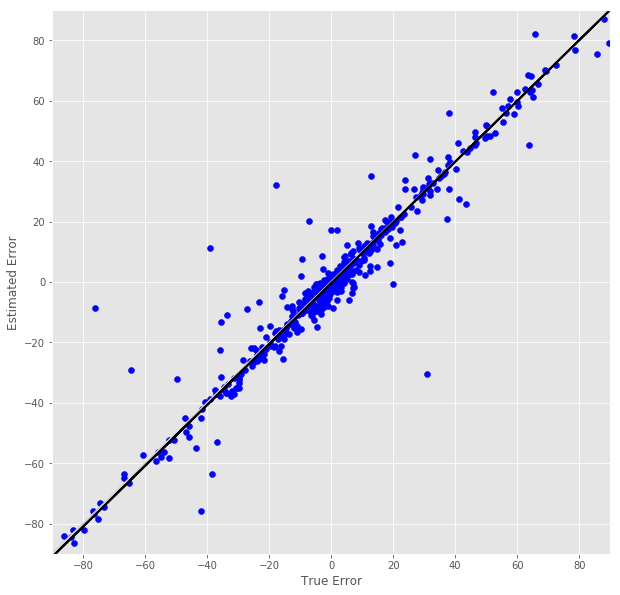

R^2 score for regression on RT: 0.8731
k = 0.9851


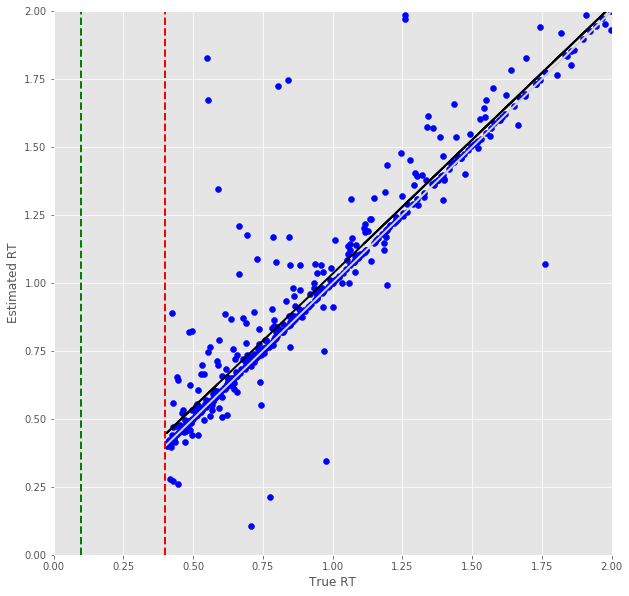

Error Prediction Score: 0.1593 RMSE
RT Prediction Score: 0.2510 RMSE
Error Prediction Corr: 0.9485
RT Prediction Corr: 0.8298
R^2 score for regression on Error: 0.8996
k = 0.8923


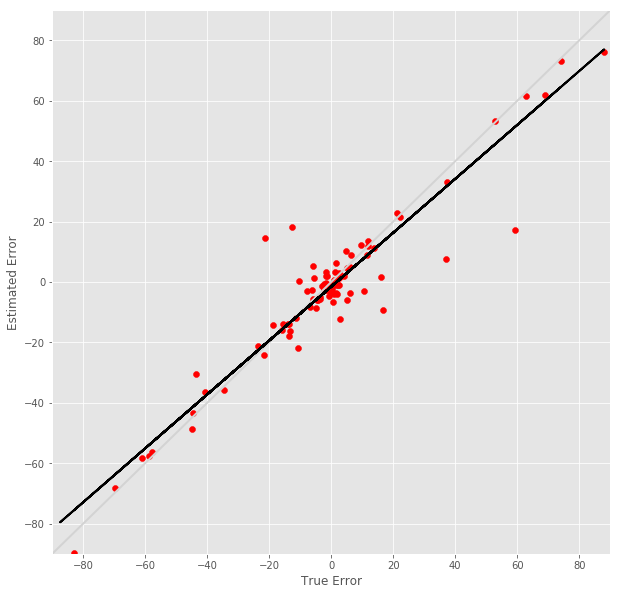

R^2 score for regression on RT: 0.6886
k = 0.8279


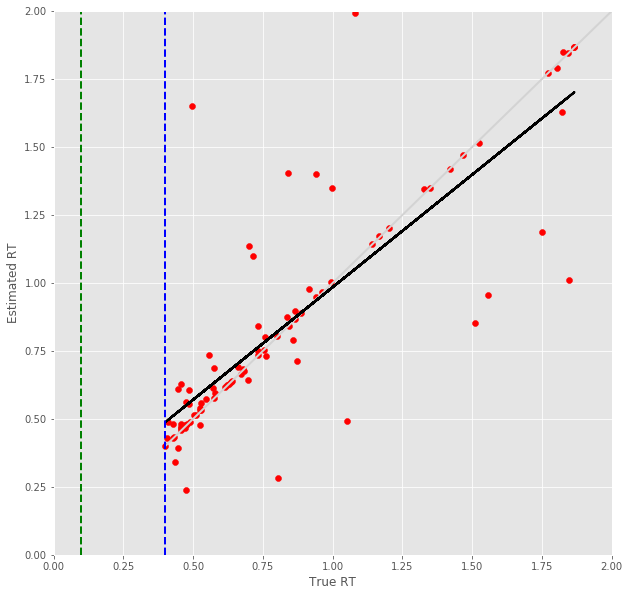

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.9726 RMSE
Predict Score for 3 -steps forecast: 0.7582 RMSE
Error Test Score for 3 -steps forecast: 0.1768 RMSE
RT Test Score for 3 -steps forecast: 0.1826 RMSE
Error Test Corr for 3 -steps forecast: 0.9494
RT Test Corr for 3 -steps forecast: 0.9010


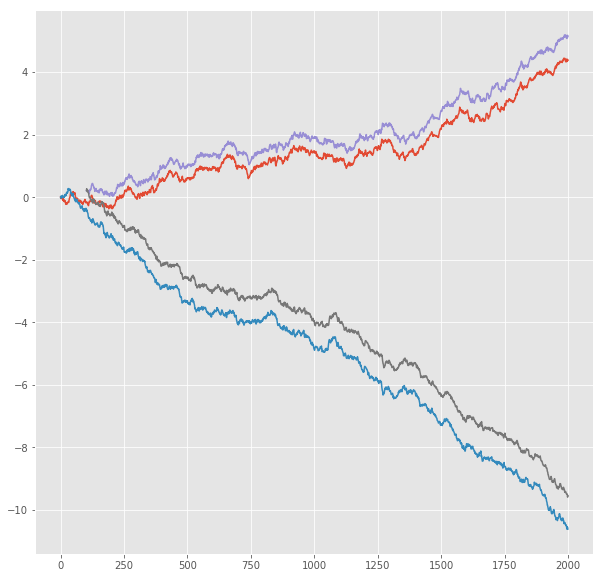

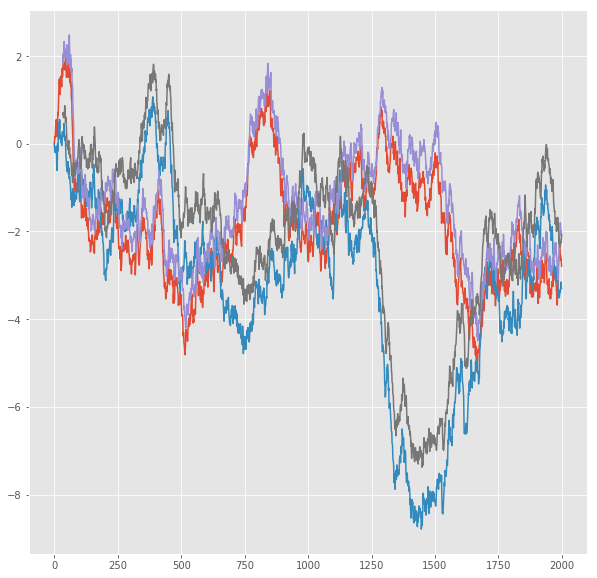

R^2 score for regression on Error: 0.9014
k = 1.0069


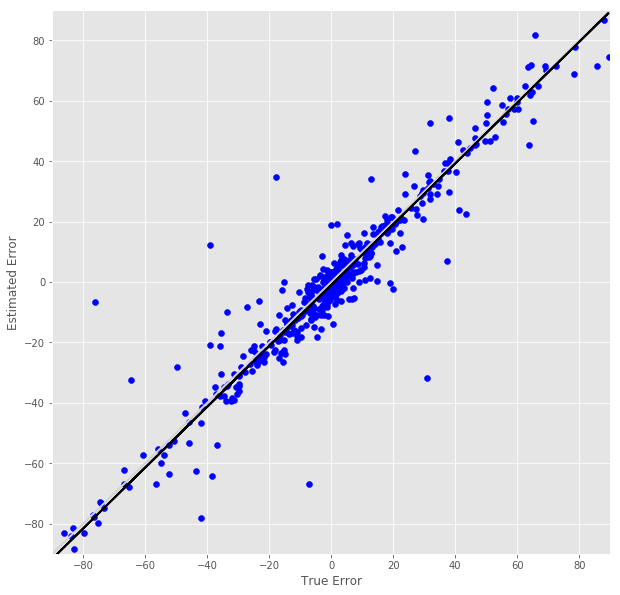

R^2 score for regression on RT: 0.8118
k = 0.9658


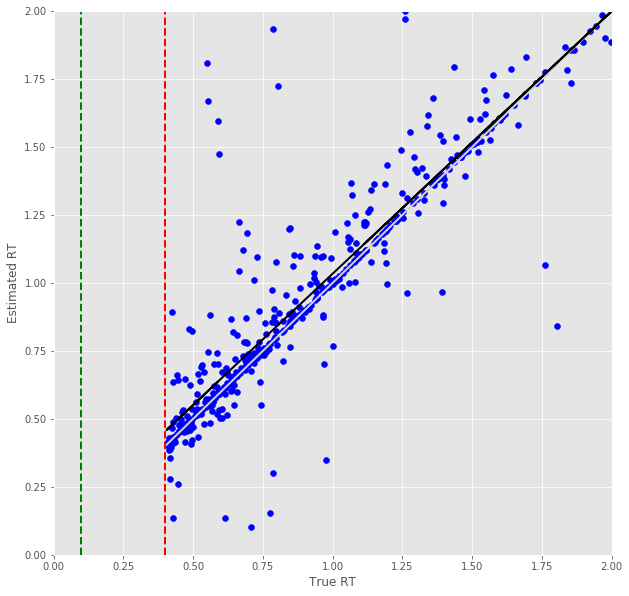

Error Prediction Score: 0.2269 RMSE
RT Prediction Score: 0.2846 RMSE
Error Prediction Corr: 0.8948
RT Prediction Corr: 0.7819
R^2 score for regression on Error: 0.8007
k = 0.8470


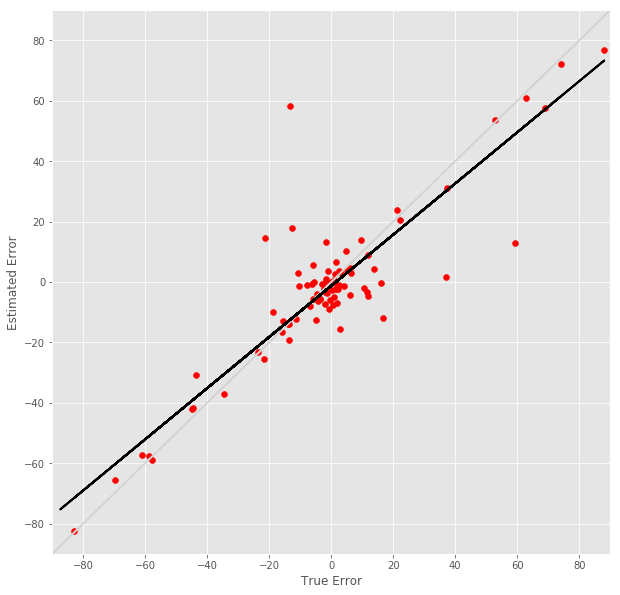

R^2 score for regression on RT: 0.6113
k = 0.8109


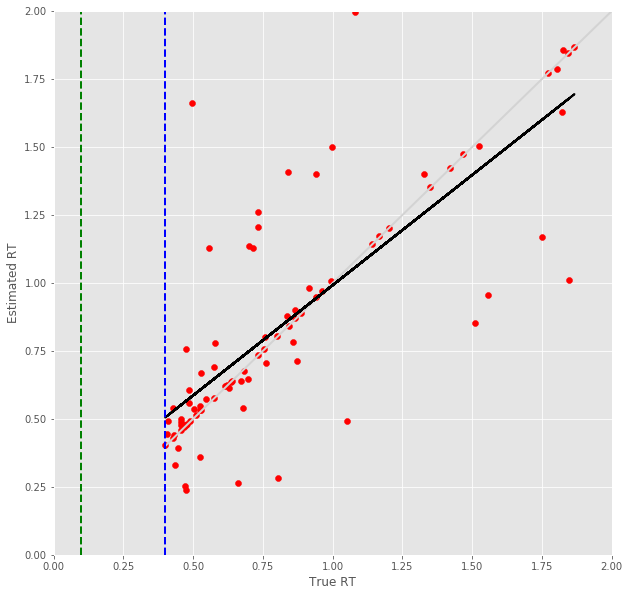

4 -step(s) forecast:
Test Score for 4 -steps forecast: 1.2527 RMSE
Predict Score for 4 -steps forecast: 0.9764 RMSE
Error Test Score for 4 -steps forecast: 0.2291 RMSE
RT Test Score for 4 -steps forecast: 0.2151 RMSE
Error Test Corr for 4 -steps forecast: 0.9148
RT Test Corr for 4 -steps forecast: 0.8640


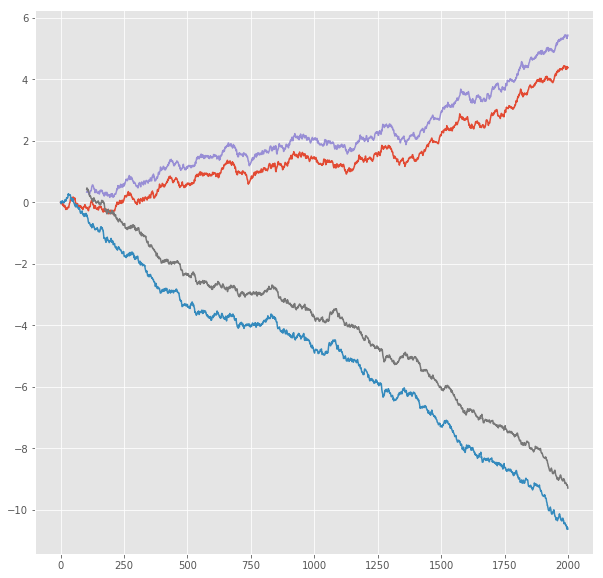

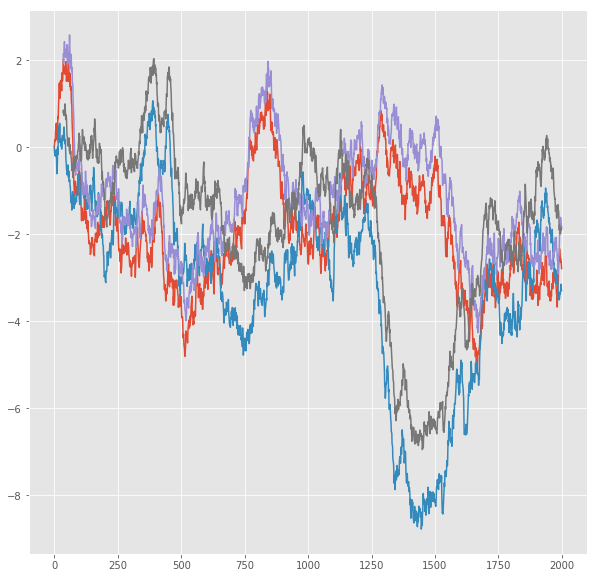

R^2 score for regression on Error: 0.8368
k = 0.9804


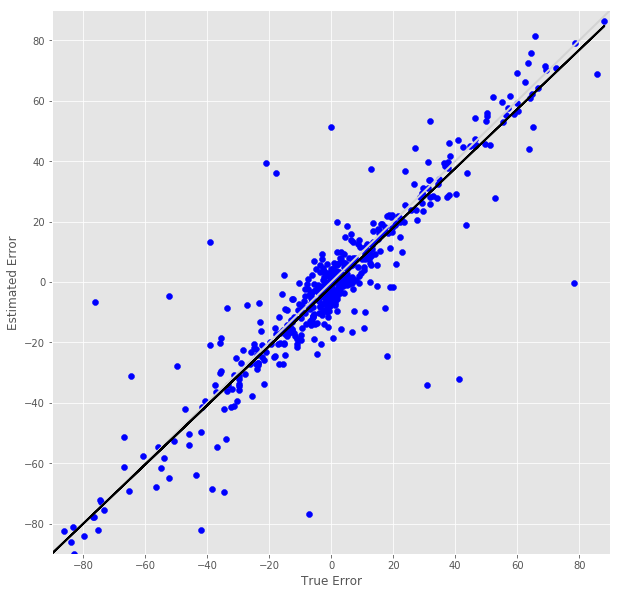

R^2 score for regression on RT: 0.7465
k = 0.9393


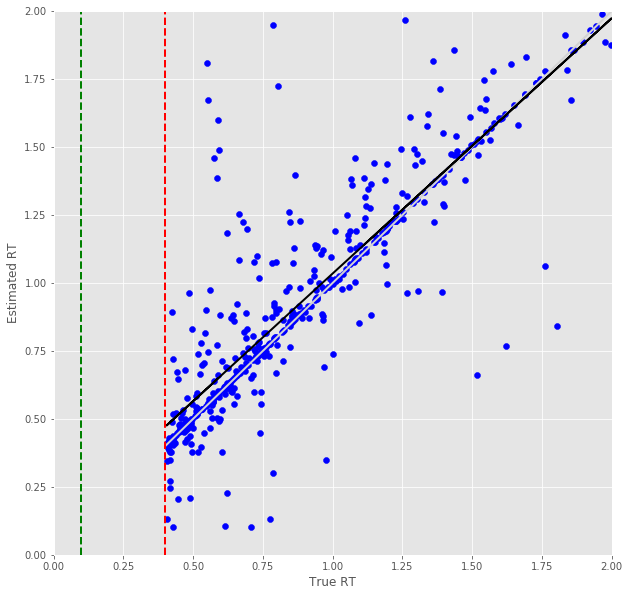

Error Prediction Score: 0.2710 RMSE
RT Prediction Score: 0.3411 RMSE
Error Prediction Corr: 0.8516
RT Prediction Corr: 0.7015
R^2 score for regression on Error: 0.7252
k = 0.8419


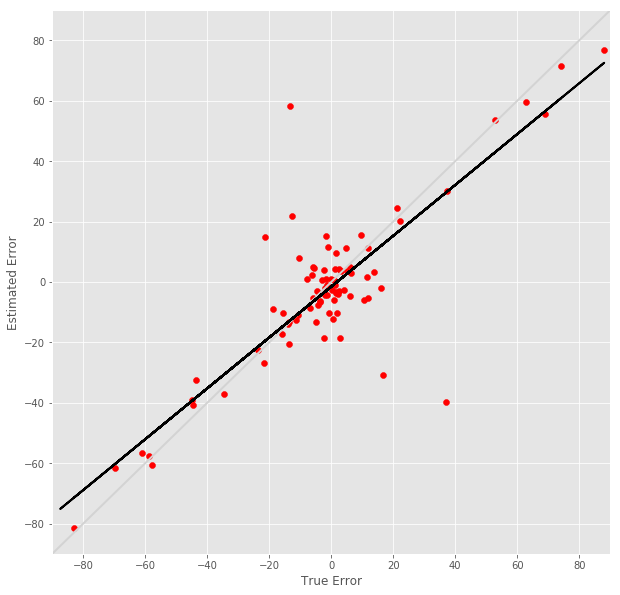

R^2 score for regression on RT: 0.4921
k = 0.7454


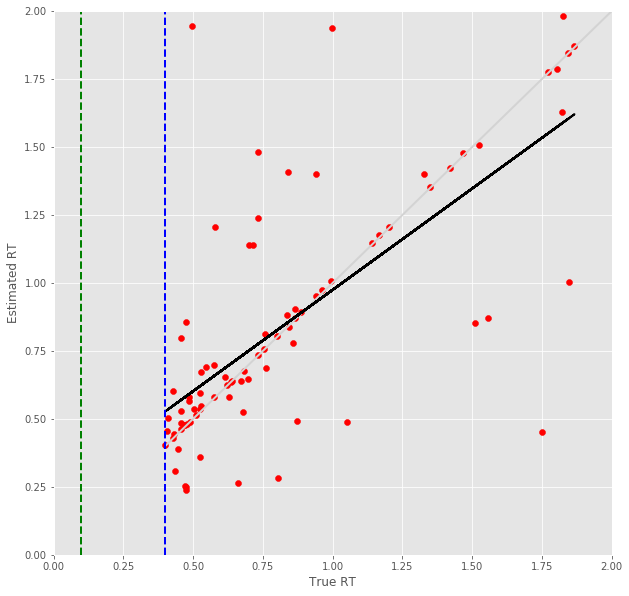

5 -step(s) forecast:
Test Score for 5 -steps forecast: 1.5159 RMSE
Predict Score for 5 -steps forecast: 1.1839 RMSE
Error Test Score for 5 -steps forecast: 0.2544 RMSE
RT Test Score for 5 -steps forecast: 0.2518 RMSE
Error Test Corr for 5 -steps forecast: 0.8978
RT Test Corr for 5 -steps forecast: 0.8248


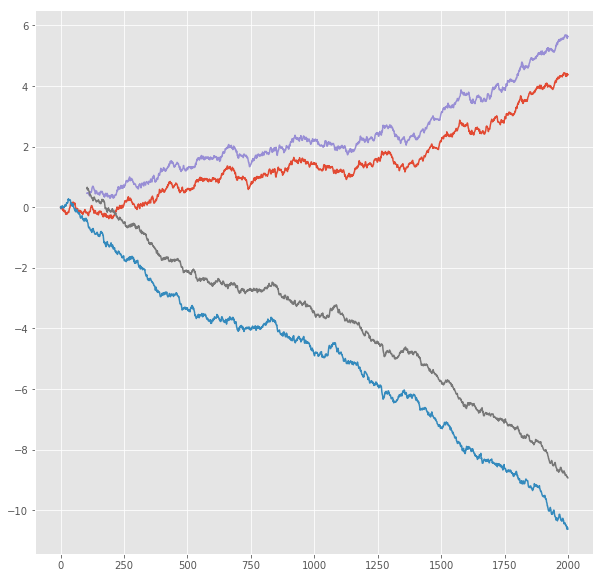

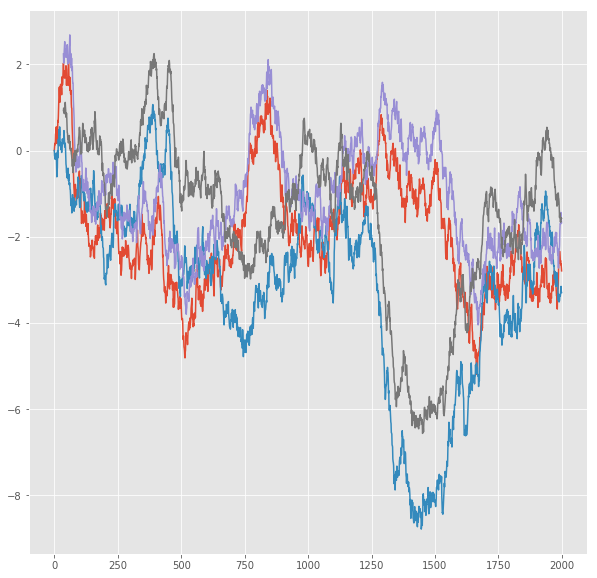

R^2 score for regression on Error: 0.8060
k = 0.9750


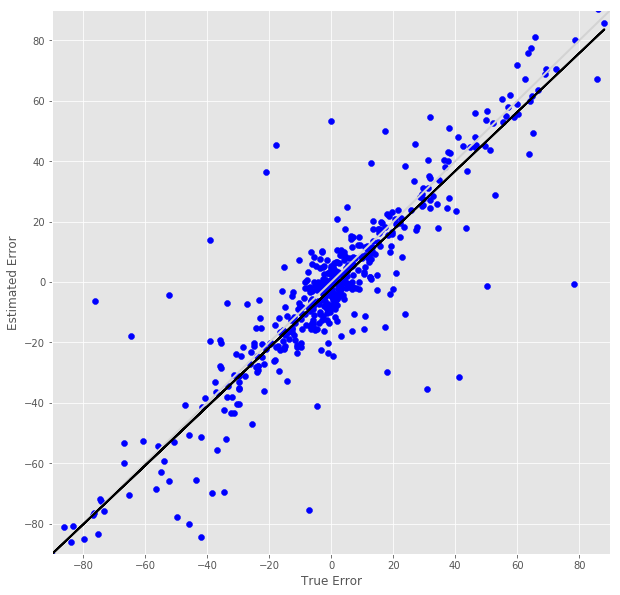

R^2 score for regression on RT: 0.6803
k = 0.9346


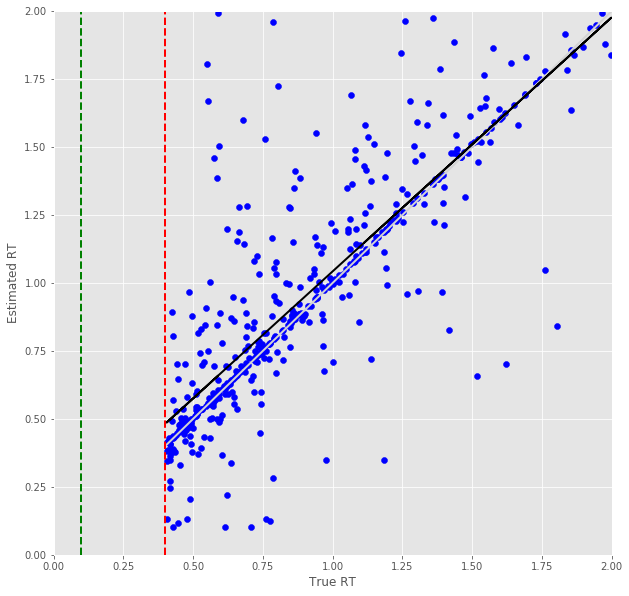

Error Prediction Score: 0.3496 RMSE
RT Prediction Score: 0.4057 RMSE
Error Prediction Corr: 0.7492
RT Prediction Corr: 0.6095
R^2 score for regression on Error: 0.5613
k = 0.6812


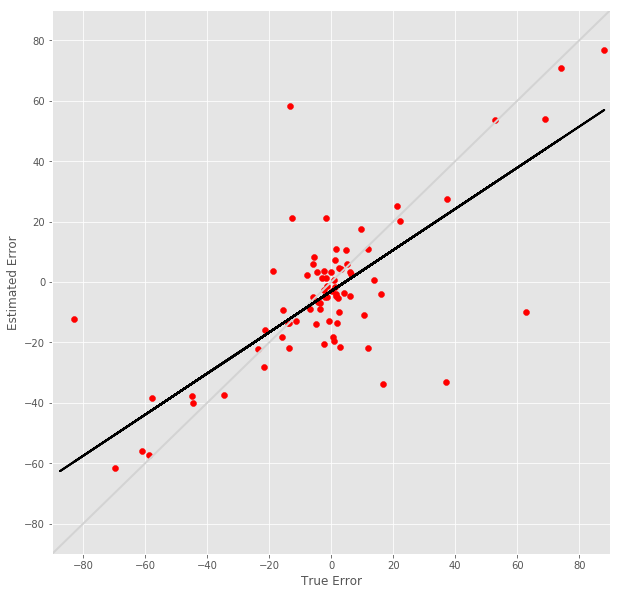

R^2 score for regression on RT: 0.3715
k = 0.6654


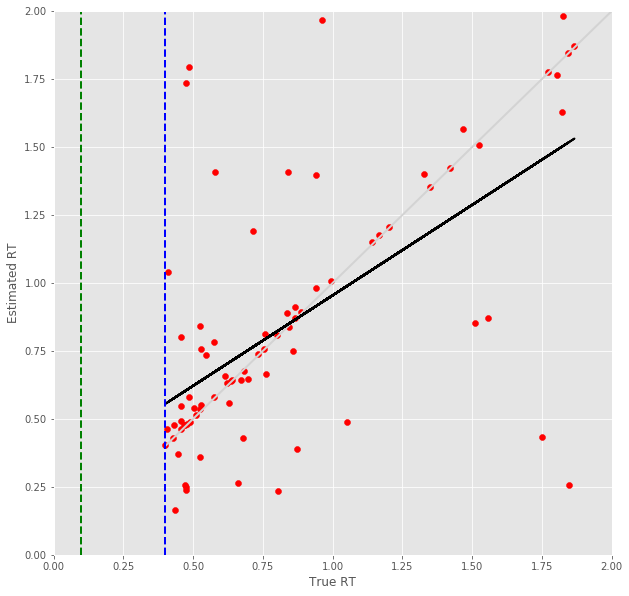

6 -step(s) forecast:
Test Score for 6 -steps forecast: 1.7643 RMSE
Predict Score for 6 -steps forecast: 1.3813 RMSE
Error Test Score for 6 -steps forecast: 0.2626 RMSE
RT Test Score for 6 -steps forecast: 0.2599 RMSE
Error Test Corr for 6 -steps forecast: 0.8884
RT Test Corr for 6 -steps forecast: 0.8140


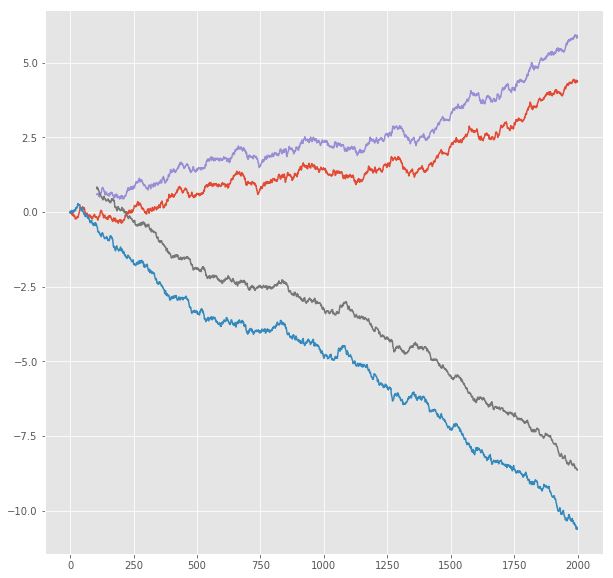

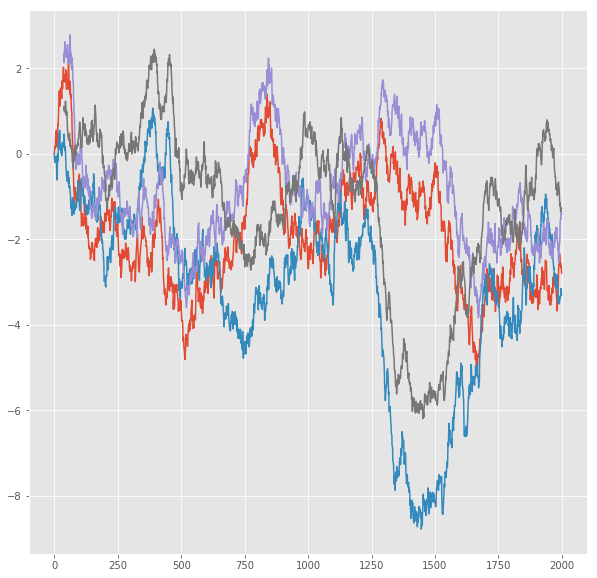

R^2 score for regression on Error: 0.7892
k = 0.9554


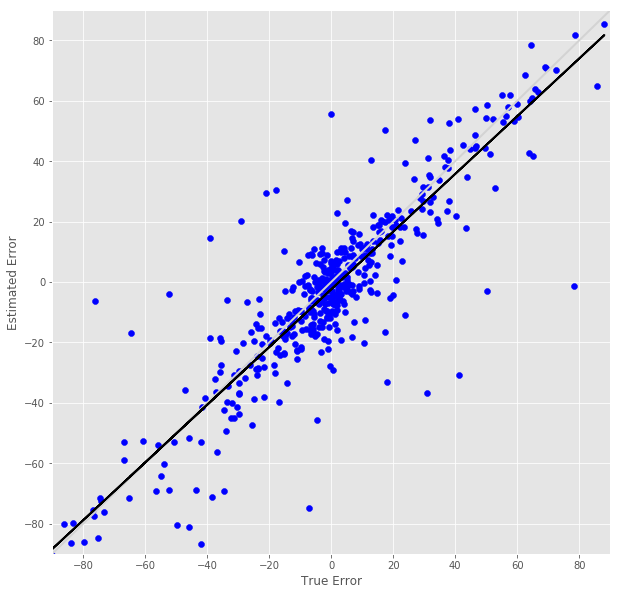

R^2 score for regression on RT: 0.6626
k = 0.9344


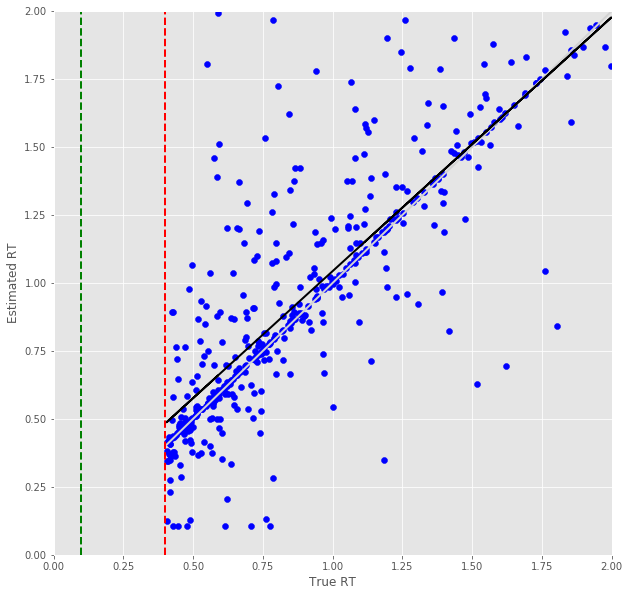

Error Prediction Score: 0.3651 RMSE
RT Prediction Score: 0.4151 RMSE
Error Prediction Corr: 0.7276
RT Prediction Corr: 0.5765
R^2 score for regression on Error: 0.5294
k = 0.6494


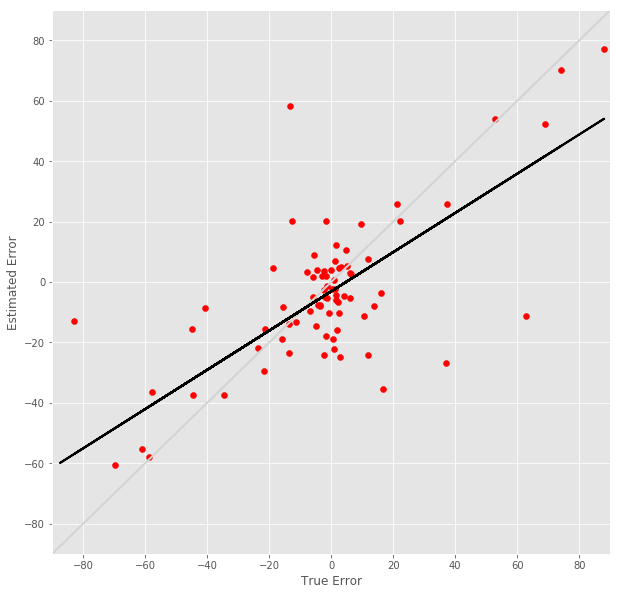

R^2 score for regression on RT: 0.3324
k = 0.6161


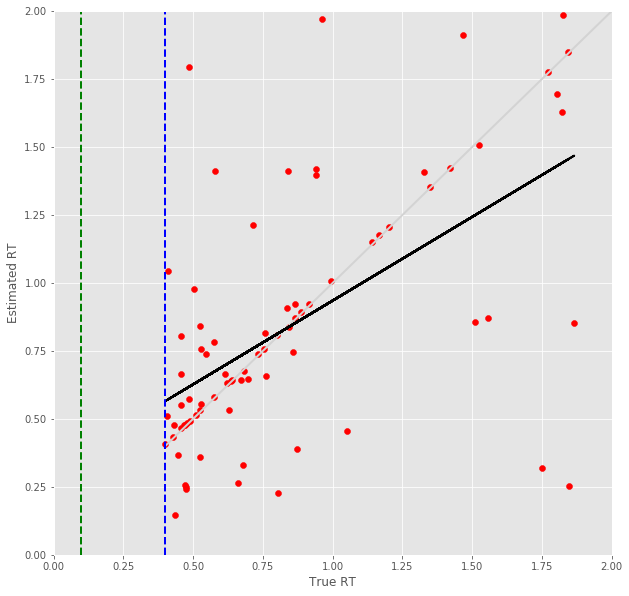

7 -step(s) forecast:
Test Score for 7 -steps forecast: 2.0002 RMSE
Predict Score for 7 -steps forecast: 1.5696 RMSE
Error Test Score for 7 -steps forecast: 0.2824 RMSE
RT Test Score for 7 -steps forecast: 0.2752 RMSE
Error Test Corr for 7 -steps forecast: 0.8703
RT Test Corr for 7 -steps forecast: 0.7941


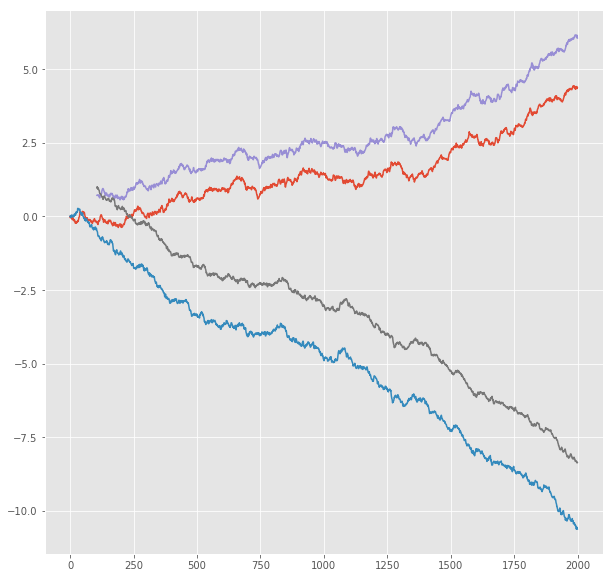

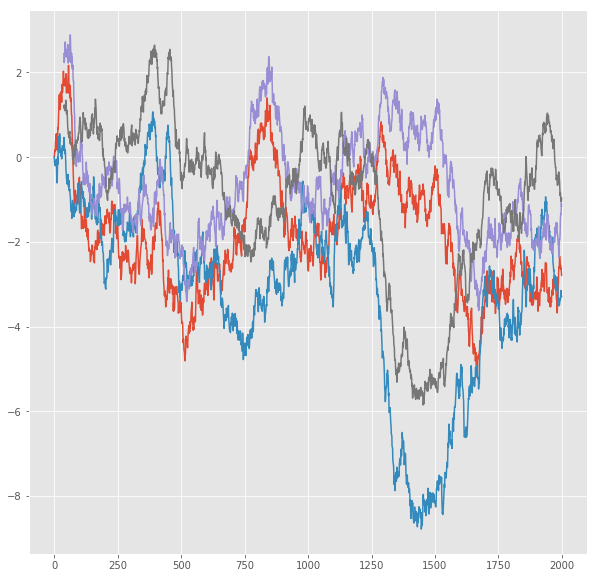

R^2 score for regression on Error: 0.7574
k = 0.9262


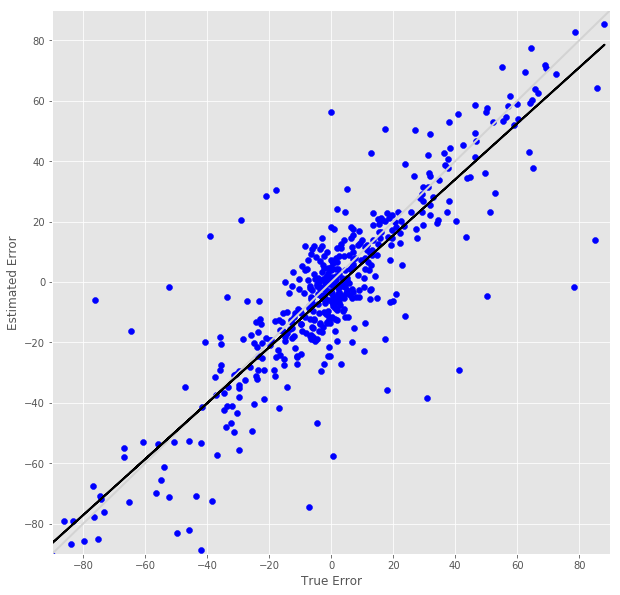

R^2 score for regression on RT: 0.6307
k = 0.9270


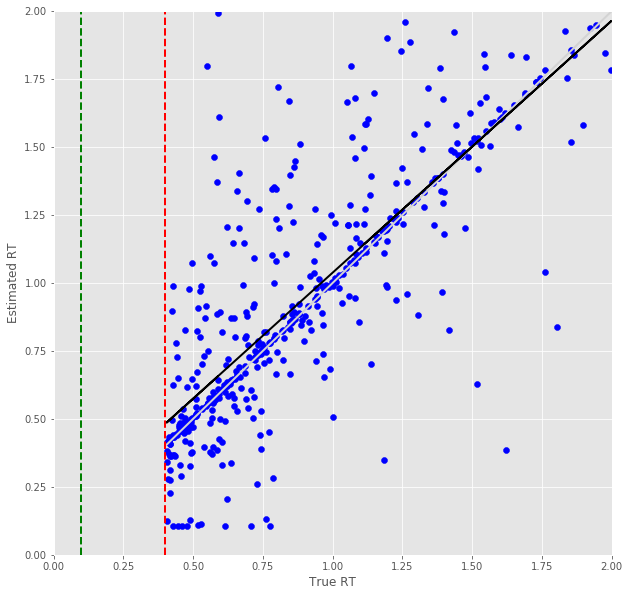

Error Prediction Score: 0.4105 RMSE
RT Prediction Score: 0.4485 RMSE
Error Prediction Corr: 0.6580
RT Prediction Corr: 0.5276
R^2 score for regression on Error: 0.4329
k = 0.5839


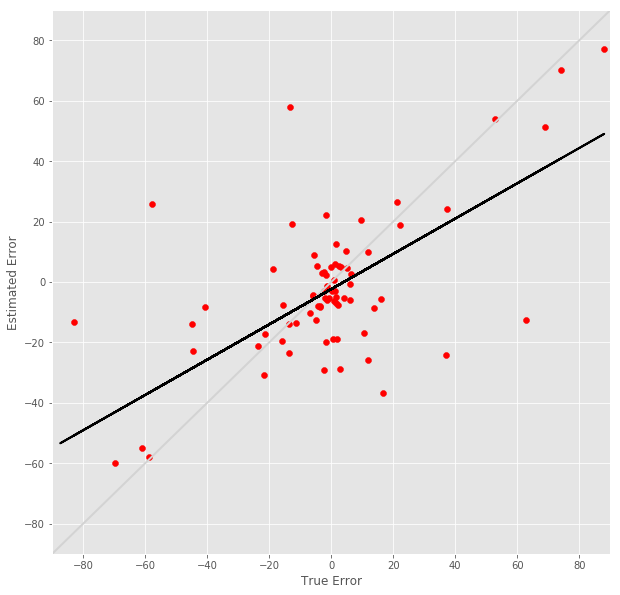

R^2 score for regression on RT: 0.2784
k = 0.5812


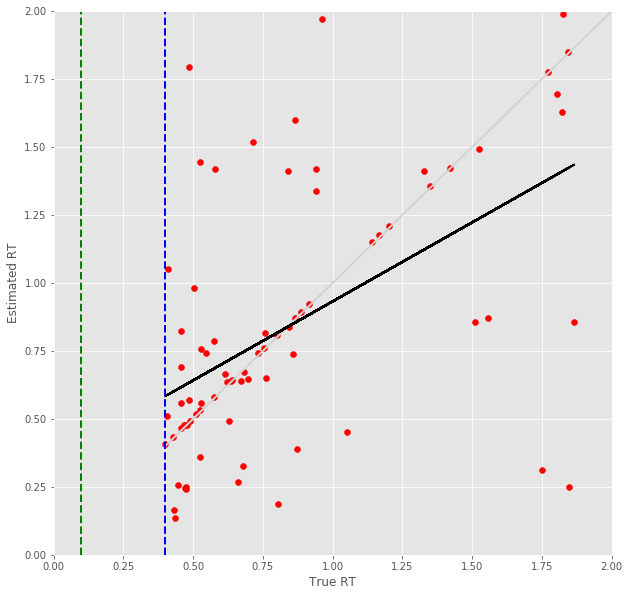

8 -step(s) forecast:
Test Score for 8 -steps forecast: 2.2257 RMSE
Predict Score for 8 -steps forecast: 1.7499 RMSE
Error Test Score for 8 -steps forecast: 0.3086 RMSE
RT Test Score for 8 -steps forecast: 0.2958 RMSE
Error Test Corr for 8 -steps forecast: 0.8517
RT Test Corr for 8 -steps forecast: 0.7687


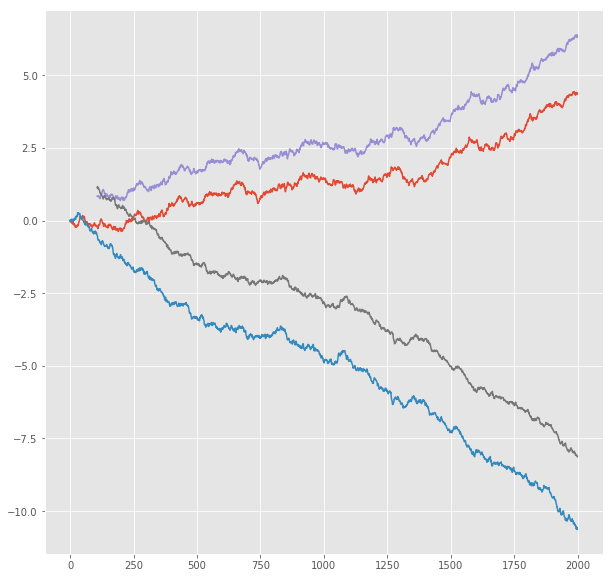

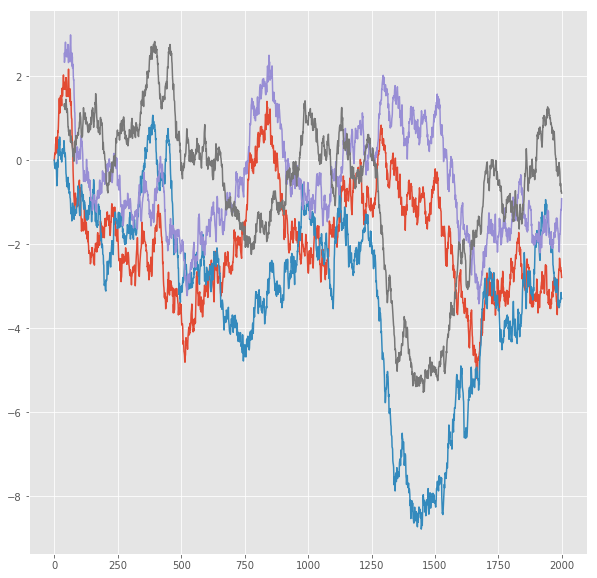

R^2 score for regression on Error: 0.7254
k = 0.9280


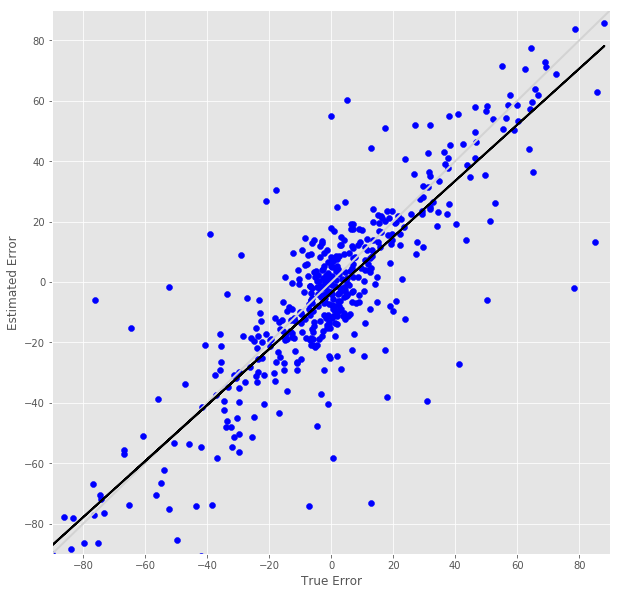

R^2 score for regression on RT: 0.5910
k = 0.9189


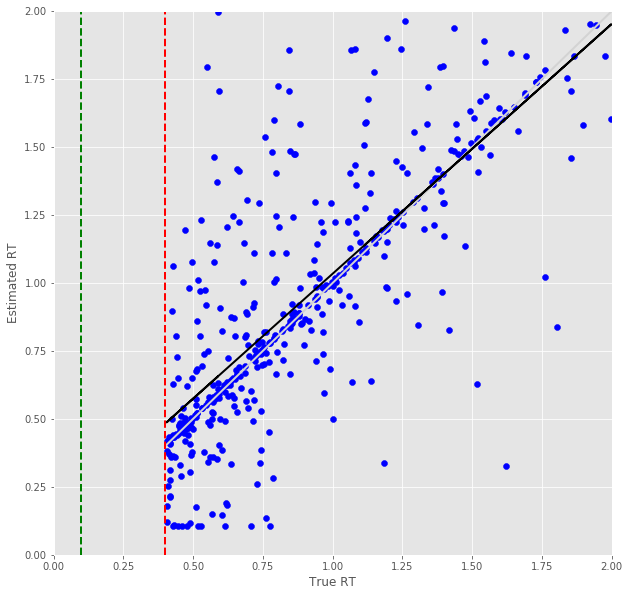

Error Prediction Score: 0.4525 RMSE
RT Prediction Score: 0.4858 RMSE
Error Prediction Corr: 0.5995
RT Prediction Corr: 0.4898
R^2 score for regression on Error: 0.3595
k = 0.5295


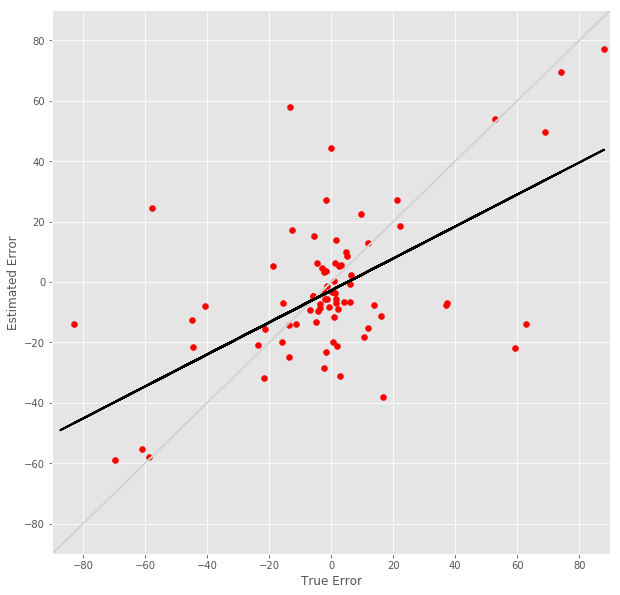

R^2 score for regression on RT: 0.2399
k = 0.5806


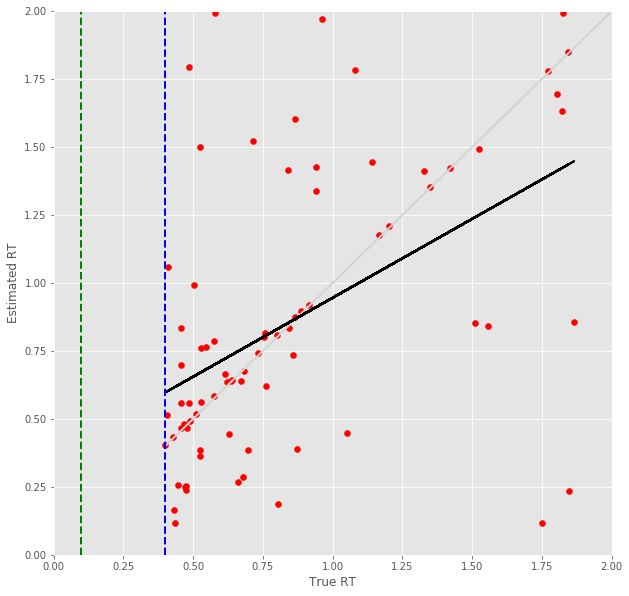

9 -step(s) forecast:
Test Score for 9 -steps forecast: 2.4418 RMSE
Predict Score for 9 -steps forecast: 1.9228 RMSE
Error Test Score for 9 -steps forecast: 0.3268 RMSE
RT Test Score for 9 -steps forecast: 0.3152 RMSE
Error Test Corr for 9 -steps forecast: 0.8379
RT Test Corr for 9 -steps forecast: 0.7415


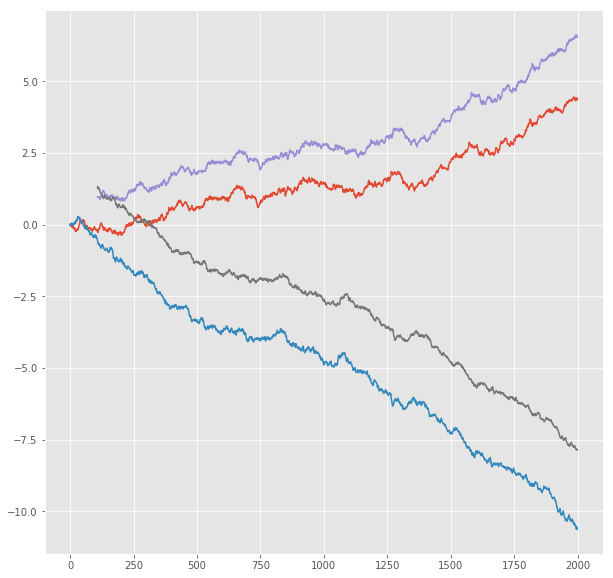

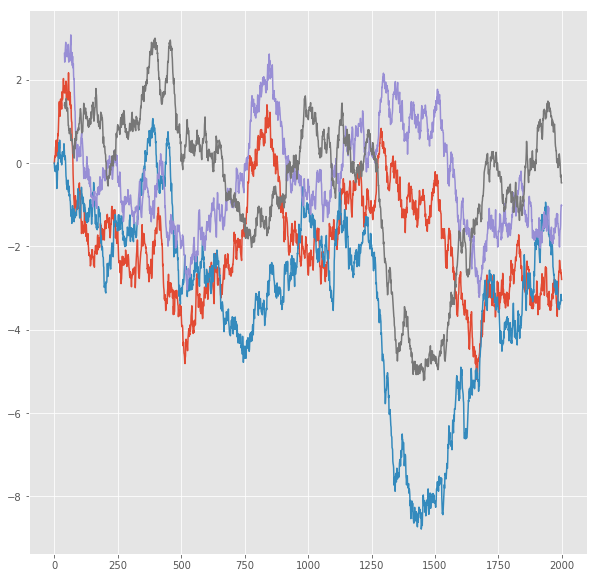

R^2 score for regression on Error: 0.7021
k = 0.9221


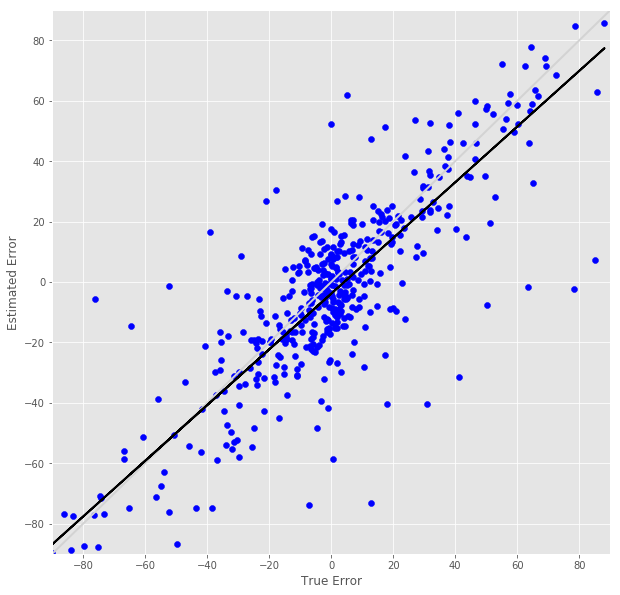

R^2 score for regression on RT: 0.5499
k = 0.8996


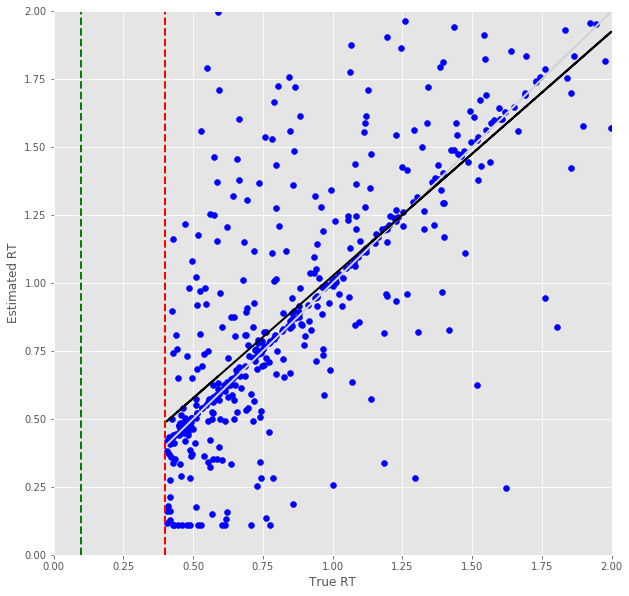

Error Prediction Score: 0.4978 RMSE
RT Prediction Score: 0.4930 RMSE
Error Prediction Corr: 0.5473
RT Prediction Corr: 0.4607
R^2 score for regression on Error: 0.2995
k = 0.5210


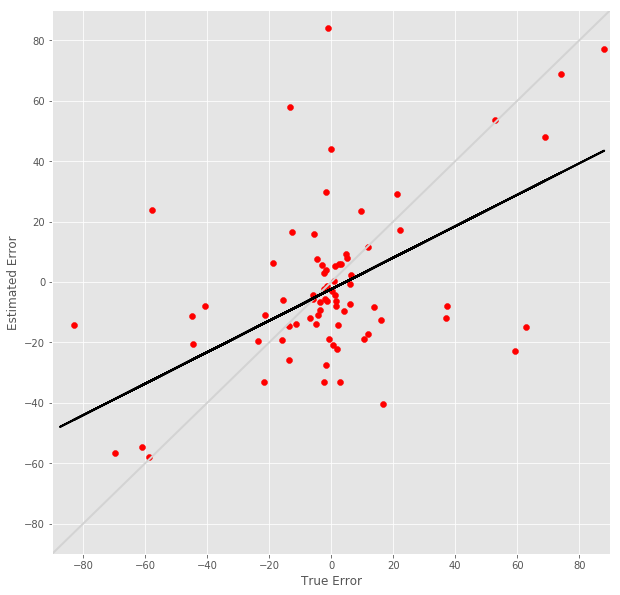

R^2 score for regression on RT: 0.2123
k = 0.5574


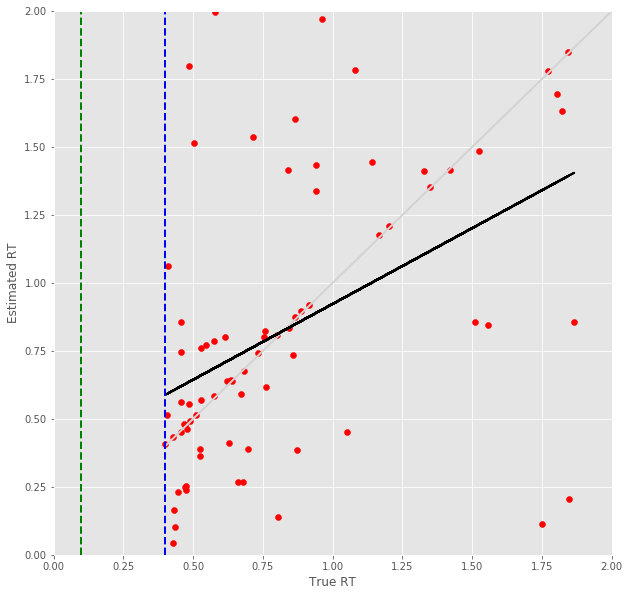

10 -step(s) forecast:
Test Score for 10 -steps forecast: 2.6493 RMSE
Predict Score for 10 -steps forecast: 2.0890 RMSE
Error Test Score for 10 -steps forecast: 0.3483 RMSE
RT Test Score for 10 -steps forecast: 0.3295 RMSE
Error Test Corr for 10 -steps forecast: 0.8199
RT Test Corr for 10 -steps forecast: 0.7204


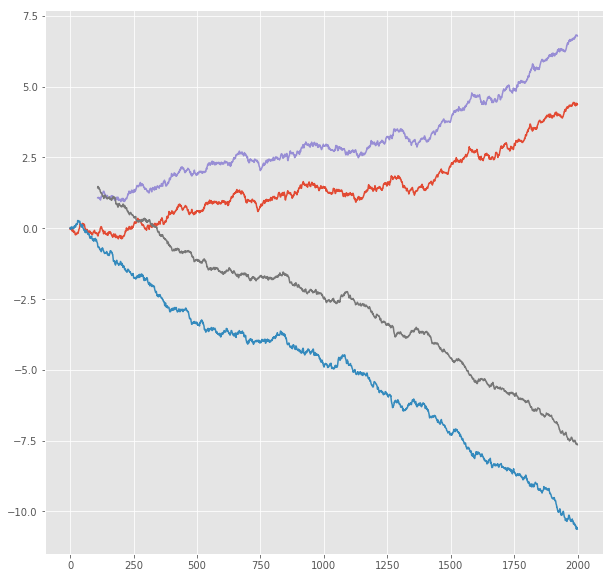

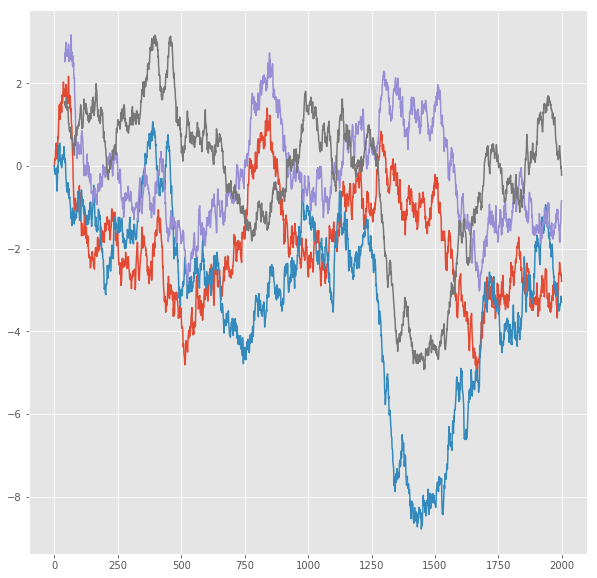

R^2 score for regression on Error: 0.6722
k = 0.9171


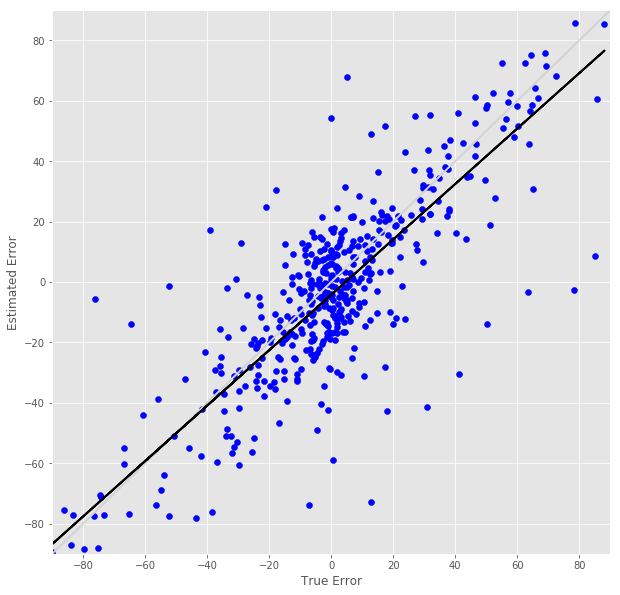

R^2 score for regression on RT: 0.5189
k = 0.8849


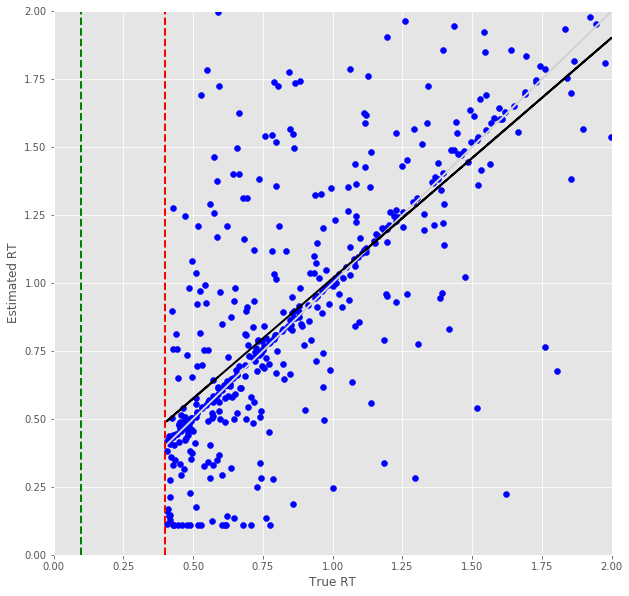

Error Prediction Score: 0.5445 RMSE
RT Prediction Score: 0.5099 RMSE
Error Prediction Corr: 0.5026
RT Prediction Corr: 0.4211
R^2 score for regression on Error: 0.2526
k = 0.5150


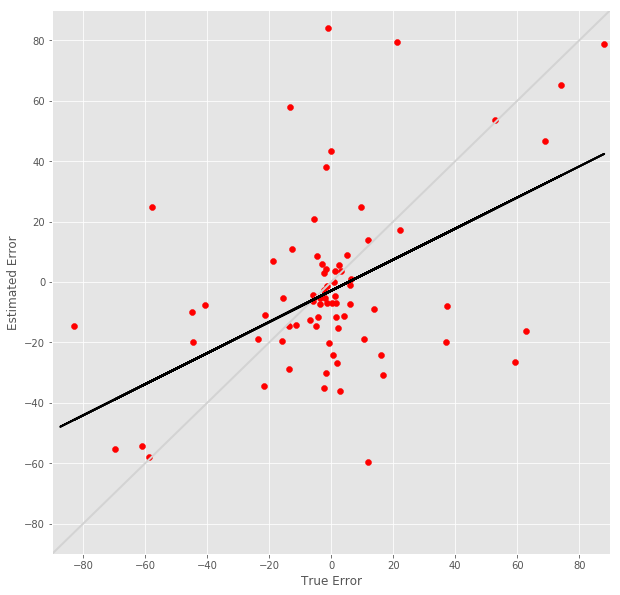

R^2 score for regression on RT: 0.1774
k = 0.4961


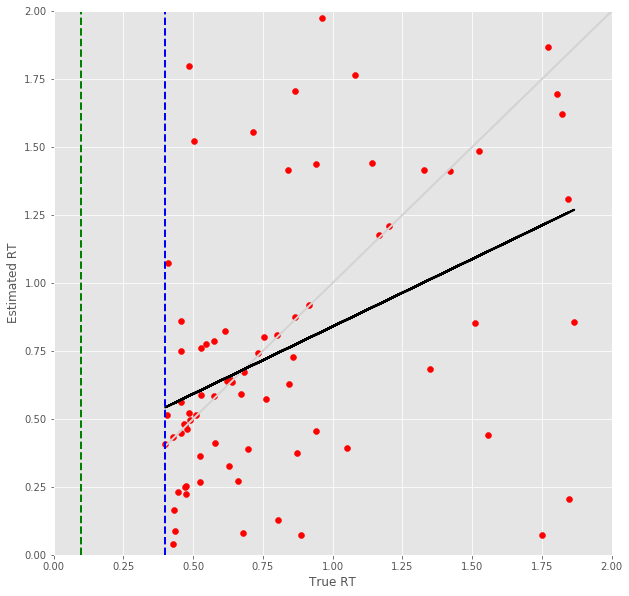

11 -step(s) forecast:
Test Score for 11 -steps forecast: 2.8487 RMSE
Predict Score for 11 -steps forecast: 2.2487 RMSE
Error Test Score for 11 -steps forecast: 0.3686 RMSE
RT Test Score for 11 -steps forecast: 0.3537 RMSE
Error Test Corr for 11 -steps forecast: 0.8010
RT Test Corr for 11 -steps forecast: 0.6910


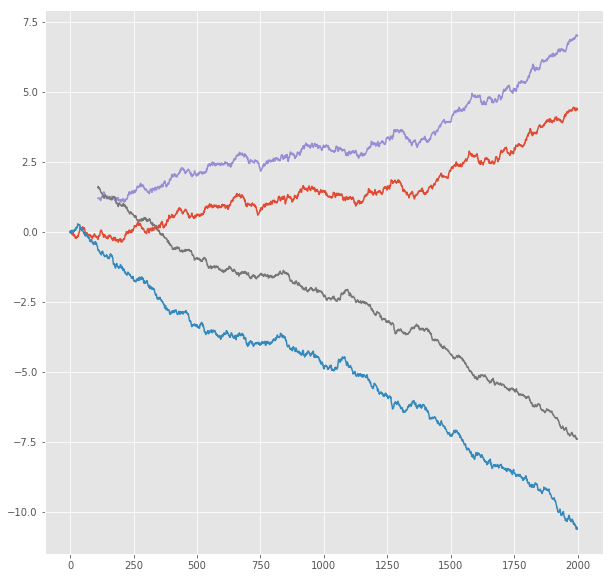

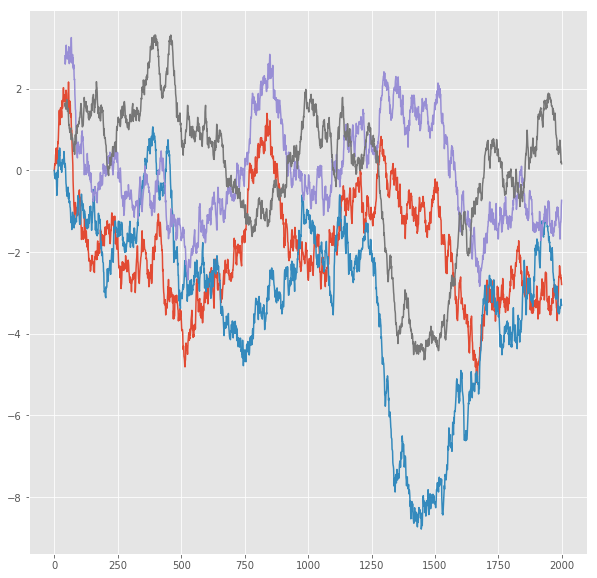

R^2 score for regression on Error: 0.6417
k = 0.9173


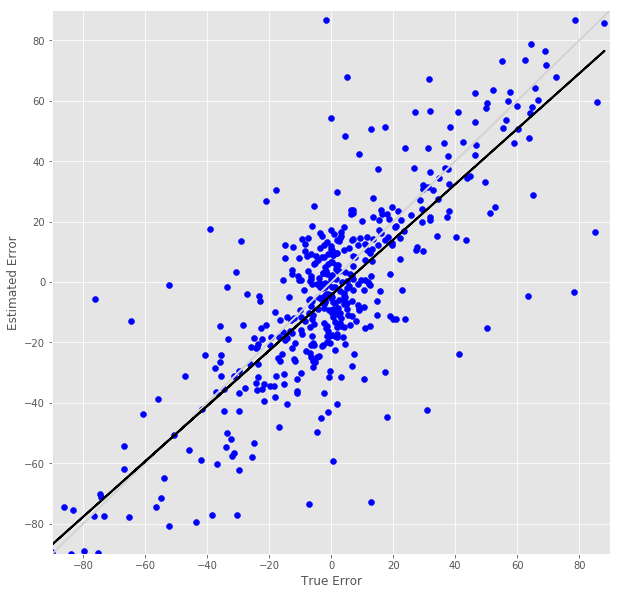

R^2 score for regression on RT: 0.4775
k = 0.8650


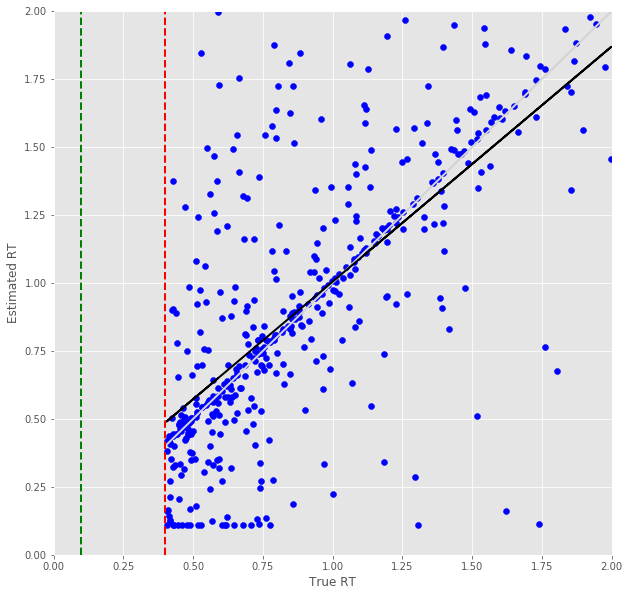

Error Prediction Score: 0.5510 RMSE
RT Prediction Score: 0.5143 RMSE
Error Prediction Corr: 0.4955
RT Prediction Corr: 0.4180
R^2 score for regression on Error: 0.2455
k = 0.5110


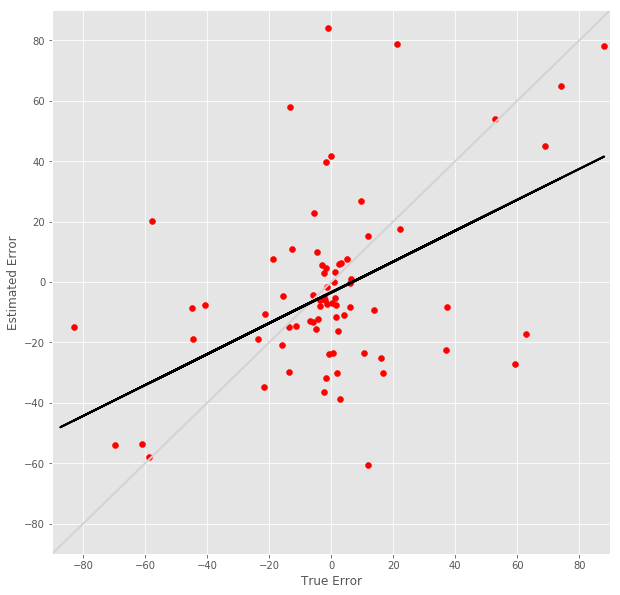

R^2 score for regression on RT: 0.1747
k = 0.4964


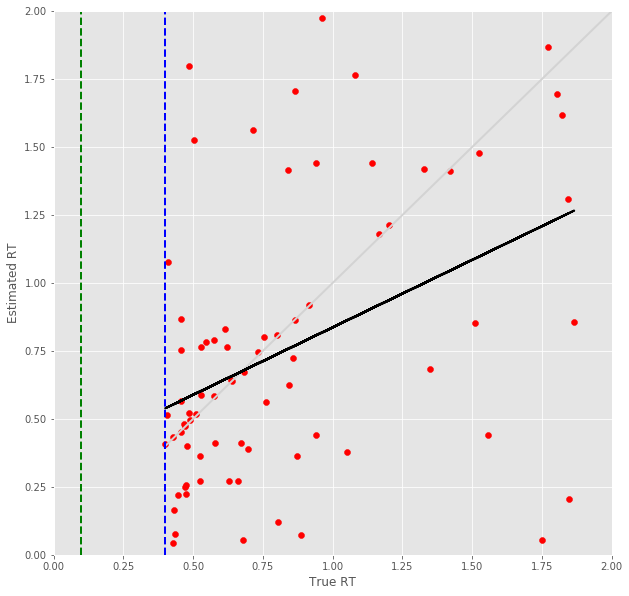

12 -step(s) forecast:
Test Score for 12 -steps forecast: 3.0400 RMSE
Predict Score for 12 -steps forecast: 2.4022 RMSE
Error Test Score for 12 -steps forecast: 0.3822 RMSE
RT Test Score for 12 -steps forecast: 0.3705 RMSE
Error Test Corr for 12 -steps forecast: 0.7904
RT Test Corr for 12 -steps forecast: 0.6691


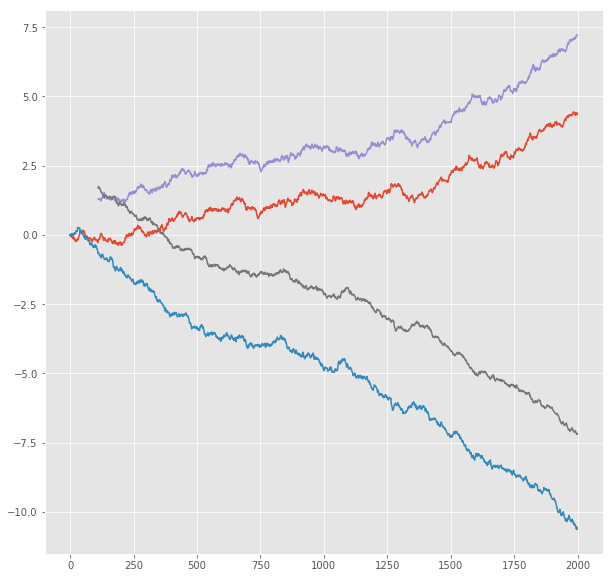

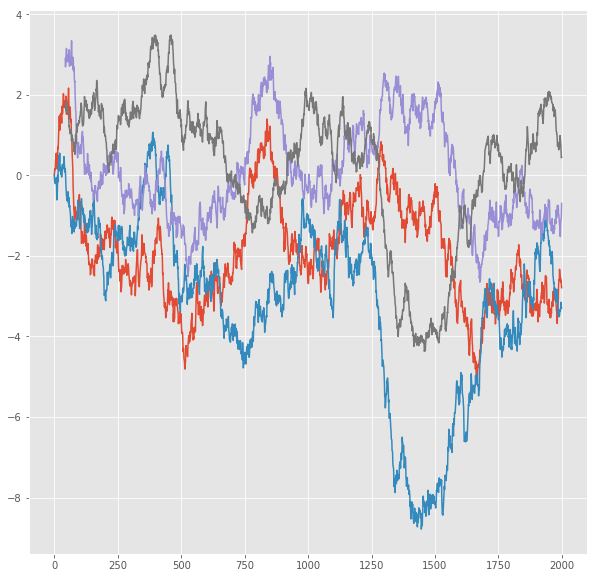

R^2 score for regression on Error: 0.6247
k = 0.9153


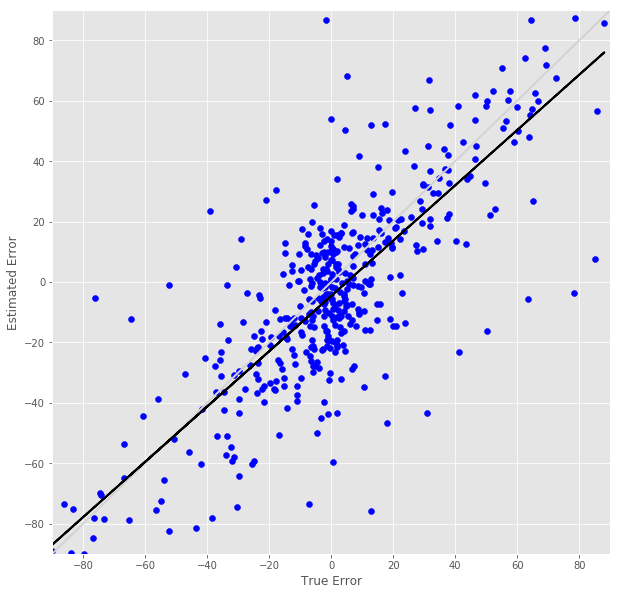

R^2 score for regression on RT: 0.4476
k = 0.8522


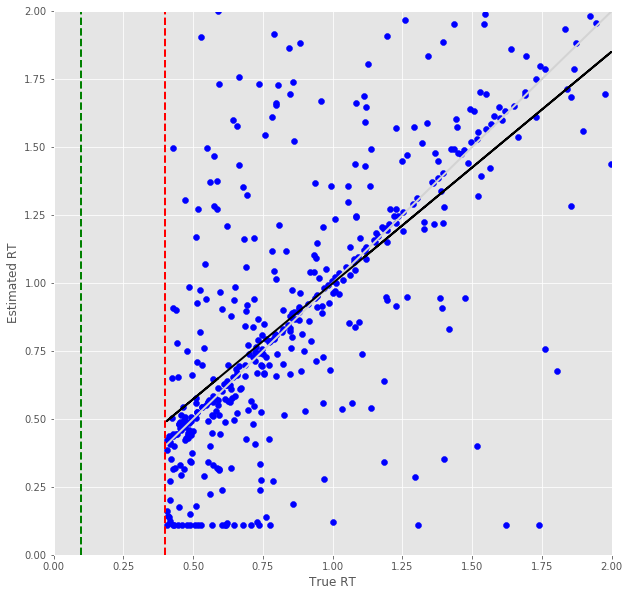

Error Prediction Score: 0.5749 RMSE
RT Prediction Score: 0.5511 RMSE
Error Prediction Corr: 0.4889
RT Prediction Corr: 0.3659
R^2 score for regression on Error: 0.2391
k = 0.5391


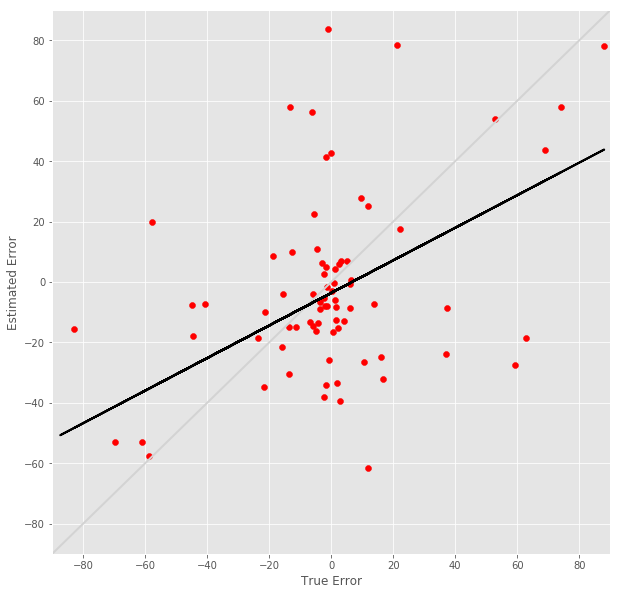

R^2 score for regression on RT: 0.1339
k = 0.4662


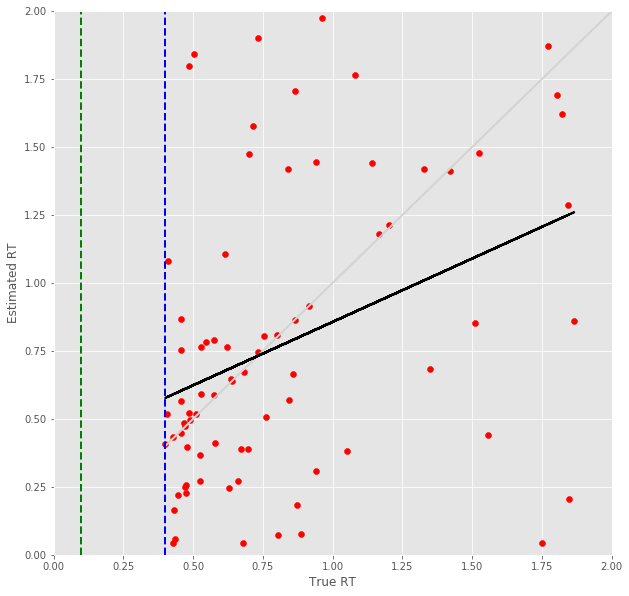

13 -step(s) forecast:
Test Score for 13 -steps forecast: 3.2238 RMSE
Predict Score for 13 -steps forecast: 2.5498 RMSE
Error Test Score for 13 -steps forecast: 0.4076 RMSE
RT Test Score for 13 -steps forecast: 0.3683 RMSE
Error Test Corr for 13 -steps forecast: 0.7745
RT Test Corr for 13 -steps forecast: 0.6707


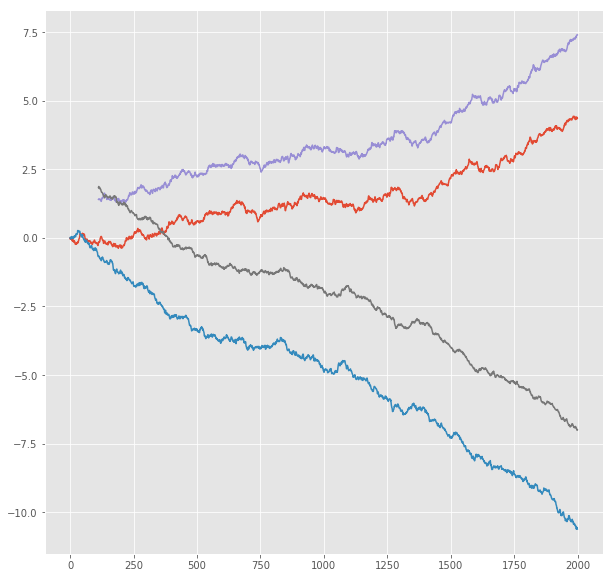

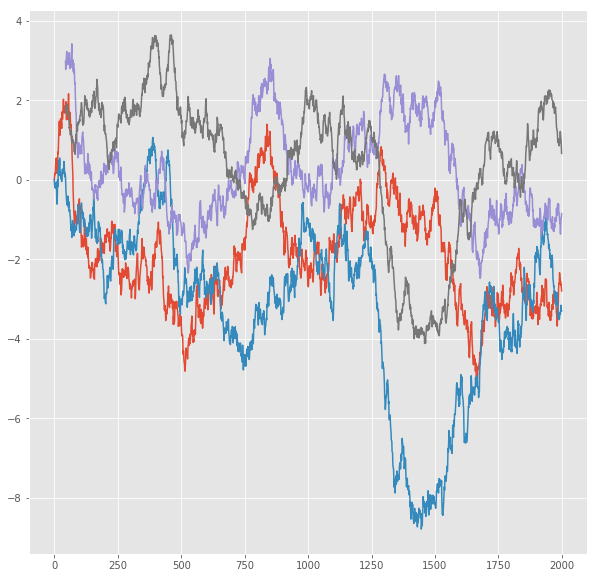

R^2 score for regression on Error: 0.5999
k = 0.9291


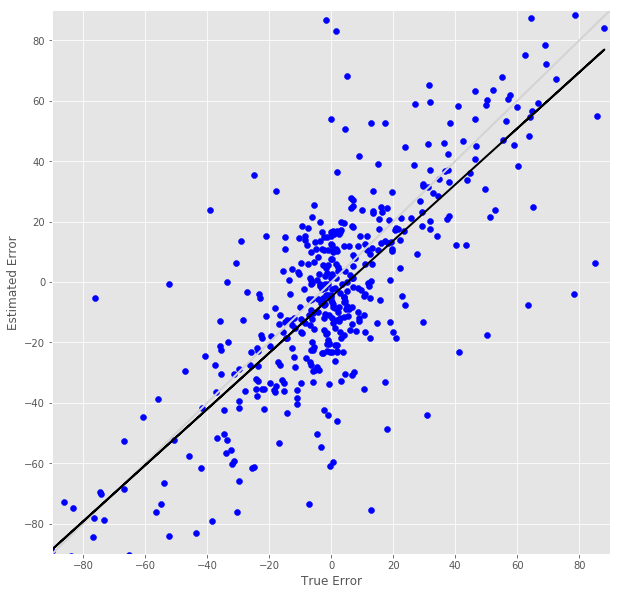

R^2 score for regression on RT: 0.4498
k = 0.8534


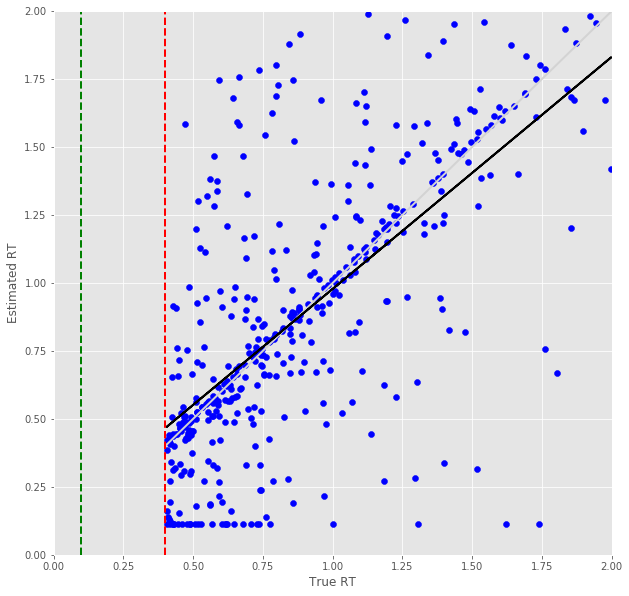

Error Prediction Score: 0.6089 RMSE
RT Prediction Score: 0.5813 RMSE
Error Prediction Corr: 0.5267
RT Prediction Corr: 0.2947
R^2 score for regression on Error: 0.2774
k = 0.6655


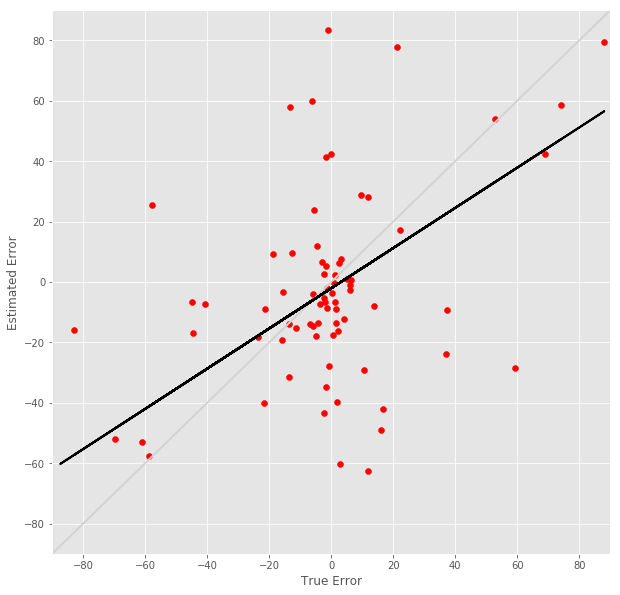

R^2 score for regression on RT: 0.0868
k = 0.3702


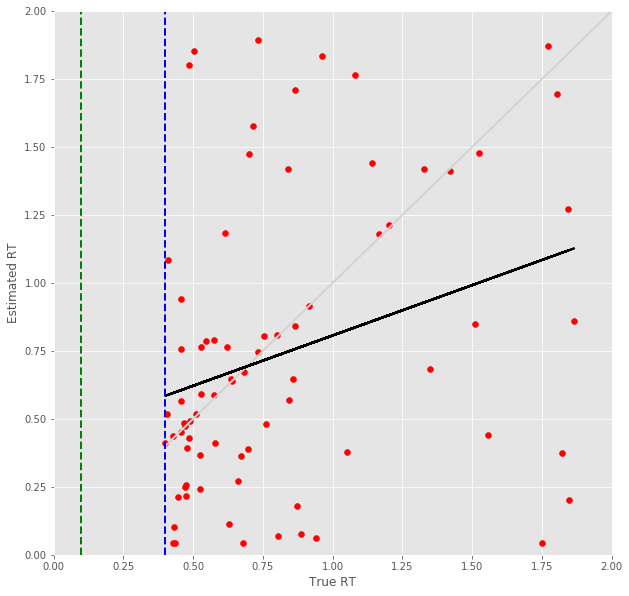

14 -step(s) forecast:
Test Score for 14 -steps forecast: 3.4001 RMSE
Predict Score for 14 -steps forecast: 2.6915 RMSE
Error Test Score for 14 -steps forecast: 0.4229 RMSE
RT Test Score for 14 -steps forecast: 0.3789 RMSE
Error Test Corr for 14 -steps forecast: 0.7628
RT Test Corr for 14 -steps forecast: 0.6445


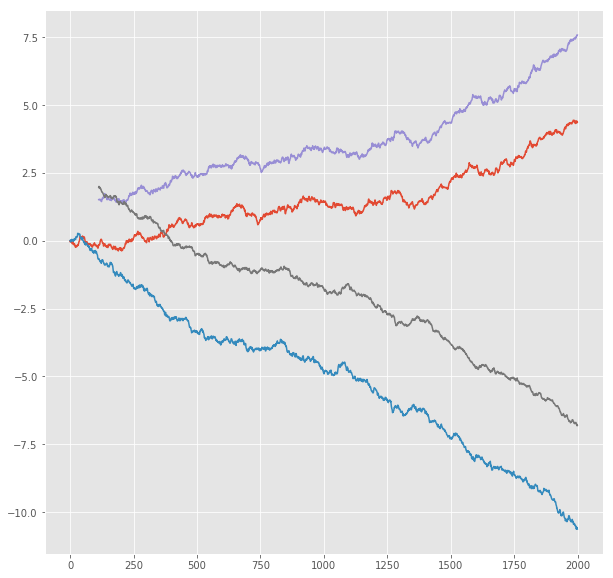

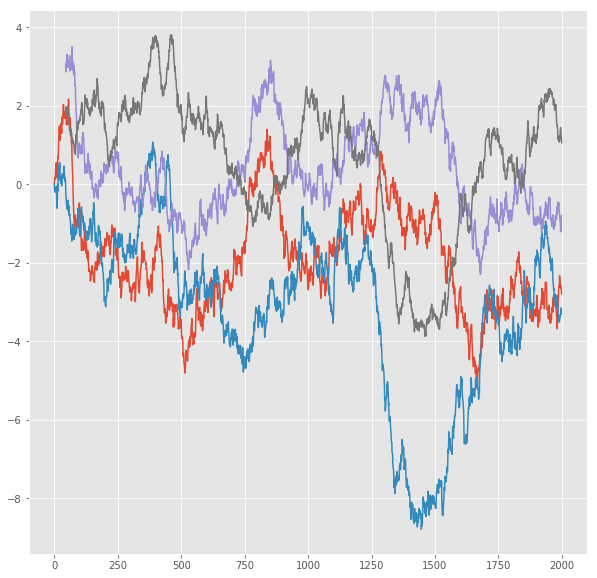

R^2 score for regression on Error: 0.5818
k = 0.9269


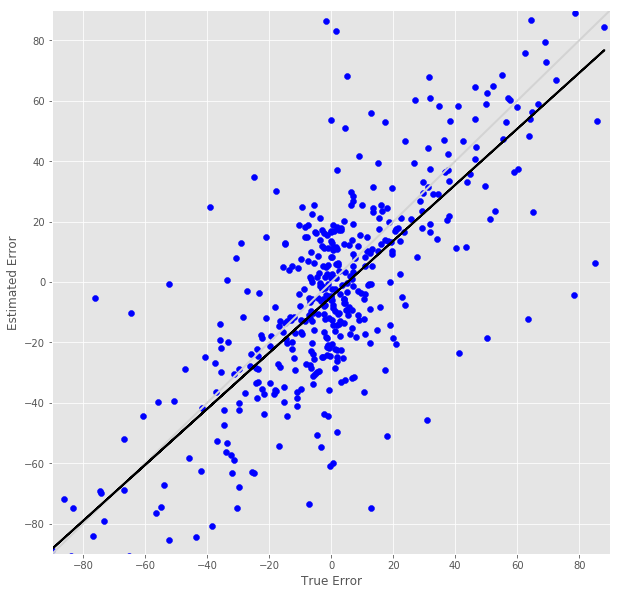

R^2 score for regression on RT: 0.4154
k = 0.8215


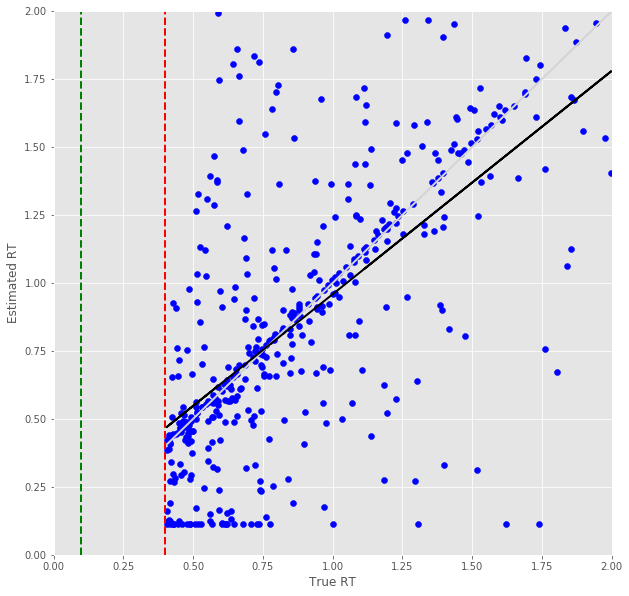

Error Prediction Score: 0.6135 RMSE
RT Prediction Score: 0.5762 RMSE
Error Prediction Corr: 0.5261
RT Prediction Corr: 0.2991
R^2 score for regression on Error: 0.2767
k = 0.6709


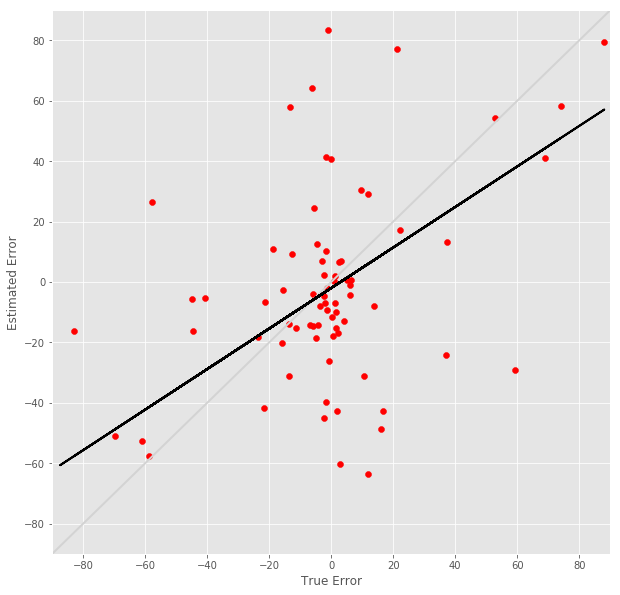

R^2 score for regression on RT: 0.0895
k = 0.3667


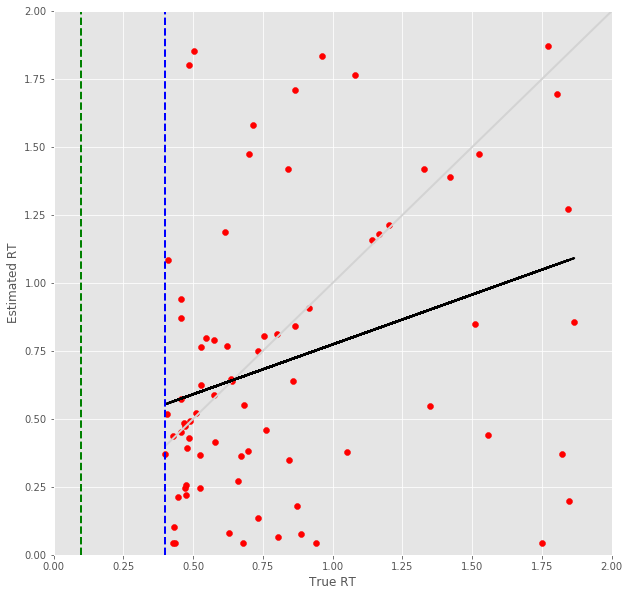

15 -step(s) forecast:
Test Score for 15 -steps forecast: 3.5694 RMSE
Predict Score for 15 -steps forecast: 2.8278 RMSE
Error Test Score for 15 -steps forecast: 0.4395 RMSE
RT Test Score for 15 -steps forecast: 0.3864 RMSE
Error Test Corr for 15 -steps forecast: 0.7501
RT Test Corr for 15 -steps forecast: 0.6356


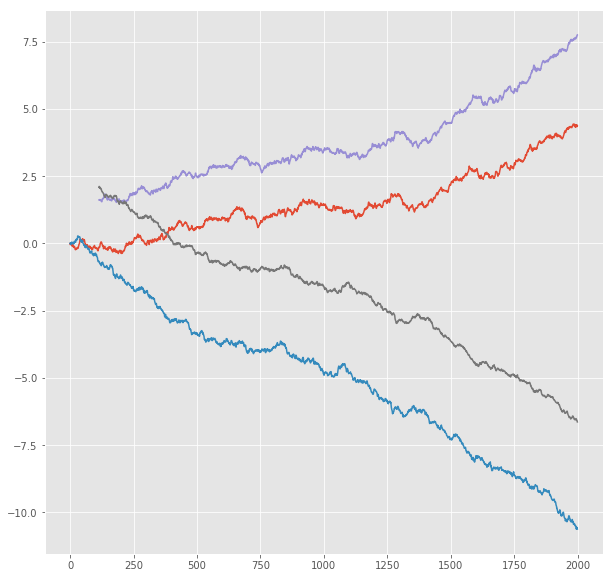

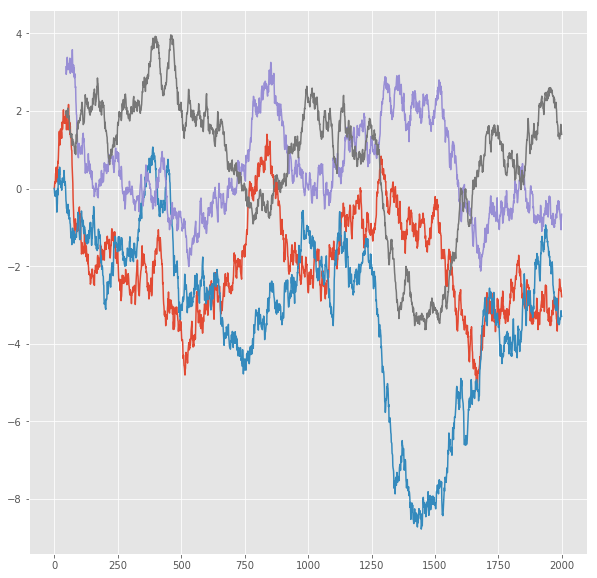

R^2 score for regression on Error: 0.5626
k = 0.9291


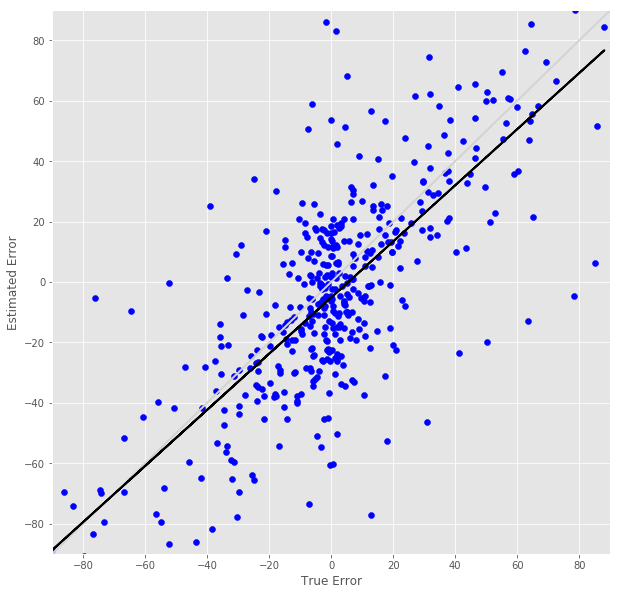

R^2 score for regression on RT: 0.4040
k = 0.8135


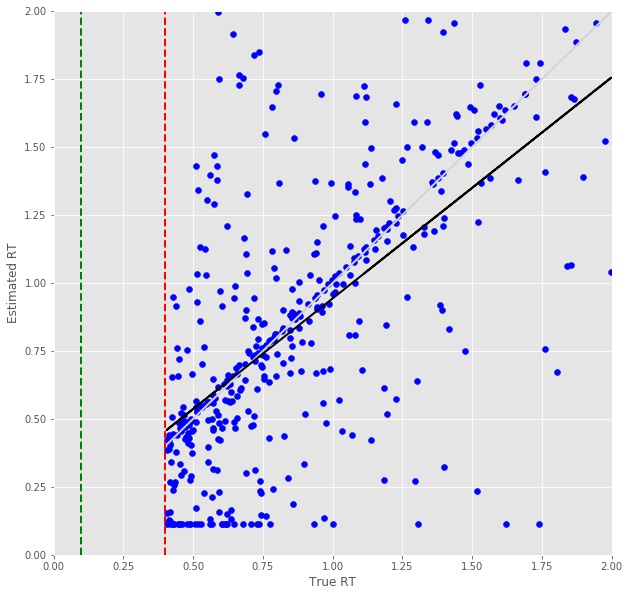

Error Prediction Score: 0.6314 RMSE
RT Prediction Score: 0.5948 RMSE
Error Prediction Corr: 0.5156
RT Prediction Corr: 0.2493
R^2 score for regression on Error: 0.2658
k = 0.6642


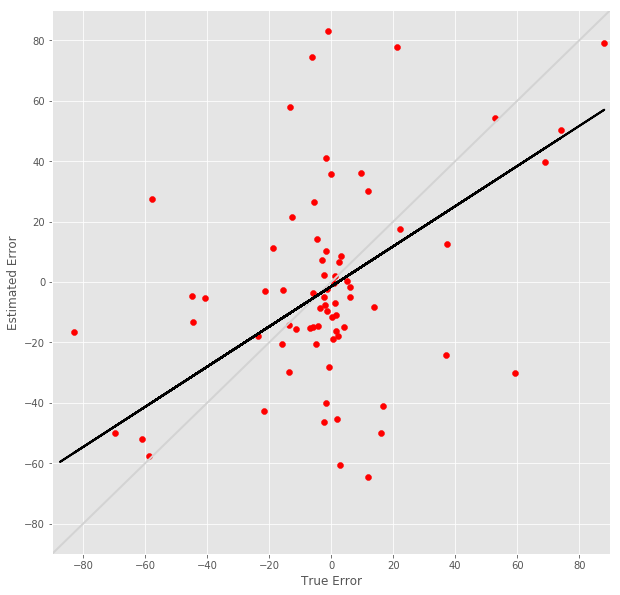

R^2 score for regression on RT: 0.0622
k = 0.2980


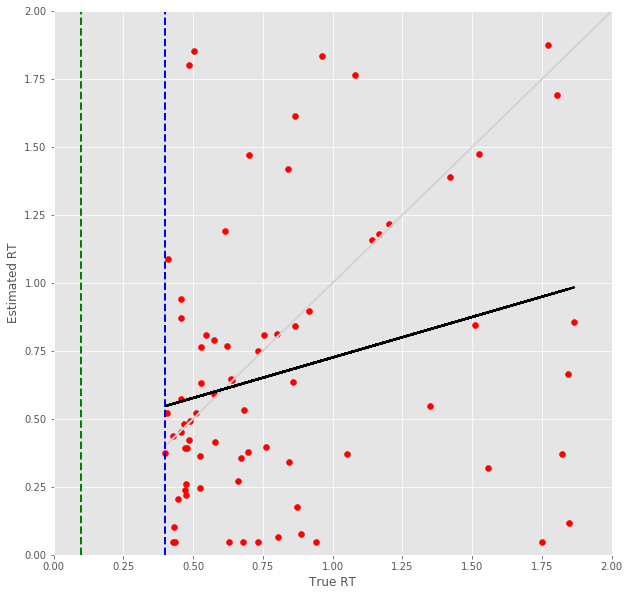

16 -step(s) forecast:
Test Score for 16 -steps forecast: 3.7319 RMSE
Predict Score for 16 -steps forecast: 2.9590 RMSE
Error Test Score for 16 -steps forecast: 0.4586 RMSE
RT Test Score for 16 -steps forecast: 0.3860 RMSE
Error Test Corr for 16 -steps forecast: 0.7338
RT Test Corr for 16 -steps forecast: 0.6415


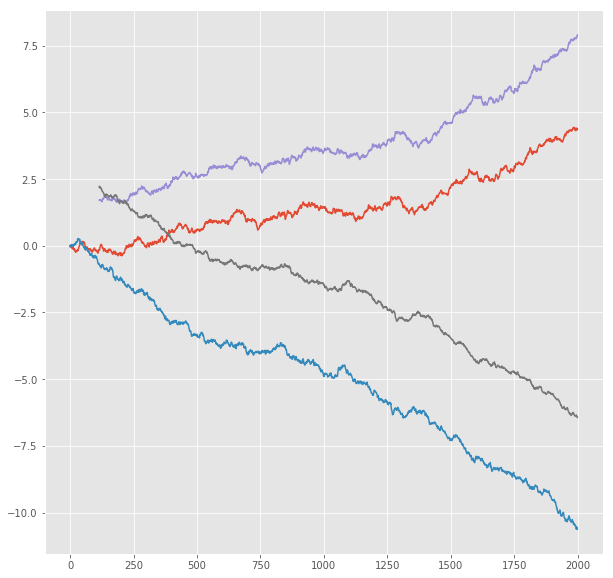

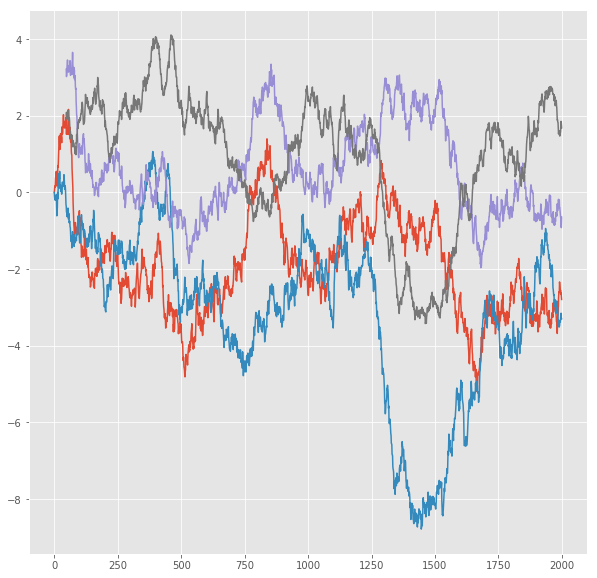

R^2 score for regression on Error: 0.5384
k = 0.9291


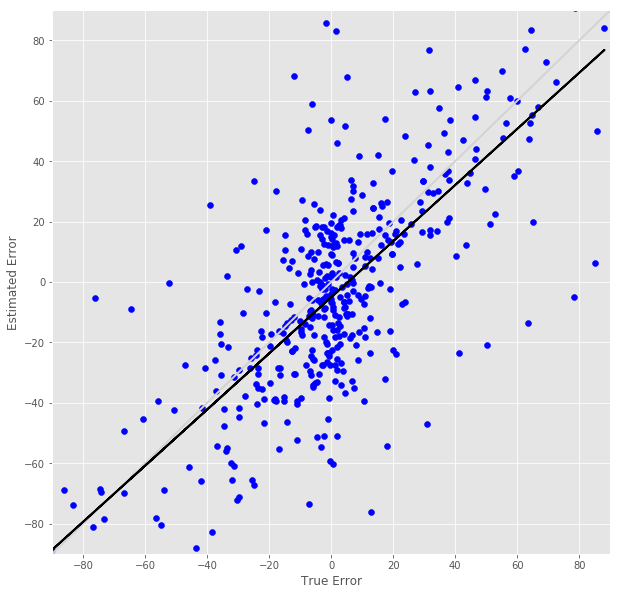

R^2 score for regression on RT: 0.4115
k = 0.8125


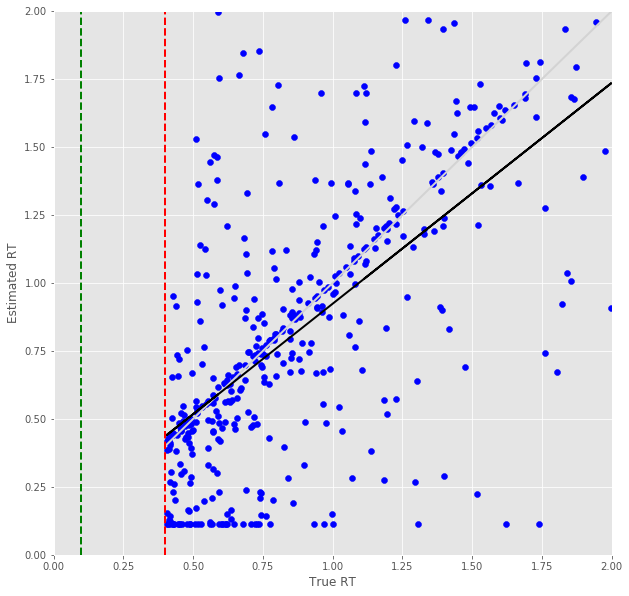

Error Prediction Score: 0.6400 RMSE
RT Prediction Score: 0.6114 RMSE
Error Prediction Corr: 0.5075
RT Prediction Corr: 0.2346
R^2 score for regression on Error: 0.2576
k = 0.6587


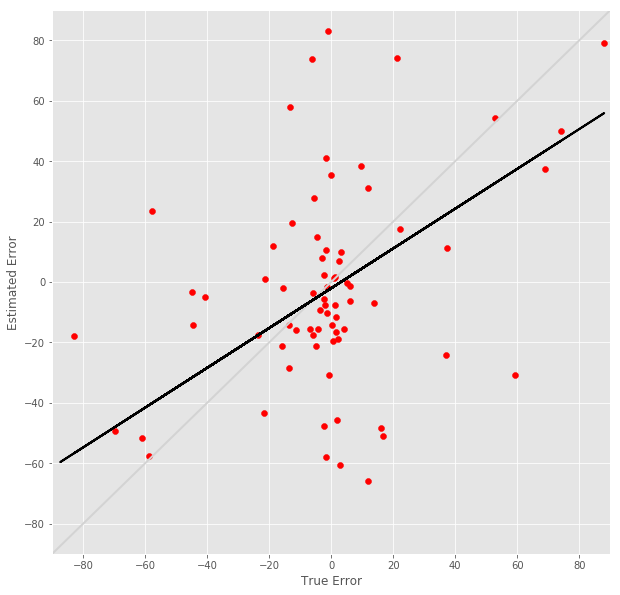

R^2 score for regression on RT: 0.0550
k = 0.2864


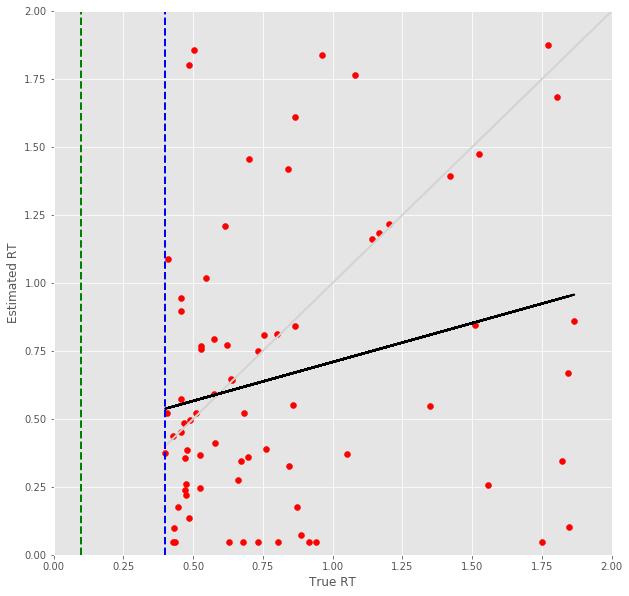

17 -step(s) forecast:
Test Score for 17 -steps forecast: 3.8879 RMSE
Predict Score for 17 -steps forecast: 3.0853 RMSE
Error Test Score for 17 -steps forecast: 0.4728 RMSE
RT Test Score for 17 -steps forecast: 0.3982 RMSE
Error Test Corr for 17 -steps forecast: 0.7284
RT Test Corr for 17 -steps forecast: 0.6307


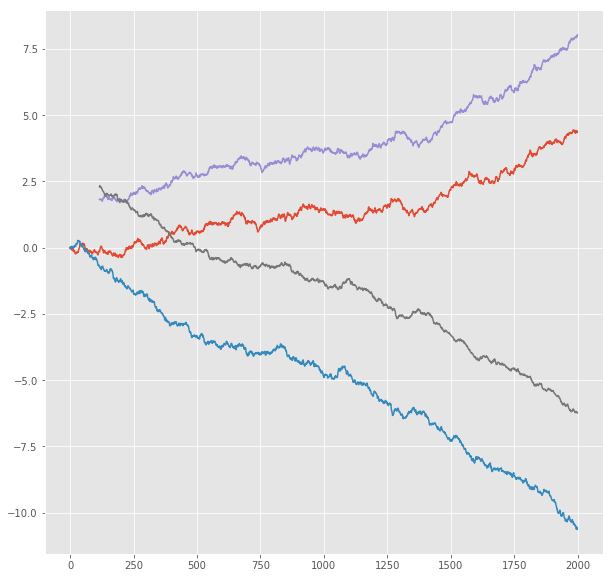

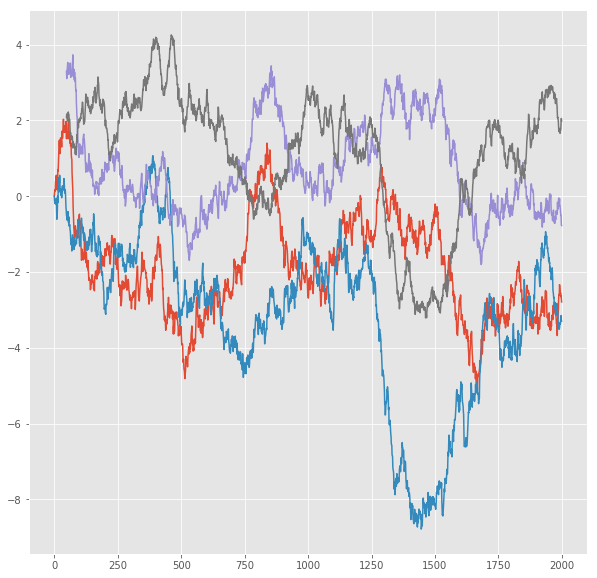

R^2 score for regression on Error: 0.5305
k = 0.9273


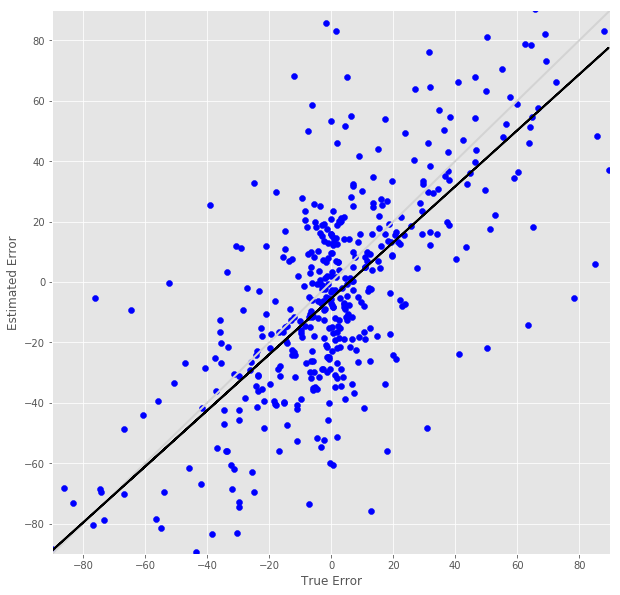

R^2 score for regression on RT: 0.3978
k = 0.8161


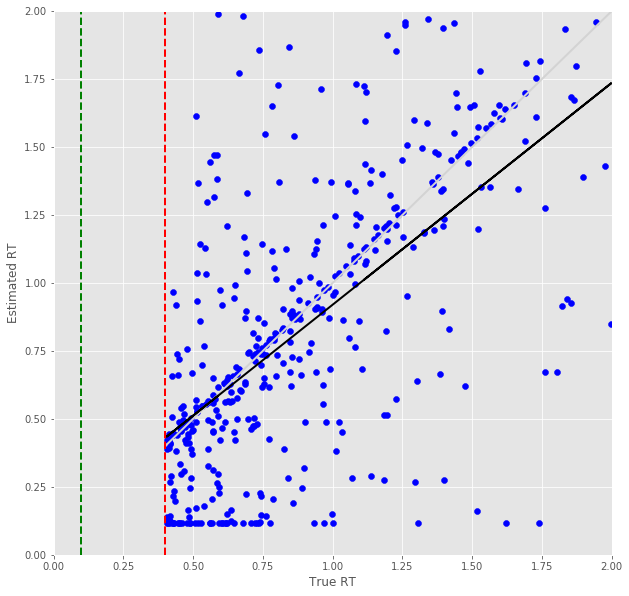

Error Prediction Score: 0.6497 RMSE
RT Prediction Score: 0.6167 RMSE
Error Prediction Corr: 0.5152
RT Prediction Corr: 0.2330
R^2 score for regression on Error: 0.2654
k = 0.6879


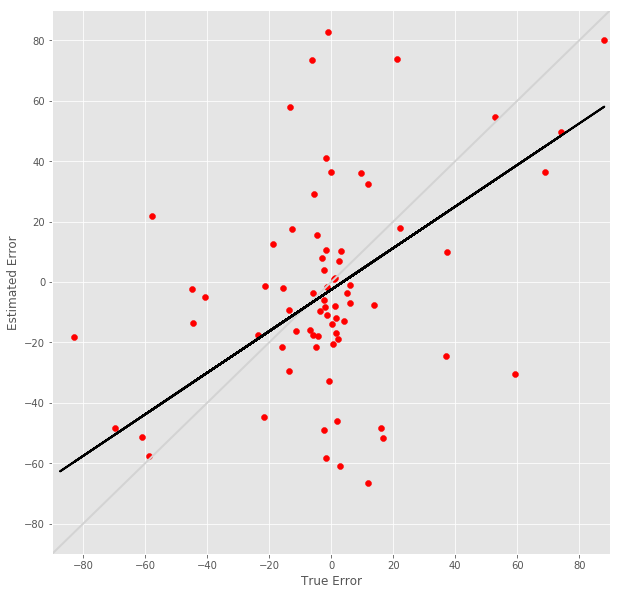

R^2 score for regression on RT: 0.0543
k = 0.2847


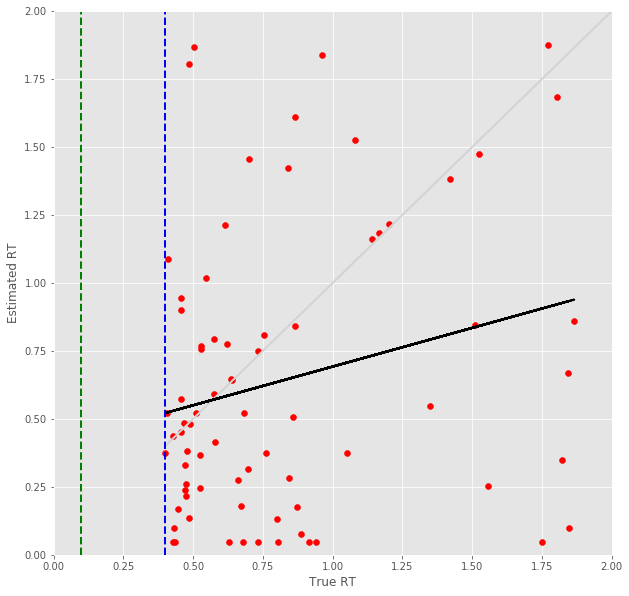

18 -step(s) forecast:
Test Score for 18 -steps forecast: 4.0377 RMSE
Predict Score for 18 -steps forecast: 3.2068 RMSE
Error Test Score for 18 -steps forecast: 0.4878 RMSE
RT Test Score for 18 -steps forecast: 0.4155 RMSE
Error Test Corr for 18 -steps forecast: 0.7193
RT Test Corr for 18 -steps forecast: 0.6076


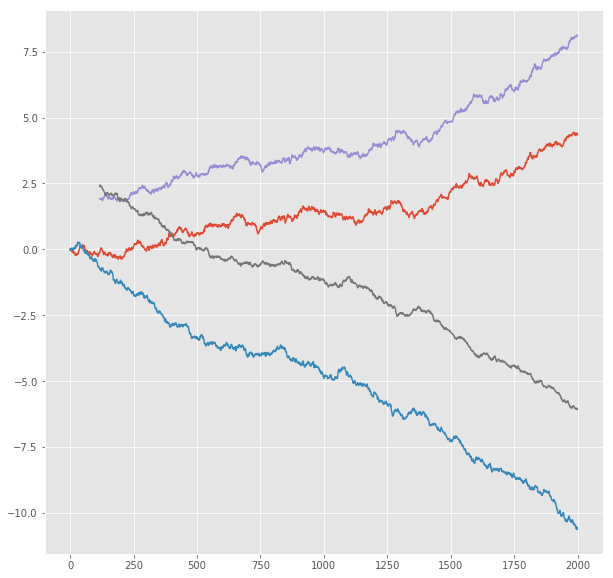

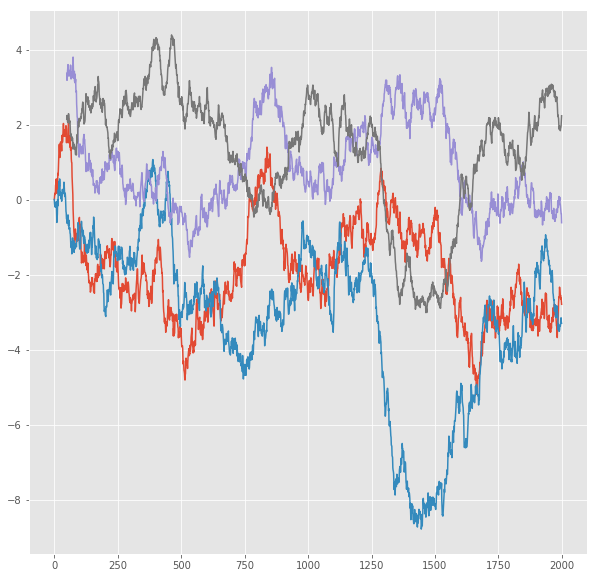

R^2 score for regression on Error: 0.5173
k = 0.9304


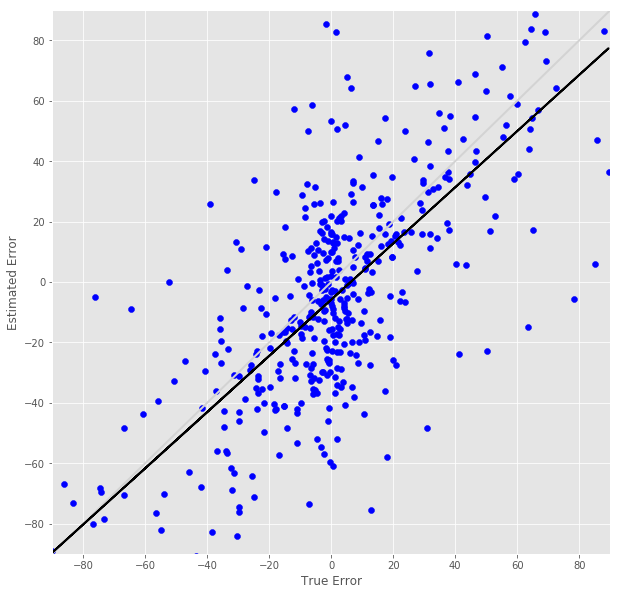

R^2 score for regression on RT: 0.3692
k = 0.7970


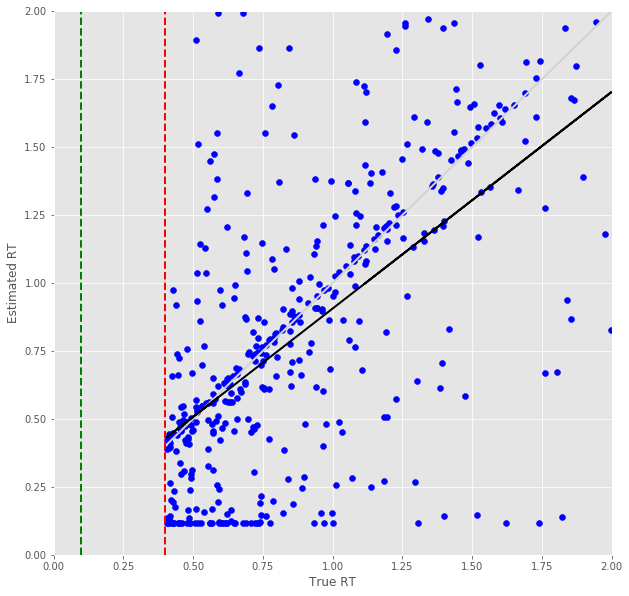

Error Prediction Score: 0.6427 RMSE
RT Prediction Score: 0.6279 RMSE
Error Prediction Corr: 0.5899
RT Prediction Corr: 0.2054
R^2 score for regression on Error: 0.3480
k = 0.8512


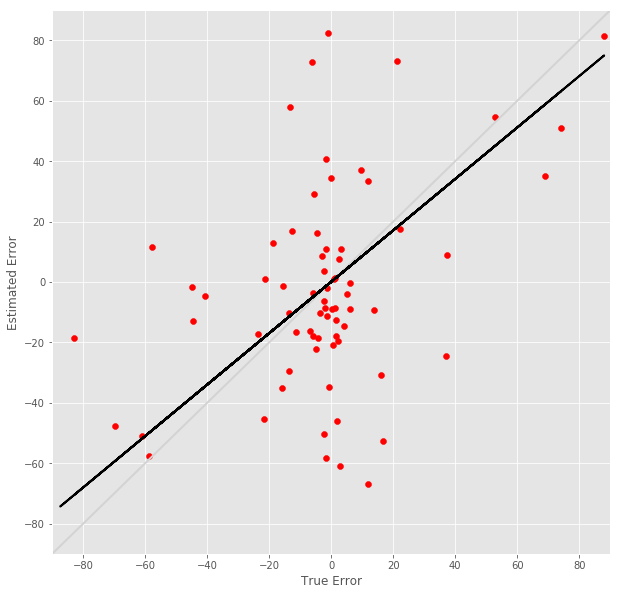

R^2 score for regression on RT: 0.0422
k = 0.2492


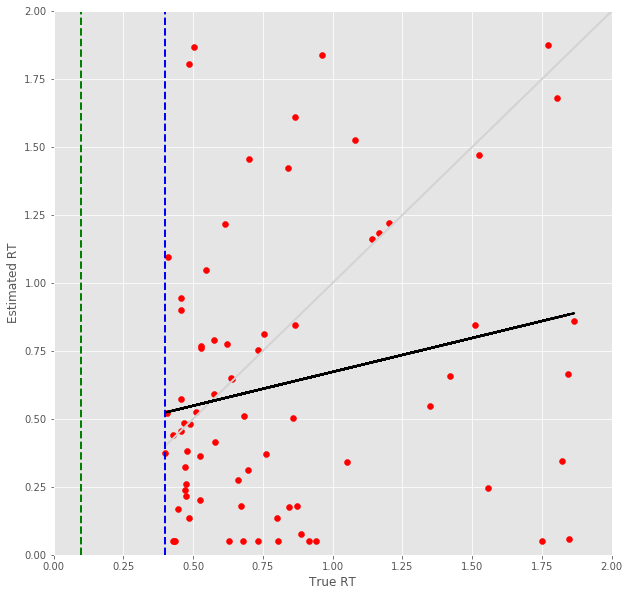

19 -step(s) forecast:
Test Score for 19 -steps forecast: 4.1815 RMSE
Predict Score for 19 -steps forecast: 3.3239 RMSE
Error Test Score for 19 -steps forecast: 0.5046 RMSE
RT Test Score for 19 -steps forecast: 0.4257 RMSE
Error Test Corr for 19 -steps forecast: 0.7063
RT Test Corr for 19 -steps forecast: 0.5931


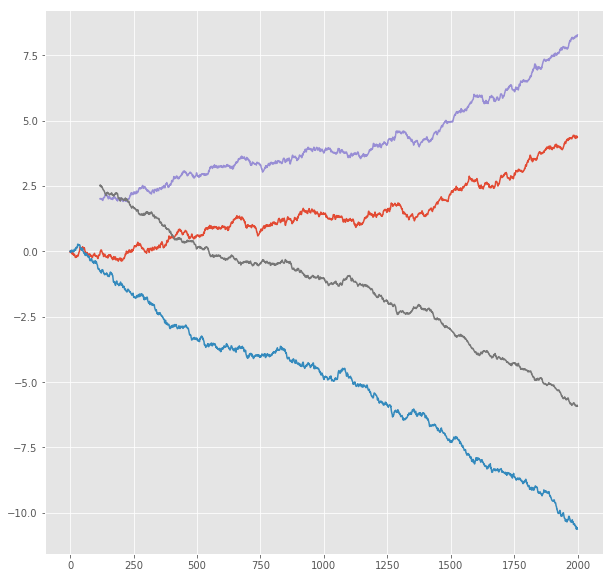

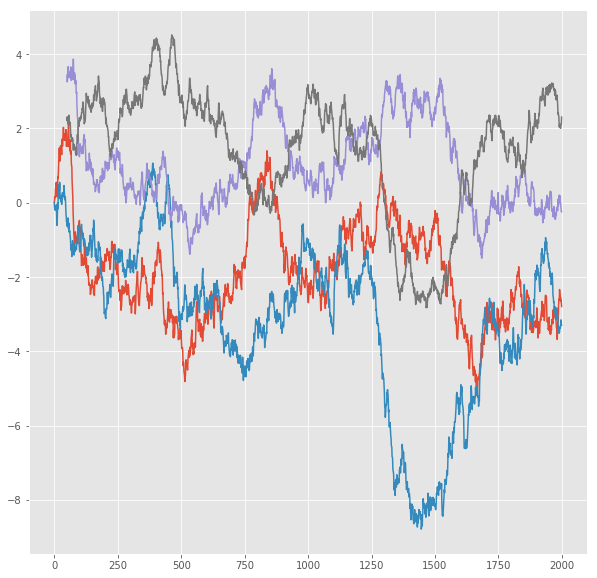

R^2 score for regression on Error: 0.4989
k = 0.9318


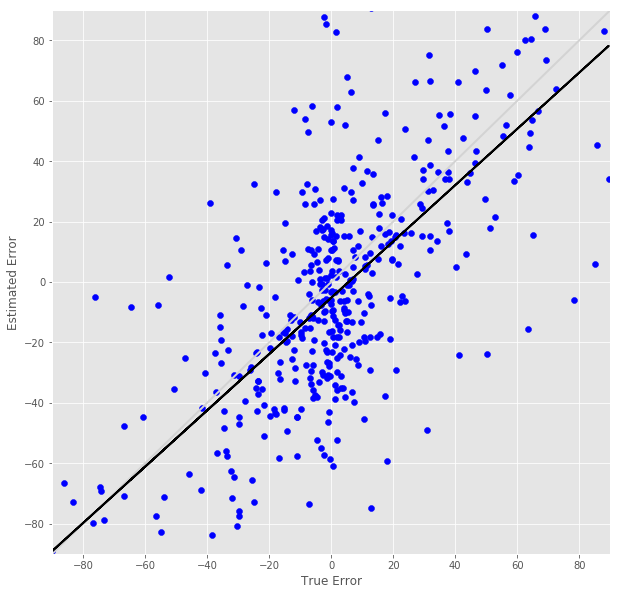

R^2 score for regression on RT: 0.3518
k = 0.7752


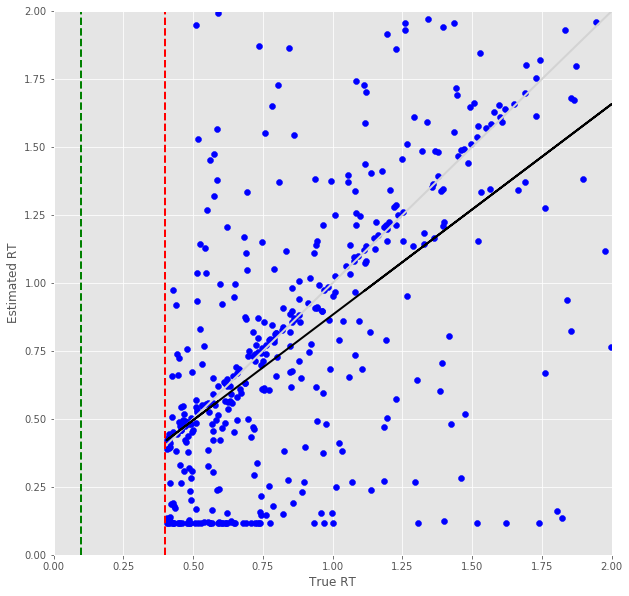

Error Prediction Score: 0.6579 RMSE
RT Prediction Score: 0.6352 RMSE
Error Prediction Corr: 0.5769
RT Prediction Corr: 0.1407
R^2 score for regression on Error: 0.3328
k = 0.8417


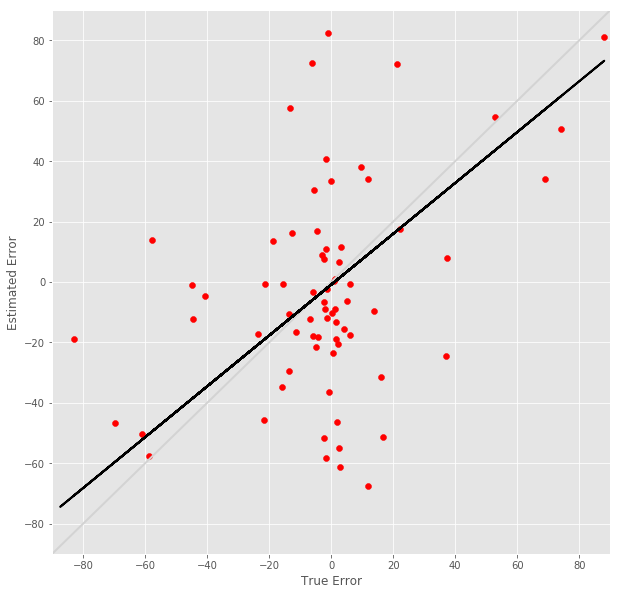

R^2 score for regression on RT: 0.0198
k = 0.1716


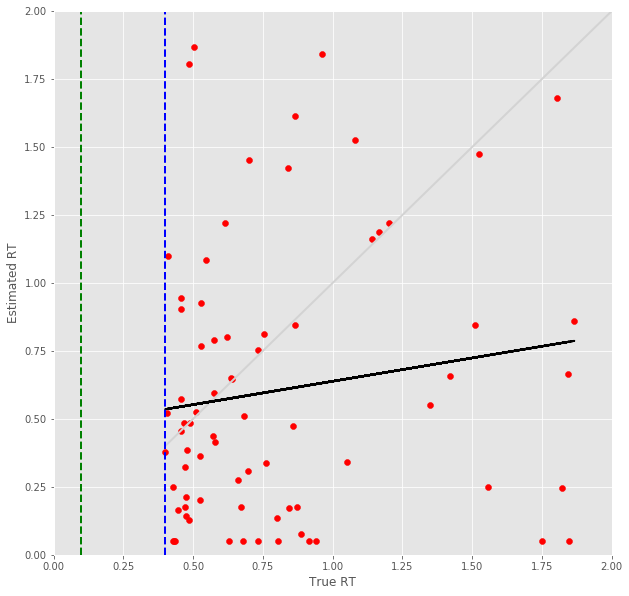

20 -step(s) forecast:
Test Score for 20 -steps forecast: 4.3198 RMSE
Predict Score for 20 -steps forecast: 3.4368 RMSE
Error Test Score for 20 -steps forecast: 0.5297 RMSE
RT Test Score for 20 -steps forecast: 0.4333 RMSE
Error Test Corr for 20 -steps forecast: 0.6929
RT Test Corr for 20 -steps forecast: 0.5886


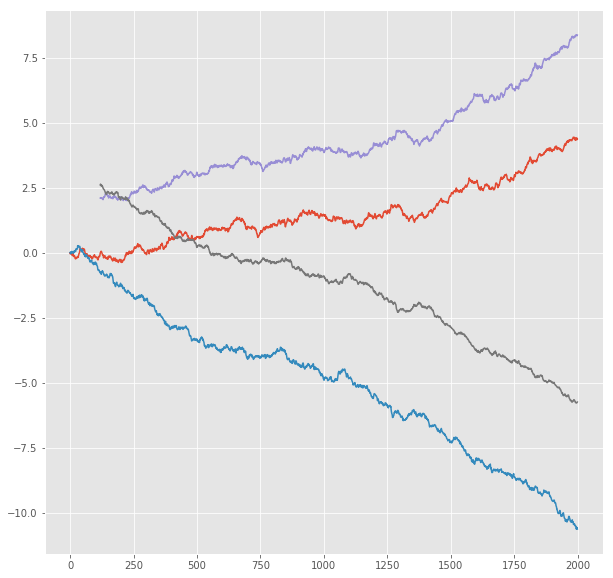

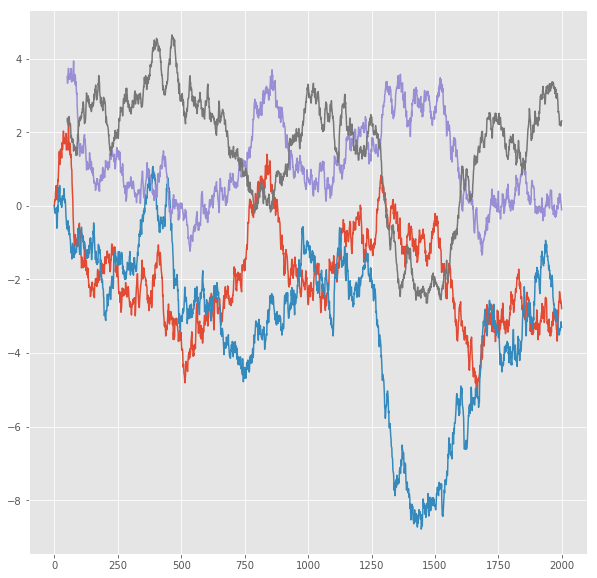

R^2 score for regression on Error: 0.4801
k = 0.9425


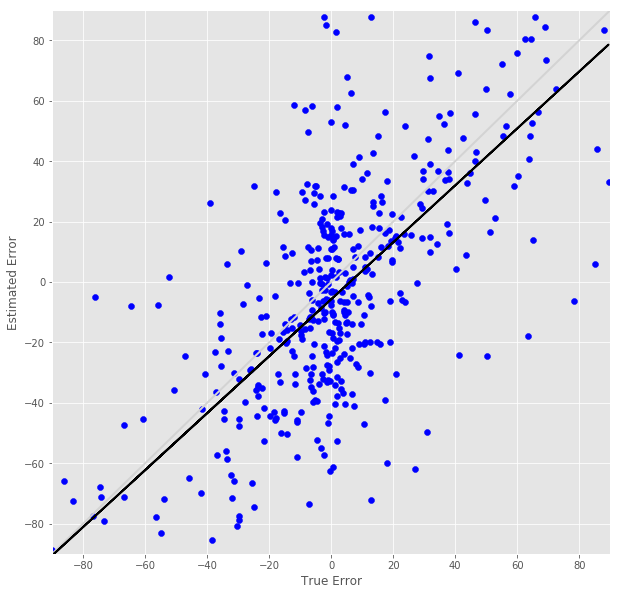

R^2 score for regression on RT: 0.3465
k = 0.7767


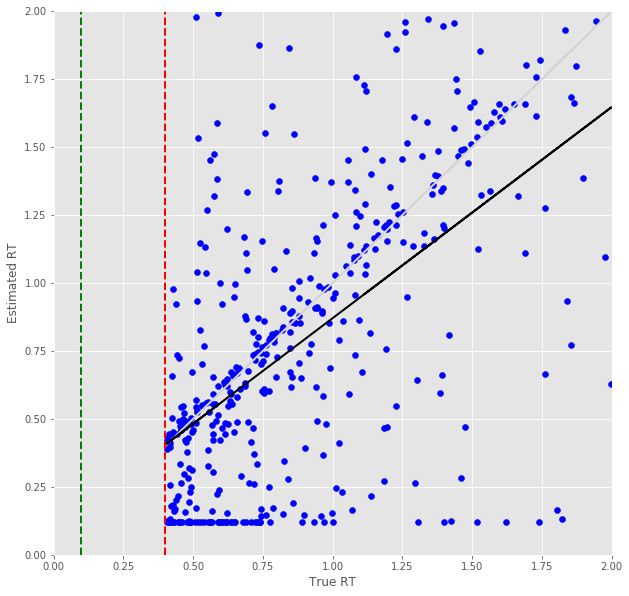

Error Prediction Score: 0.6706 RMSE
RT Prediction Score: 0.6373 RMSE
Error Prediction Corr: 0.5742
RT Prediction Corr: 0.1667
R^2 score for regression on Error: 0.3297
k = 0.8405


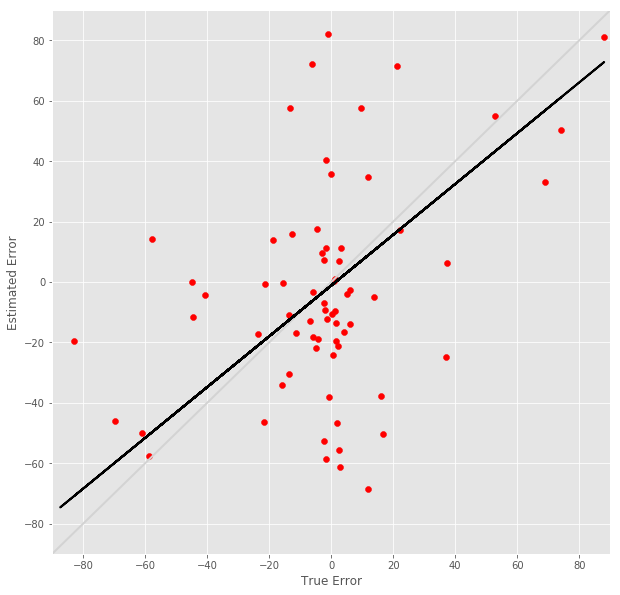

R^2 score for regression on RT: 0.0278
k = 0.2022


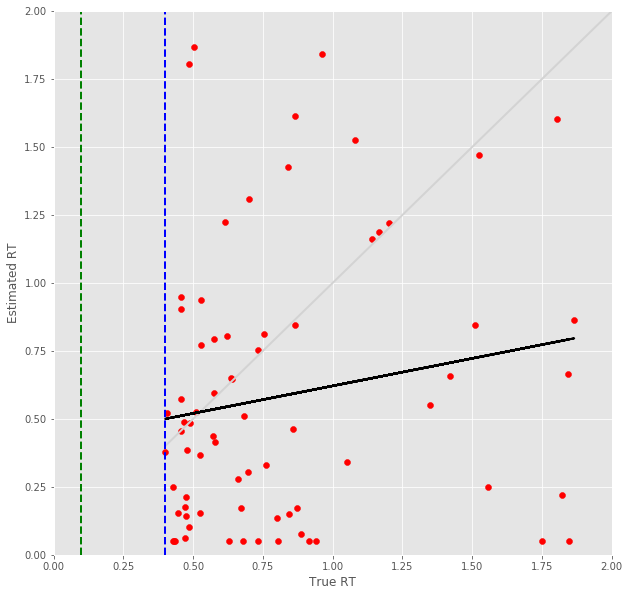

21 -step(s) forecast:
Test Score for 21 -steps forecast: 4.4527 RMSE
Predict Score for 21 -steps forecast: 3.5457 RMSE
Error Test Score for 21 -steps forecast: 0.5370 RMSE
RT Test Score for 21 -steps forecast: 0.4391 RMSE
Error Test Corr for 21 -steps forecast: 0.6875
RT Test Corr for 21 -steps forecast: 0.5817


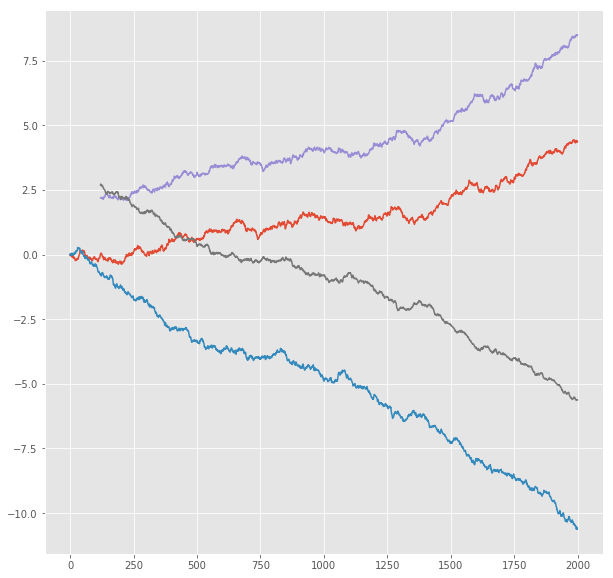

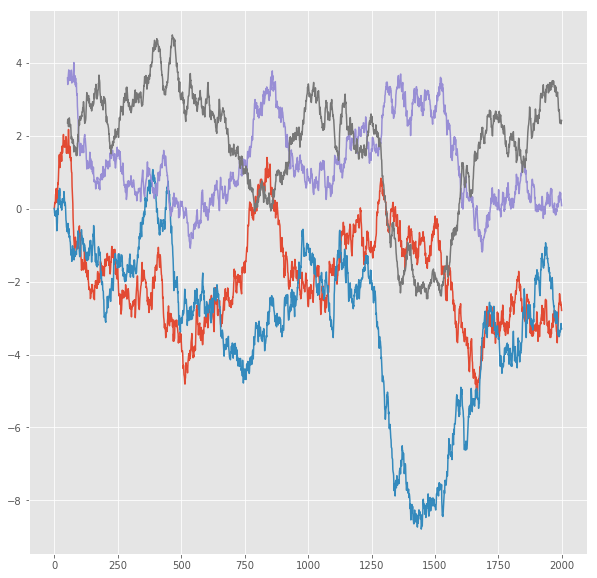

R^2 score for regression on Error: 0.4727
k = 0.9376


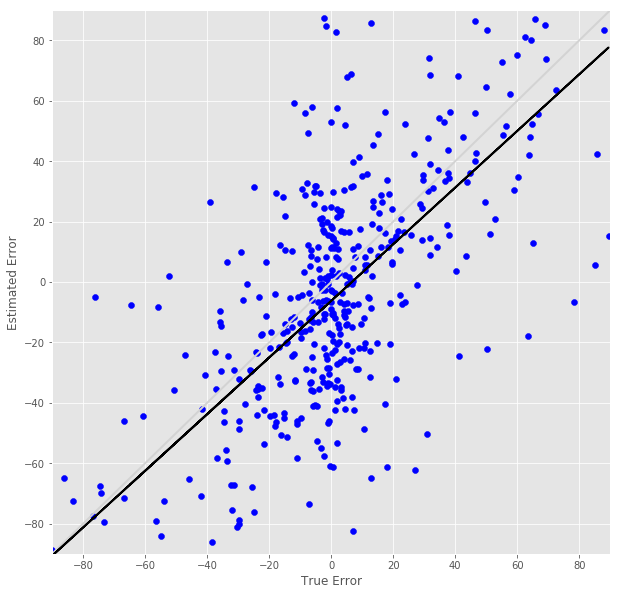

R^2 score for regression on RT: 0.3383
k = 0.7641


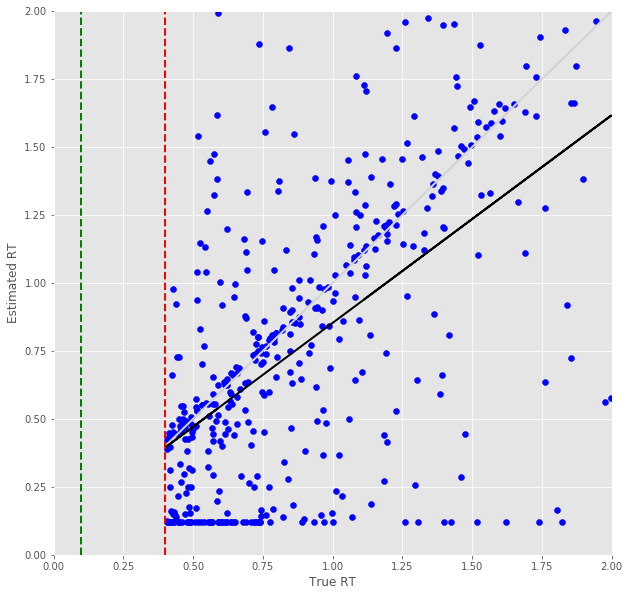

Error Prediction Score: 0.6702 RMSE
RT Prediction Score: 0.6394 RMSE
Error Prediction Corr: 0.5456
RT Prediction Corr: 0.1280
R^2 score for regression on Error: 0.2976
k = 0.7808


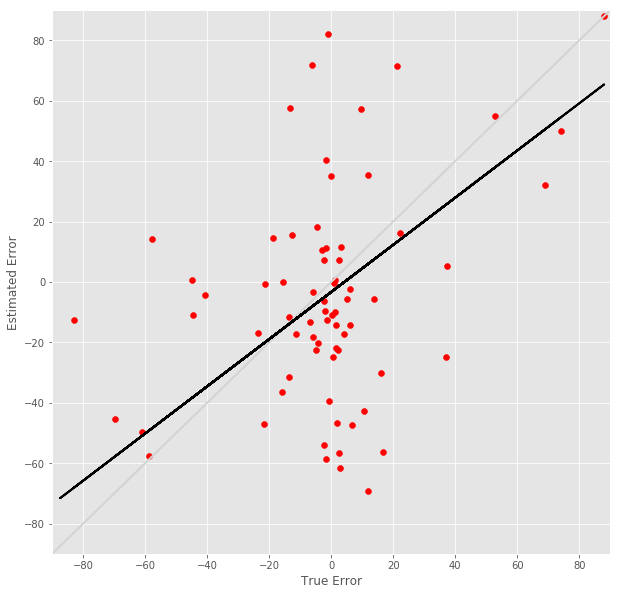

R^2 score for regression on RT: 0.0164
k = 0.1527


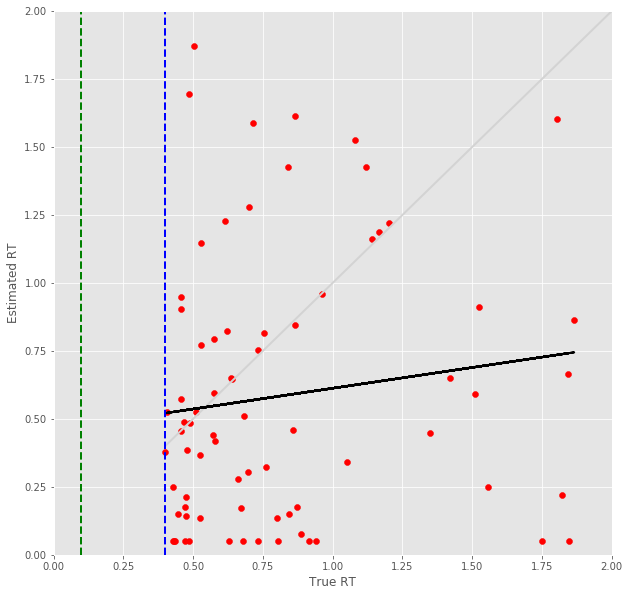

22 -step(s) forecast:
Test Score for 22 -steps forecast: 4.5806 RMSE
Predict Score for 22 -steps forecast: 3.6508 RMSE
Error Test Score for 22 -steps forecast: 0.5468 RMSE
RT Test Score for 22 -steps forecast: 0.4444 RMSE
Error Test Corr for 22 -steps forecast: 0.6822
RT Test Corr for 22 -steps forecast: 0.5783


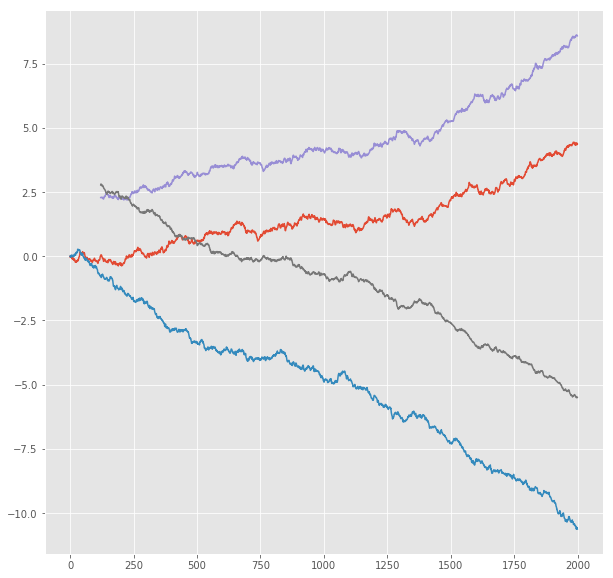

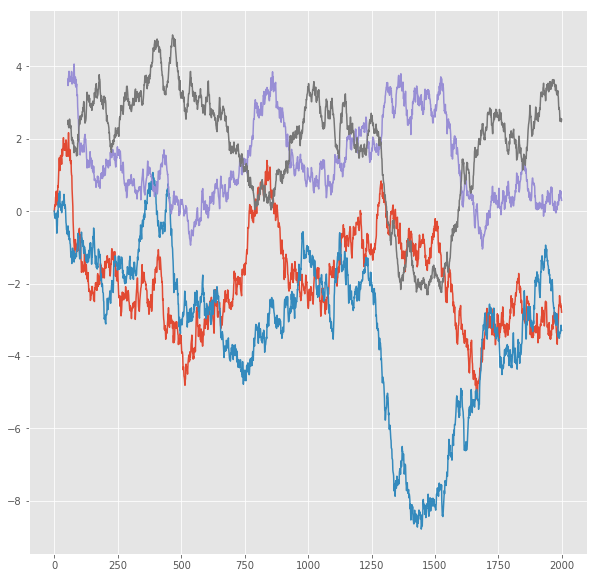

R^2 score for regression on Error: 0.4654
k = 0.9431


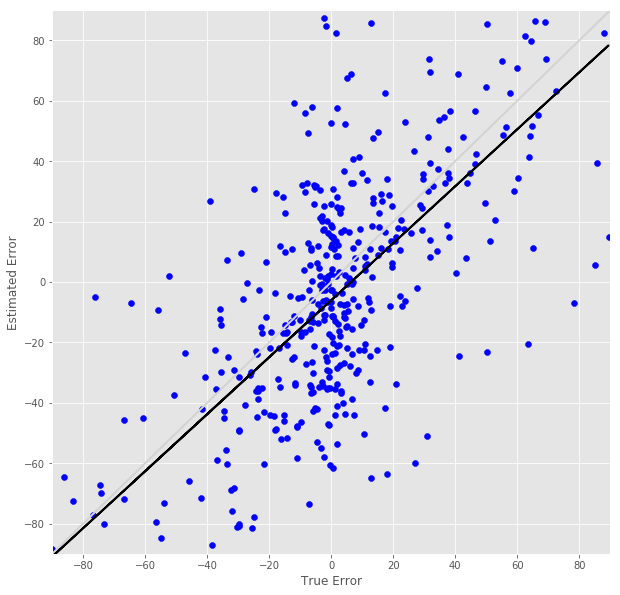

R^2 score for regression on RT: 0.3345
k = 0.7647


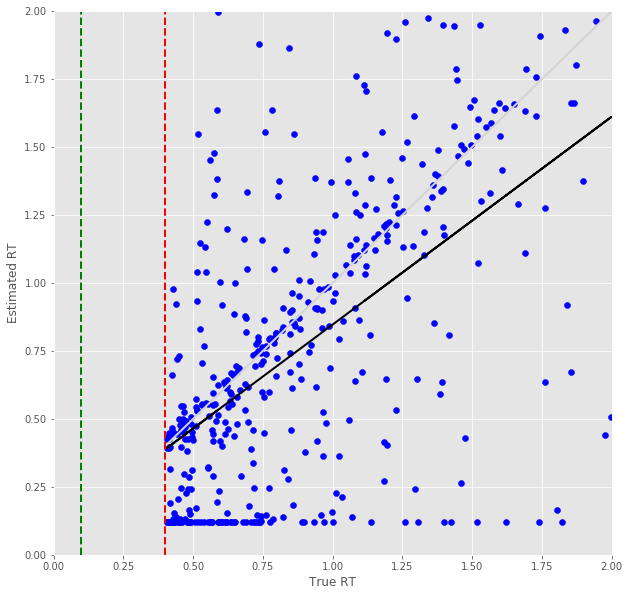

Error Prediction Score: 0.6692 RMSE
RT Prediction Score: 0.6588 RMSE
Error Prediction Corr: 0.5411
RT Prediction Corr: 0.1117
R^2 score for regression on Error: 0.2928
k = 0.7685


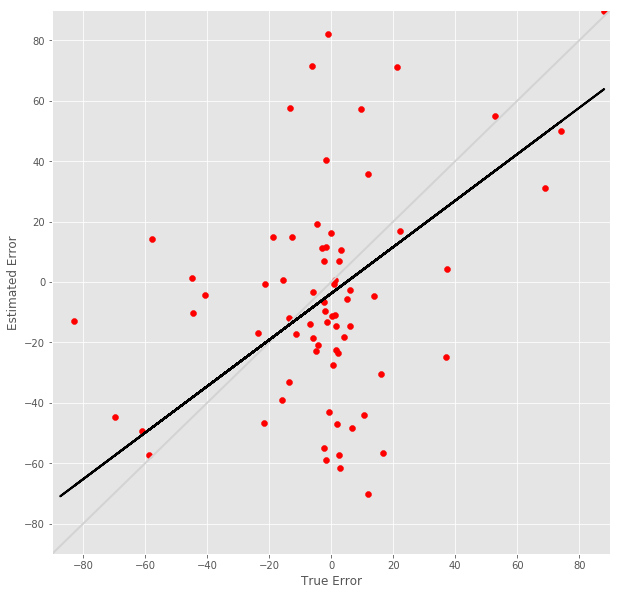

R^2 score for regression on RT: 0.0125
k = 0.1386


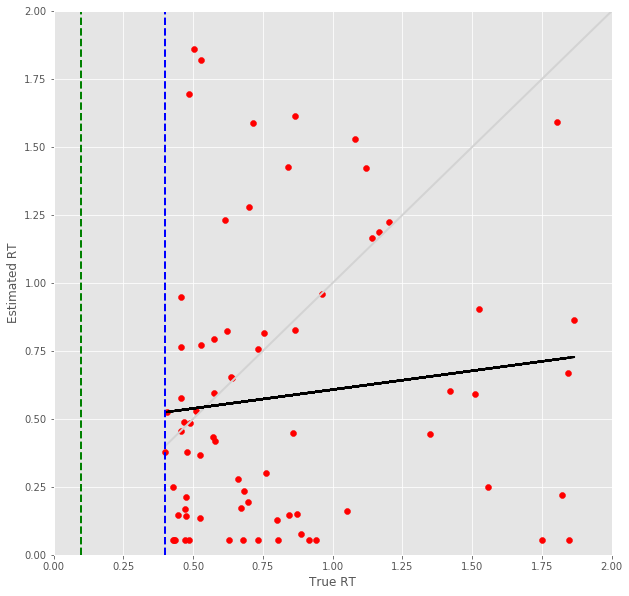

23 -step(s) forecast:
Test Score for 23 -steps forecast: 4.7037 RMSE
Predict Score for 23 -steps forecast: 3.7523 RMSE
Error Test Score for 23 -steps forecast: 0.5580 RMSE
RT Test Score for 23 -steps forecast: 0.4506 RMSE
Error Test Corr for 23 -steps forecast: 0.6764
RT Test Corr for 23 -steps forecast: 0.5707


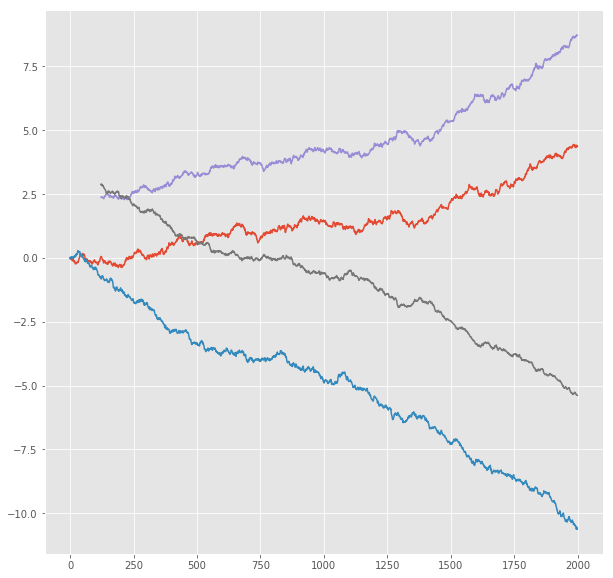

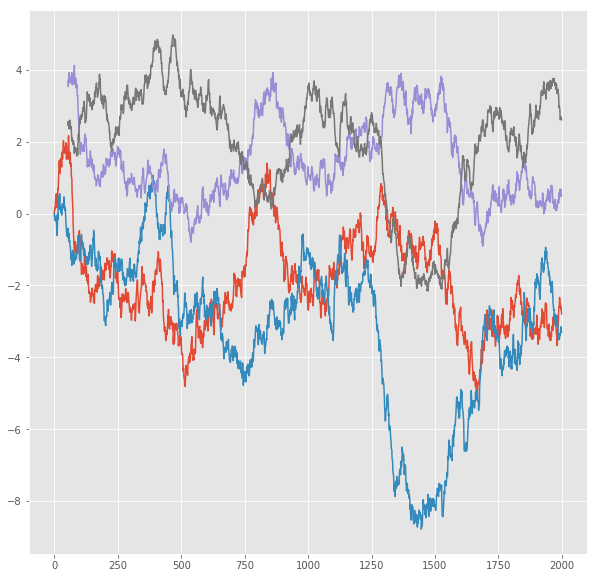

R^2 score for regression on Error: 0.4576
k = 0.9455


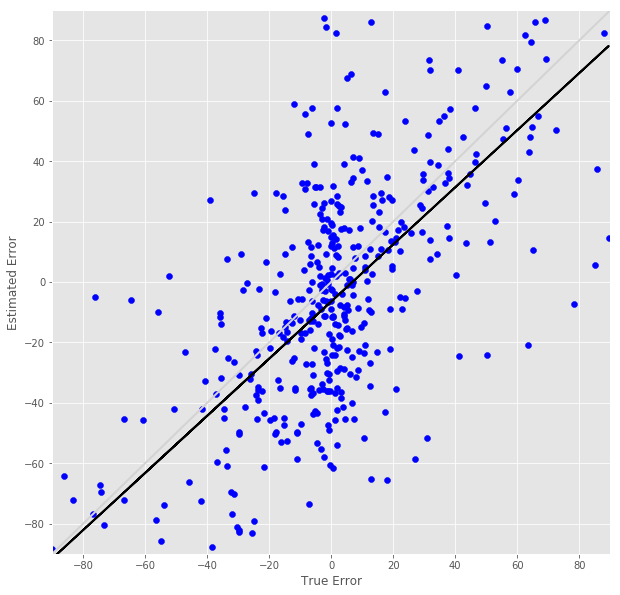

R^2 score for regression on RT: 0.3257
k = 0.7555


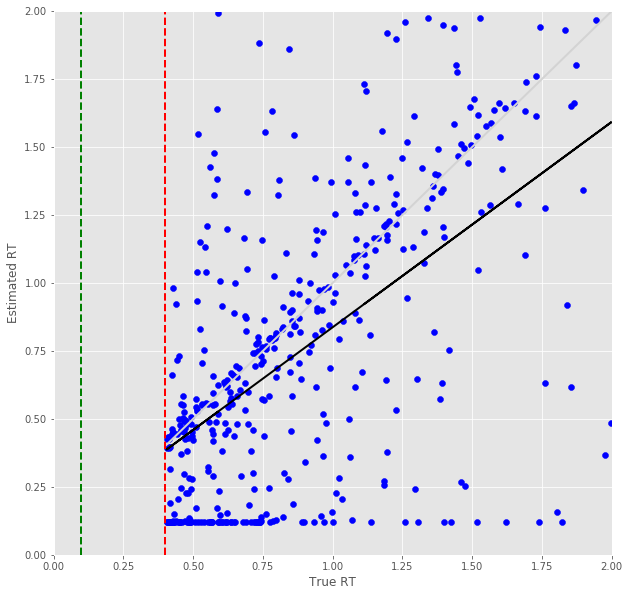

Error Prediction Score: 0.6722 RMSE
RT Prediction Score: 0.6671 RMSE
Error Prediction Corr: 0.5421
RT Prediction Corr: 0.0985
R^2 score for regression on Error: 0.2938
k = 0.7745


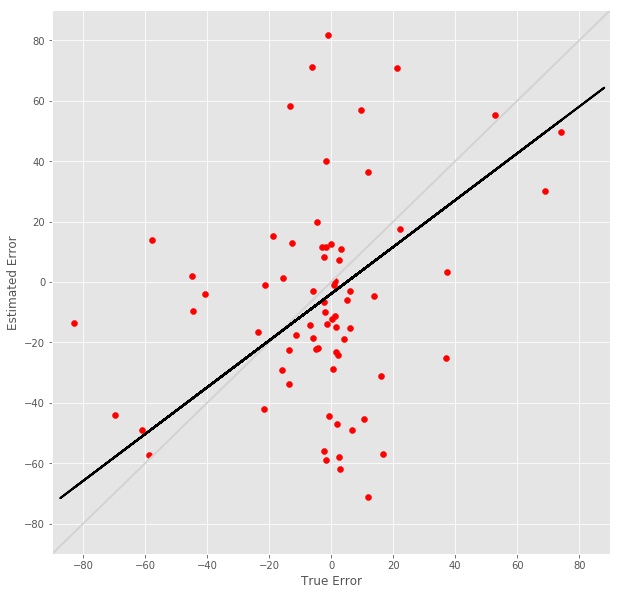

R^2 score for regression on RT: 0.0097
k = 0.1226


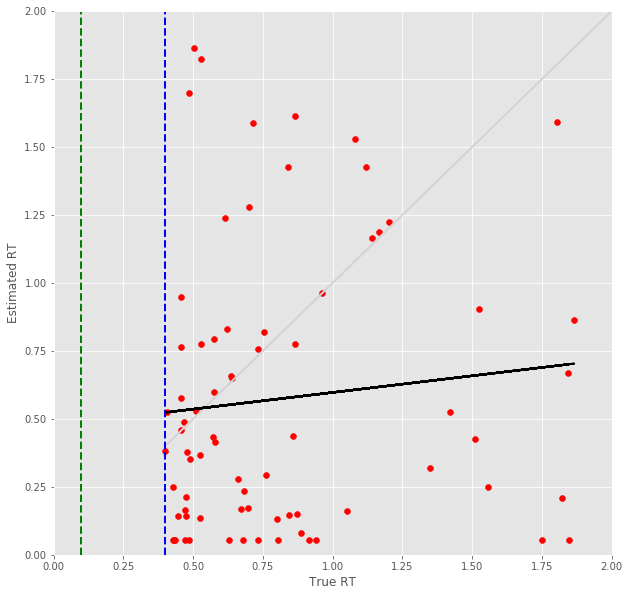

24 -step(s) forecast:
Test Score for 24 -steps forecast: 4.8222 RMSE
Predict Score for 24 -steps forecast: 3.8503 RMSE
Error Test Score for 24 -steps forecast: 0.5810 RMSE
RT Test Score for 24 -steps forecast: 0.4607 RMSE
Error Test Corr for 24 -steps forecast: 0.6661
RT Test Corr for 24 -steps forecast: 0.5539


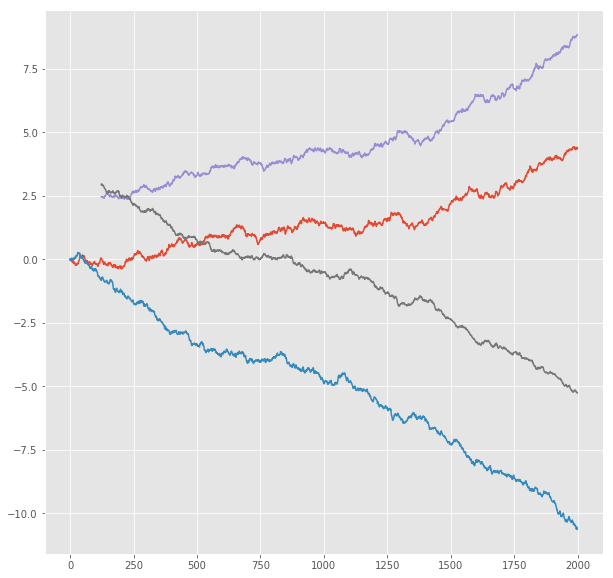

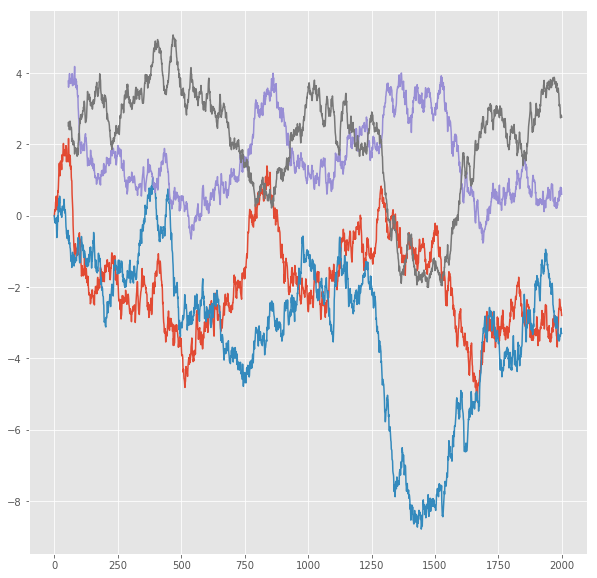

R^2 score for regression on Error: 0.4437
k = 0.9618


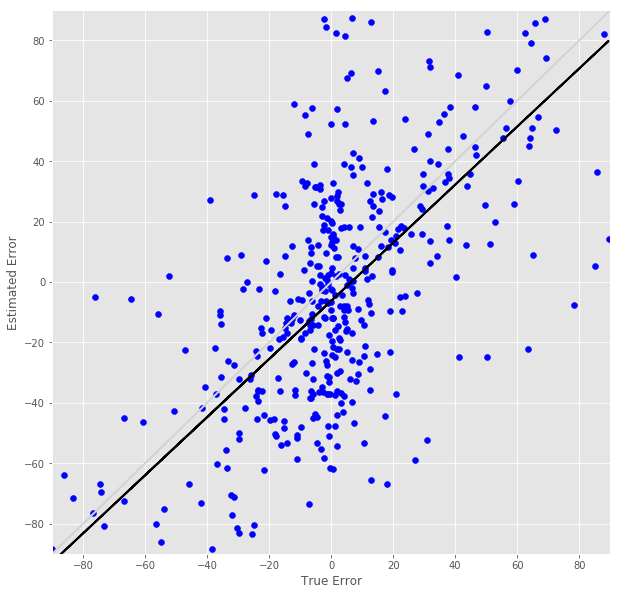

R^2 score for regression on RT: 0.3068
k = 0.7293


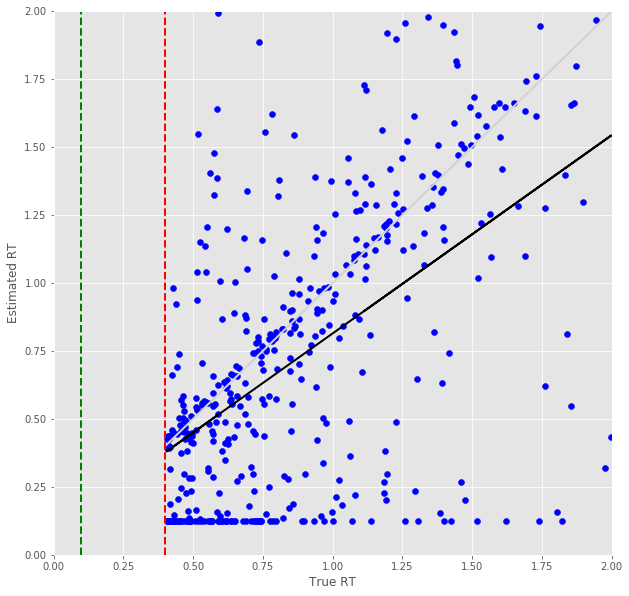

Error Prediction Score: 0.6853 RMSE
RT Prediction Score: 0.6790 RMSE
Error Prediction Corr: 0.5347
RT Prediction Corr: 0.0731
R^2 score for regression on Error: 0.2859
k = 0.7687


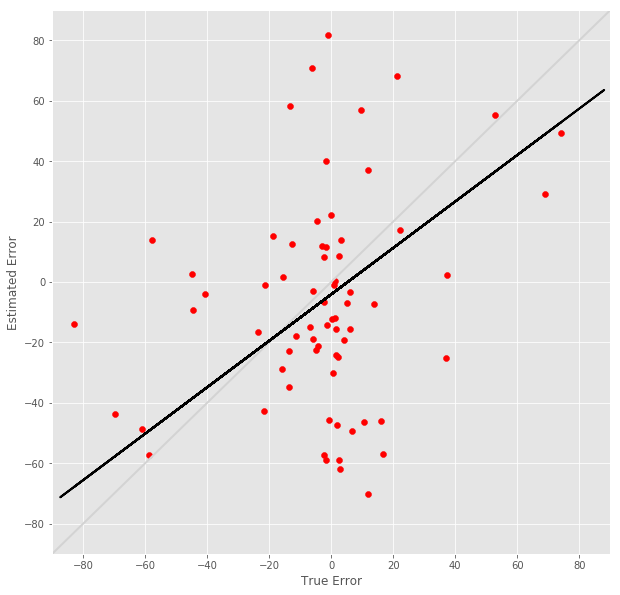

R^2 score for regression on RT: 0.0053
k = 0.0892


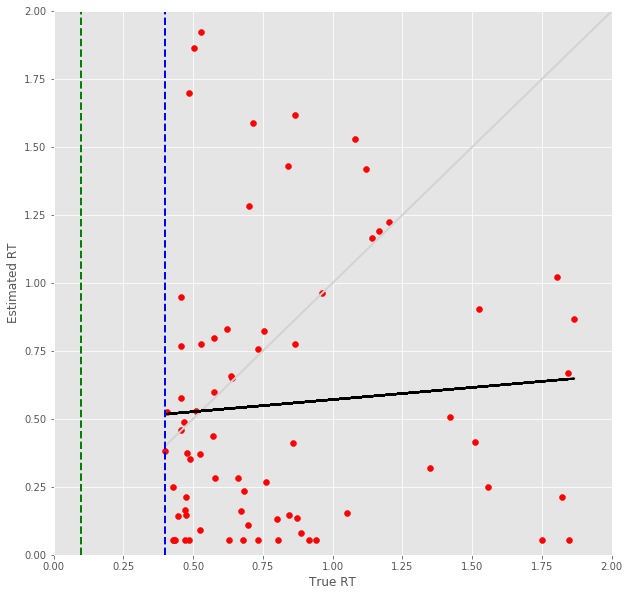

25 -step(s) forecast:
Test Score for 25 -steps forecast: 4.9364 RMSE
Predict Score for 25 -steps forecast: 3.9450 RMSE
Error Test Score for 25 -steps forecast: 0.5870 RMSE
RT Test Score for 25 -steps forecast: 0.4677 RMSE
Error Test Corr for 25 -steps forecast: 0.6686
RT Test Corr for 25 -steps forecast: 0.5481


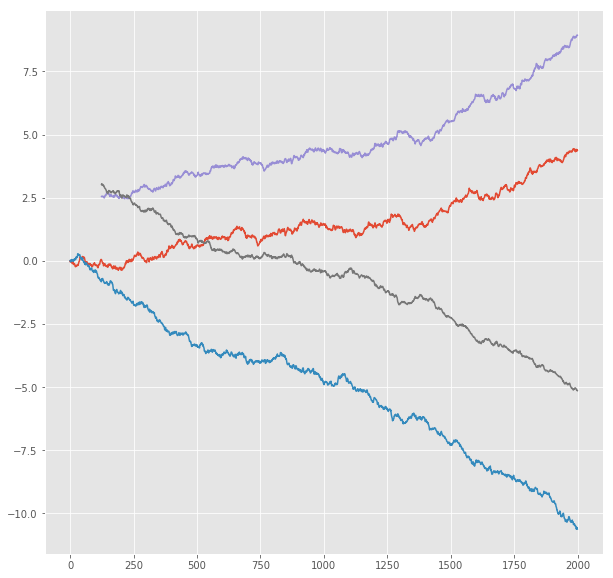

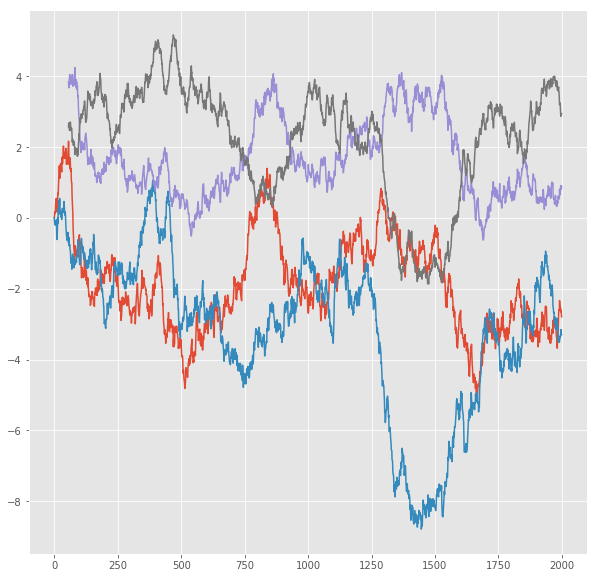

R^2 score for regression on Error: 0.4470
k = 0.9804


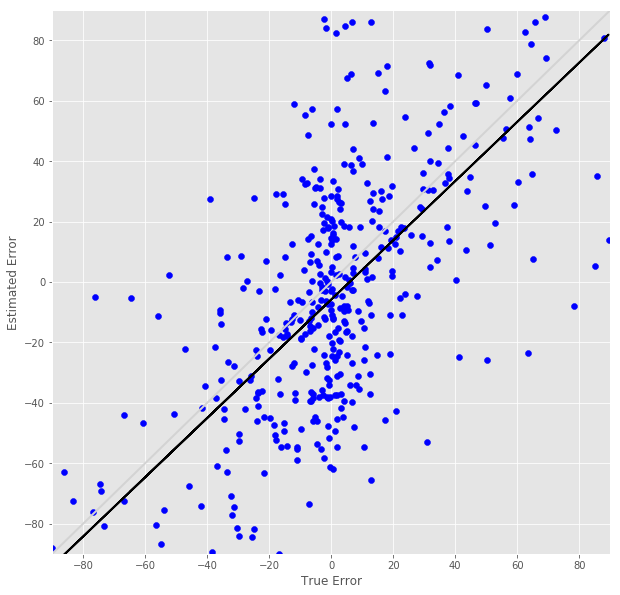

R^2 score for regression on RT: 0.3004
k = 0.7239


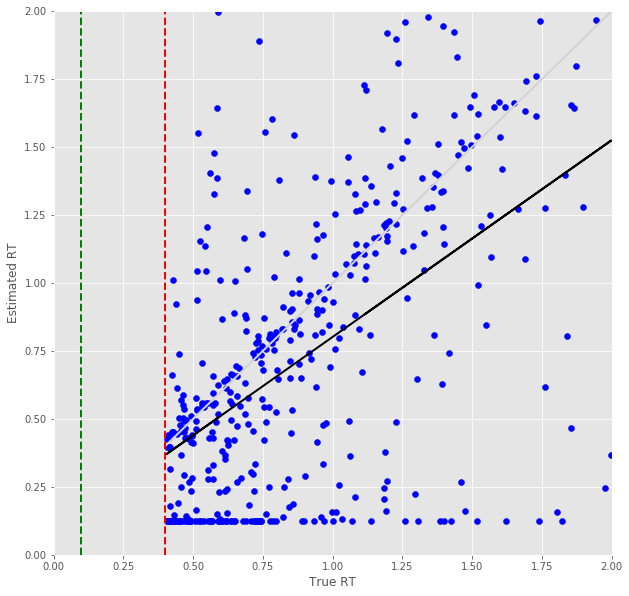

Error Prediction Score: 0.7033 RMSE
RT Prediction Score: 0.6992 RMSE
Error Prediction Corr: 0.5066
RT Prediction Corr: 0.0663
R^2 score for regression on Error: 0.2566
k = 0.7364


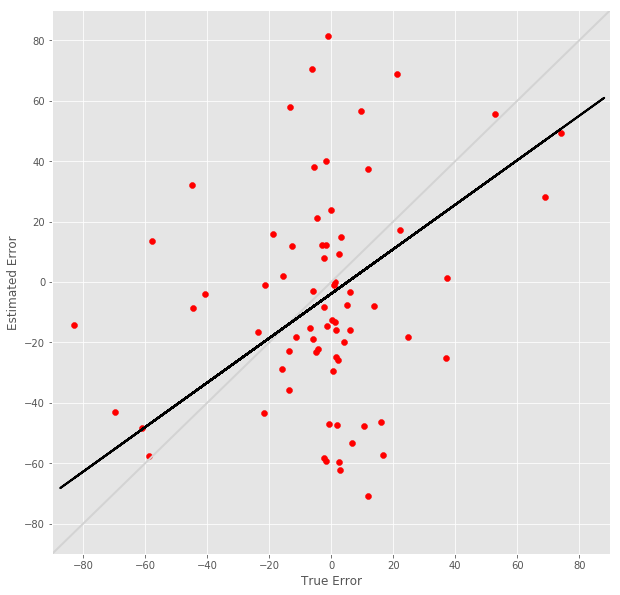

R^2 score for regression on RT: 0.0044
k = 0.0792


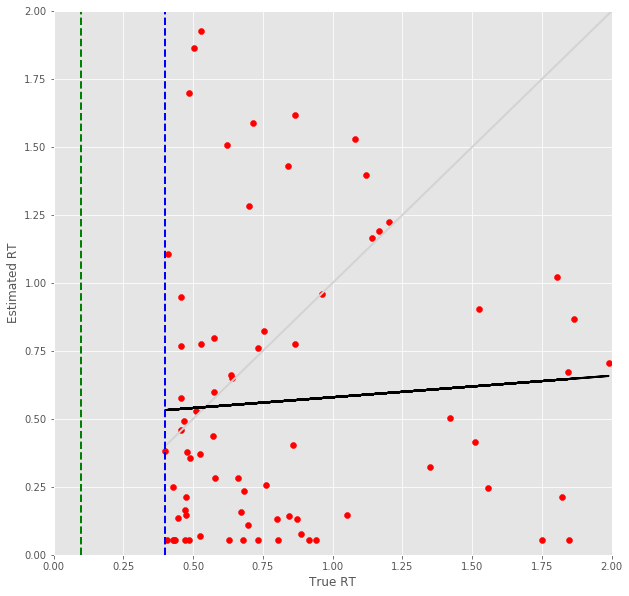

26 -step(s) forecast:
Test Score for 26 -steps forecast: 5.0465 RMSE
Predict Score for 26 -steps forecast: 4.0366 RMSE
Error Test Score for 26 -steps forecast: 0.5991 RMSE
RT Test Score for 26 -steps forecast: 0.4728 RMSE
Error Test Corr for 26 -steps forecast: 0.6539
RT Test Corr for 26 -steps forecast: 0.5450


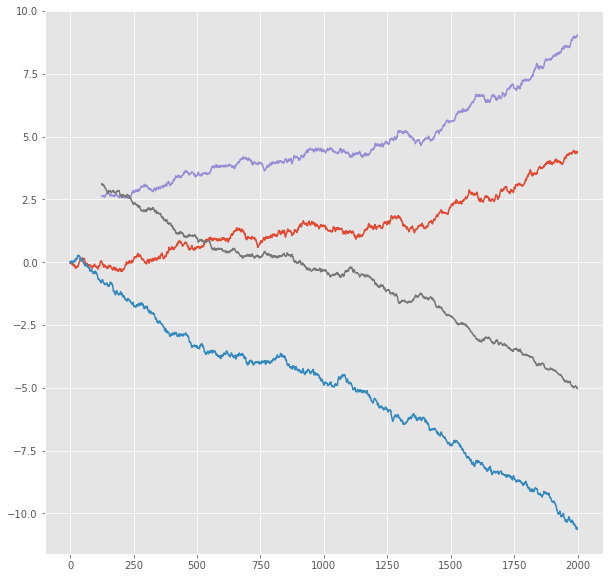

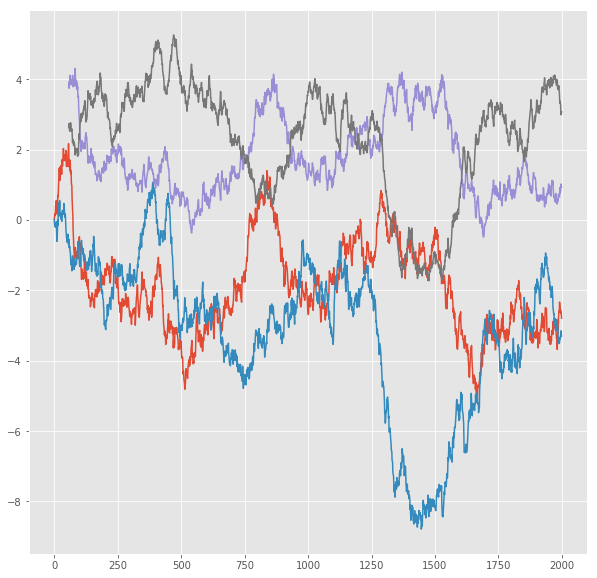

R^2 score for regression on Error: 0.4276
k = 0.9603


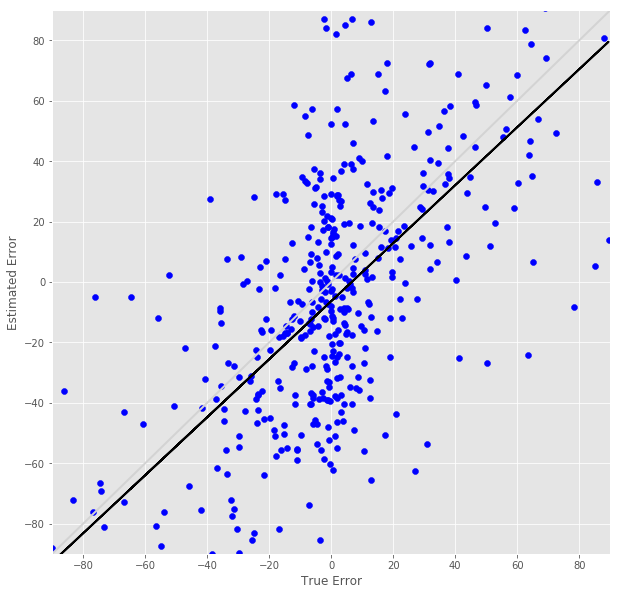

R^2 score for regression on RT: 0.2970
k = 0.7171


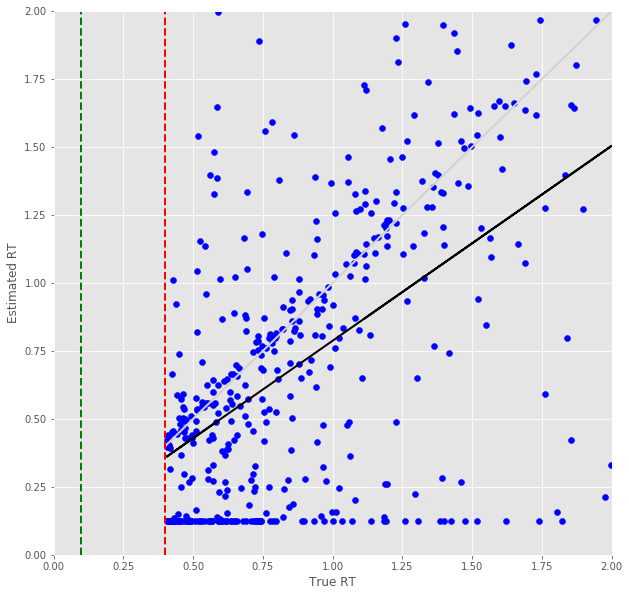

Error Prediction Score: 0.7254 RMSE
RT Prediction Score: 0.6999 RMSE
Error Prediction Corr: 0.4930
RT Prediction Corr: 0.0888
R^2 score for regression on Error: 0.2430
k = 0.7289


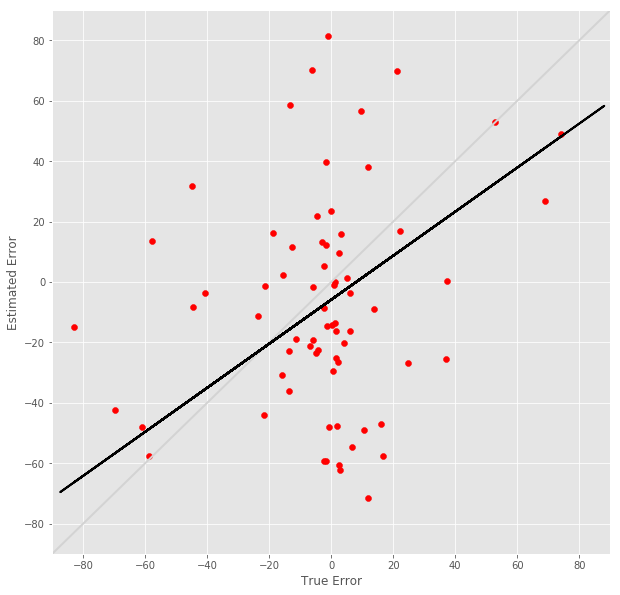

R^2 score for regression on RT: 0.0079
k = 0.1064


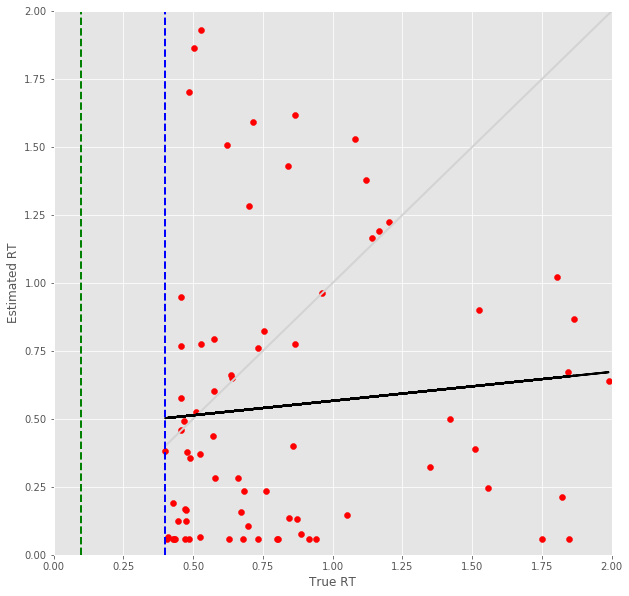

27 -step(s) forecast:
Test Score for 27 -steps forecast: 5.1526 RMSE
Predict Score for 27 -steps forecast: 4.1252 RMSE
Error Test Score for 27 -steps forecast: 0.6090 RMSE
RT Test Score for 27 -steps forecast: 0.4849 RMSE
Error Test Corr for 27 -steps forecast: 0.6506
RT Test Corr for 27 -steps forecast: 0.5305


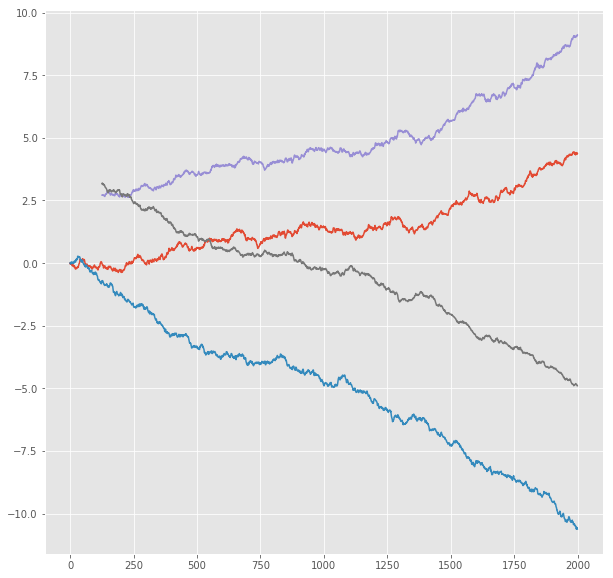

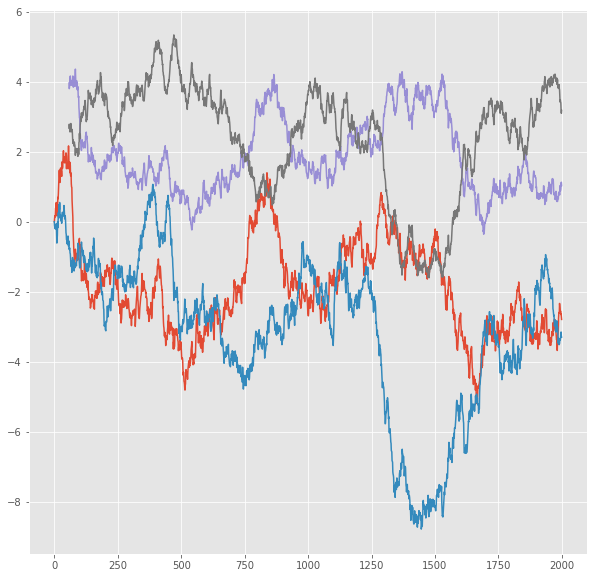

R^2 score for regression on Error: 0.4233
k = 0.9692


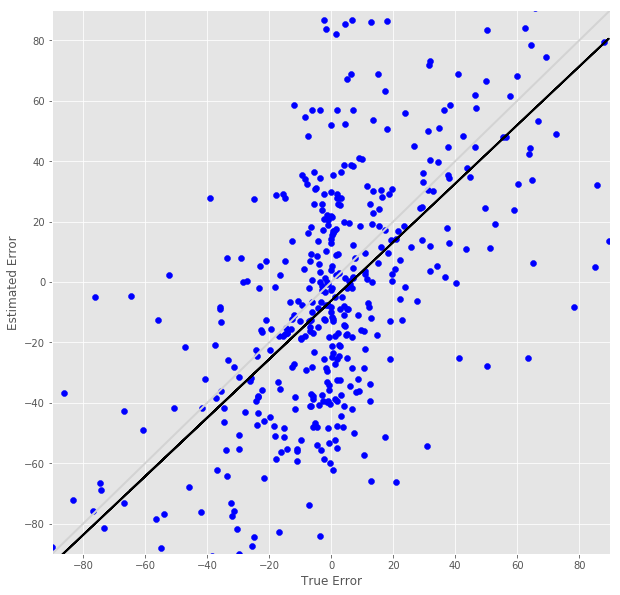

R^2 score for regression on RT: 0.2814
k = 0.7090


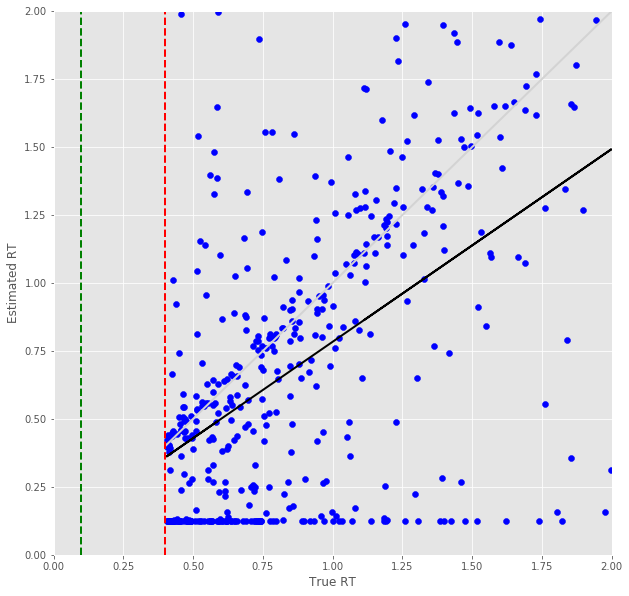

Error Prediction Score: 0.7357 RMSE
RT Prediction Score: 0.7099 RMSE
Error Prediction Corr: 0.4852
RT Prediction Corr: 0.0698
R^2 score for regression on Error: 0.2354
k = 0.7261


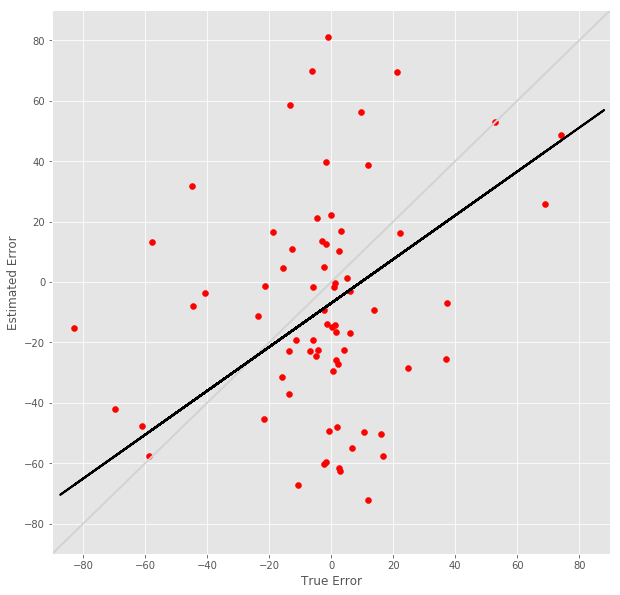

R^2 score for regression on RT: 0.0049
k = 0.0861


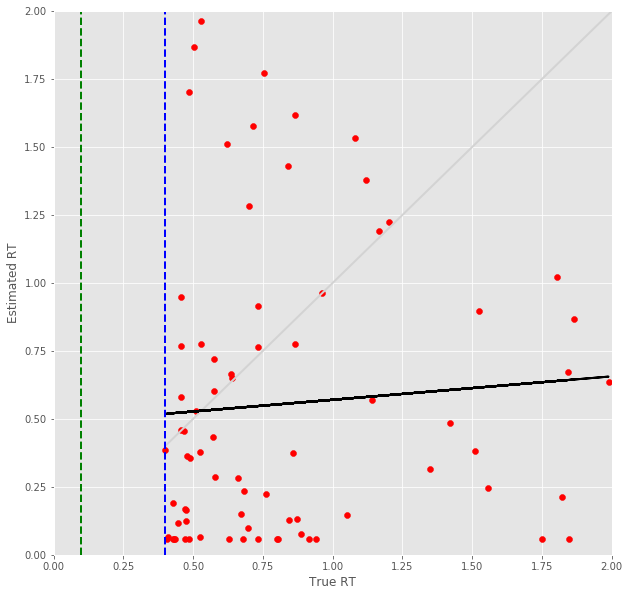

28 -step(s) forecast:
Test Score for 28 -steps forecast: 5.2550 RMSE
Predict Score for 28 -steps forecast: 4.2109 RMSE
Error Test Score for 28 -steps forecast: 0.6216 RMSE
RT Test Score for 28 -steps forecast: 0.4891 RMSE
Error Test Corr for 28 -steps forecast: 0.6354
RT Test Corr for 28 -steps forecast: 0.5261


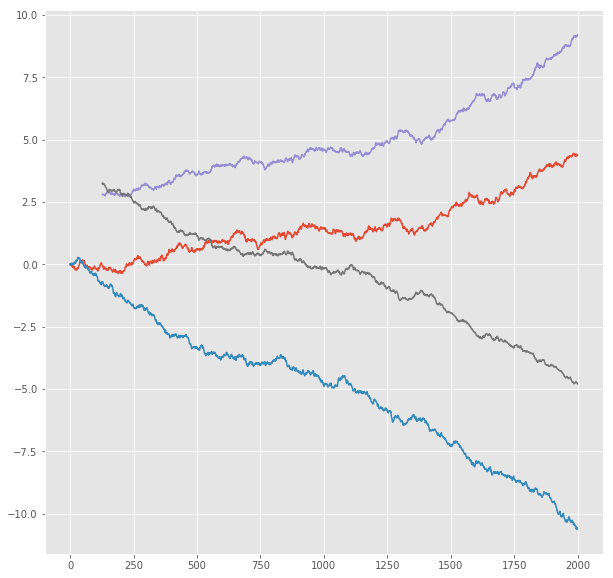

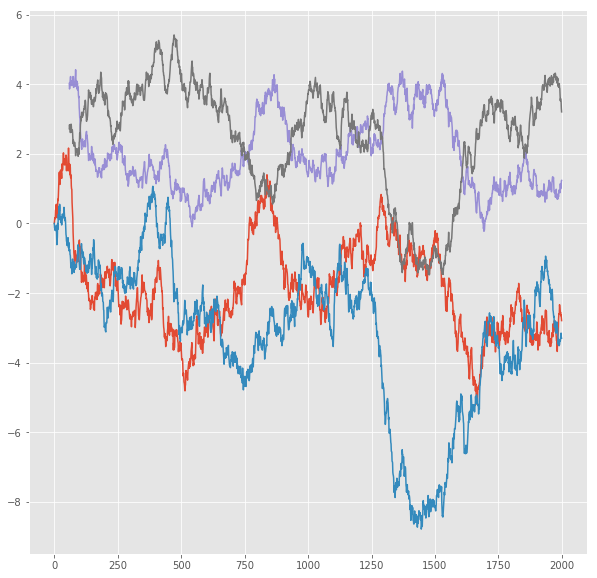

R^2 score for regression on Error: 0.4038
k = 0.9522


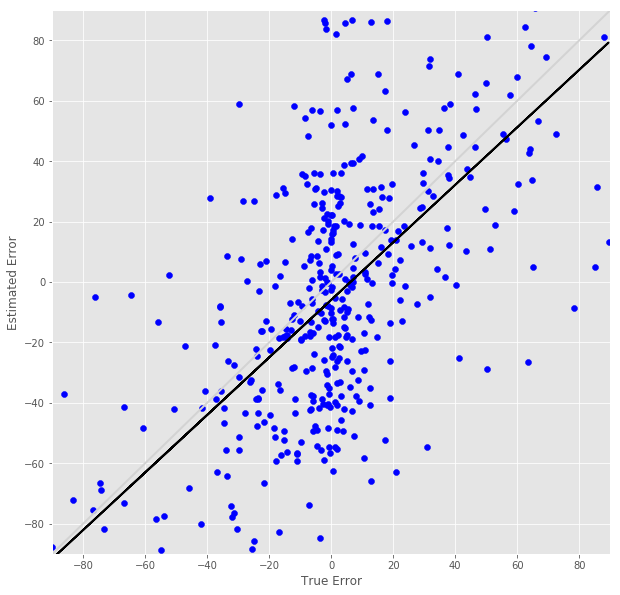

R^2 score for regression on RT: 0.2768
k = 0.7068


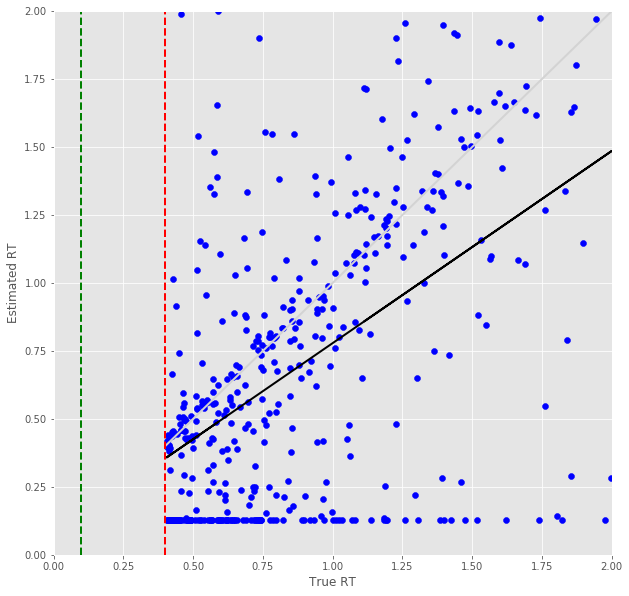

Error Prediction Score: 0.7464 RMSE
RT Prediction Score: 0.7086 RMSE
Error Prediction Corr: 0.5033
RT Prediction Corr: 0.0621
R^2 score for regression on Error: 0.2533
k = 0.7848


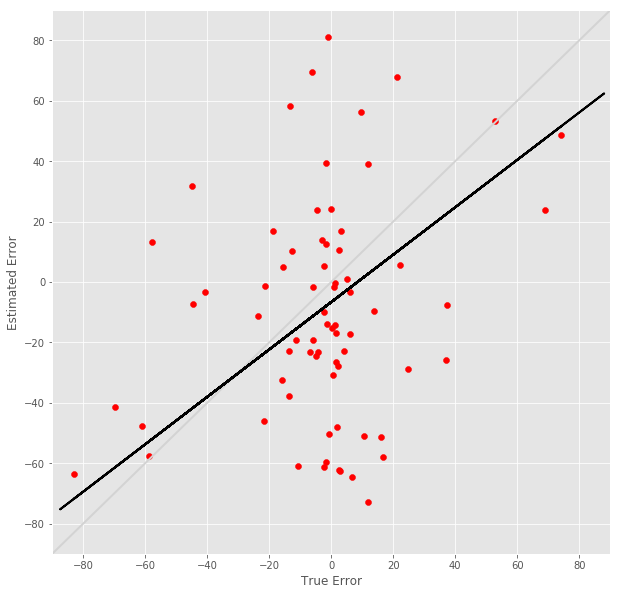

R^2 score for regression on RT: 0.0039
k = 0.0732


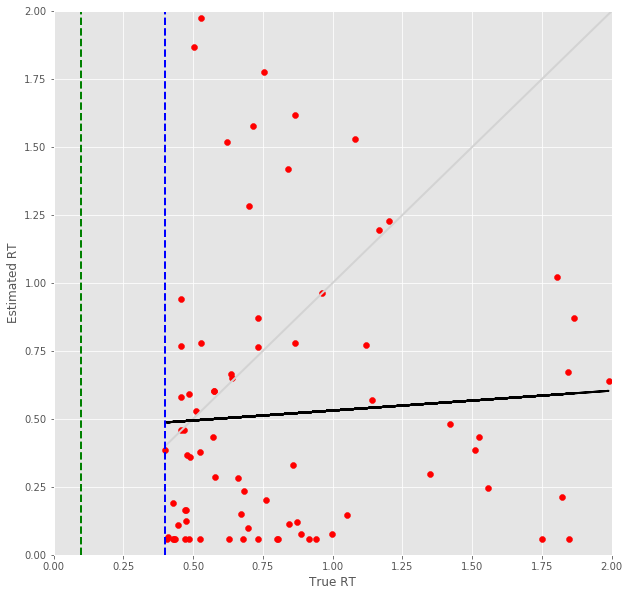

29 -step(s) forecast:
Test Score for 29 -steps forecast: 5.3539 RMSE
Predict Score for 29 -steps forecast: 4.2939 RMSE
Error Test Score for 29 -steps forecast: 0.6286 RMSE
RT Test Score for 29 -steps forecast: 0.4945 RMSE
Error Test Corr for 29 -steps forecast: 0.6462
RT Test Corr for 29 -steps forecast: 0.5210


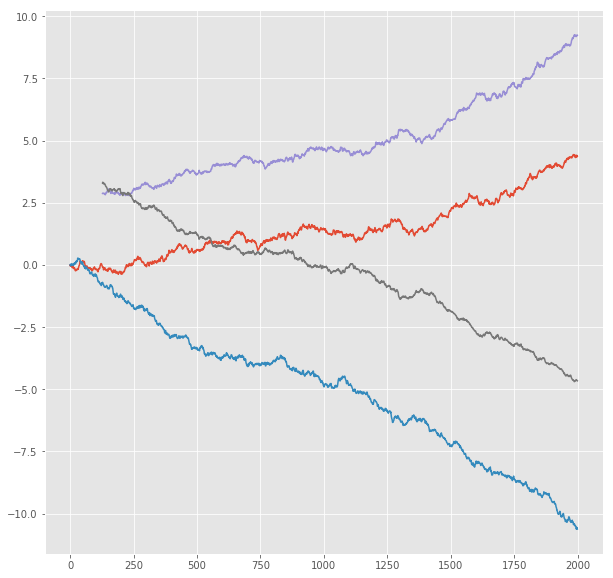

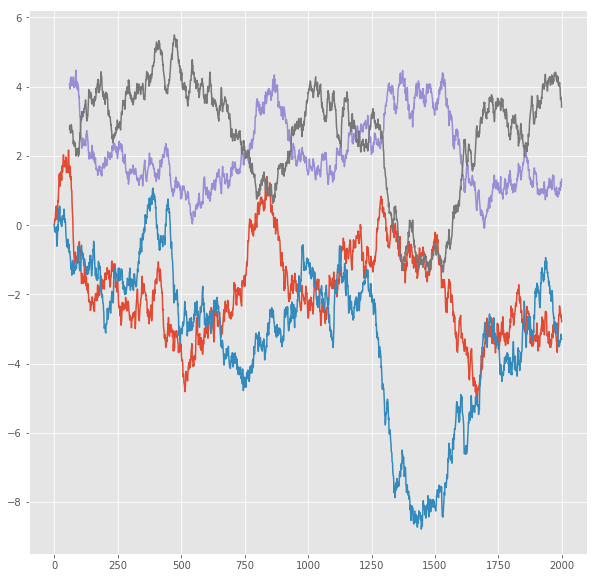

R^2 score for regression on Error: 0.4176
k = 0.9969


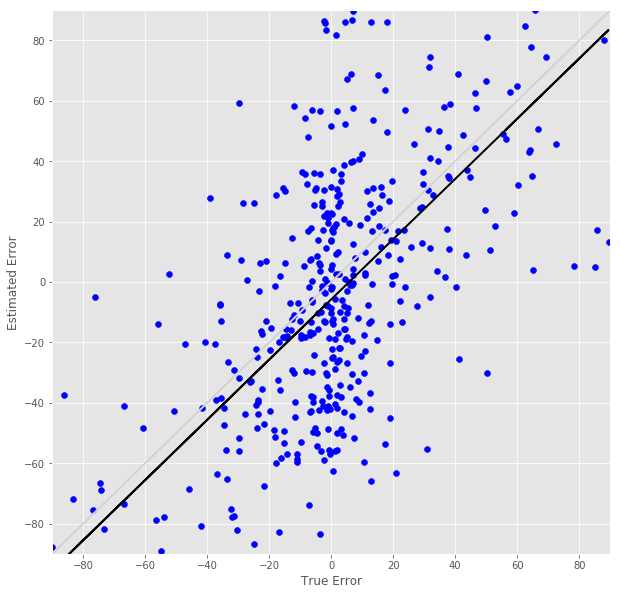

R^2 score for regression on RT: 0.2715
k = 0.6921


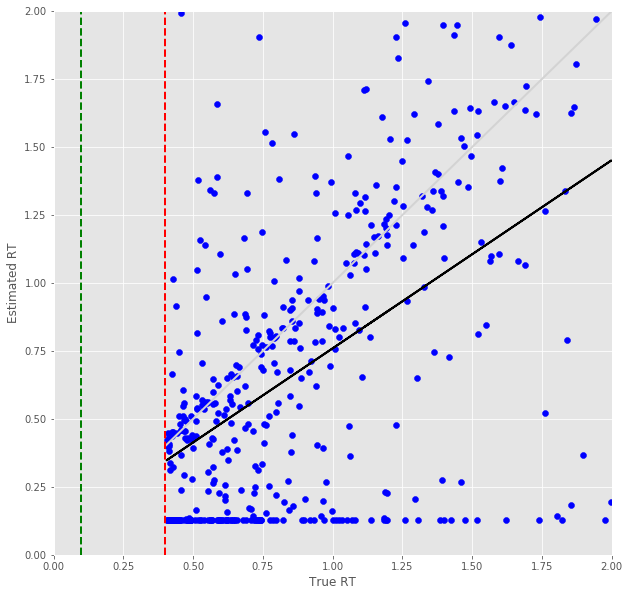

Error Prediction Score: 0.7548 RMSE
RT Prediction Score: 0.6976 RMSE
Error Prediction Corr: 0.5002
RT Prediction Corr: 0.0921
R^2 score for regression on Error: 0.2502
k = 0.7816


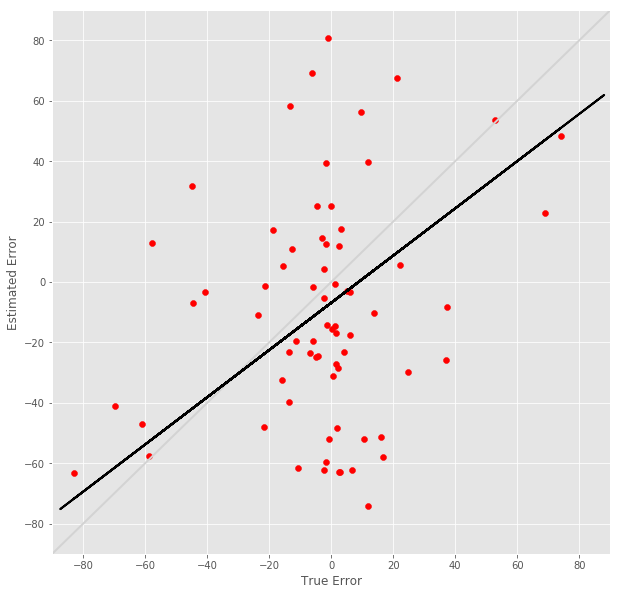

R^2 score for regression on RT: 0.0085
k = 0.1038


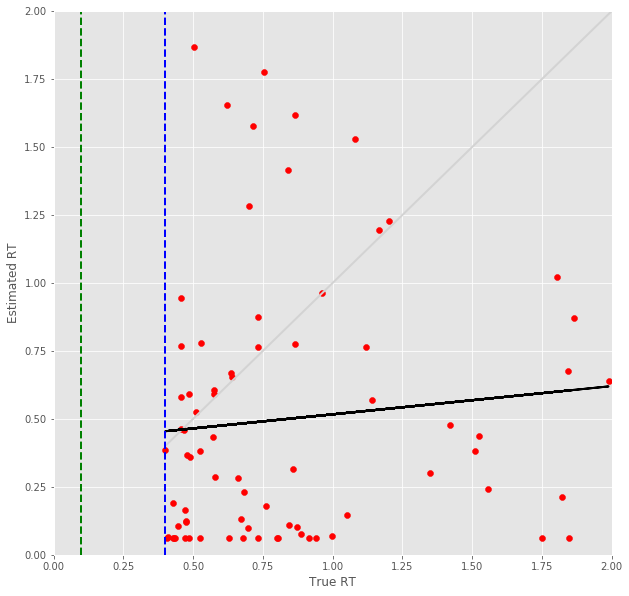

30 -step(s) forecast:
Test Score for 30 -steps forecast: 5.4493 RMSE
Predict Score for 30 -steps forecast: 4.3742 RMSE
Error Test Score for 30 -steps forecast: 0.6406 RMSE
RT Test Score for 30 -steps forecast: 0.5068 RMSE
Error Test Corr for 30 -steps forecast: 0.6411
RT Test Corr for 30 -steps forecast: 0.5087


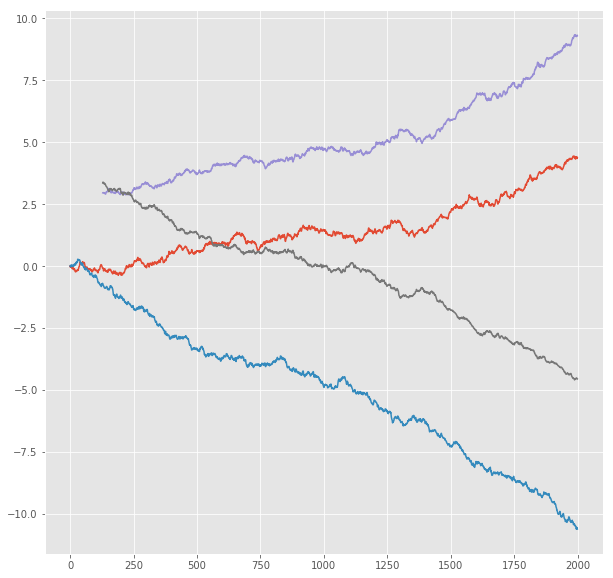

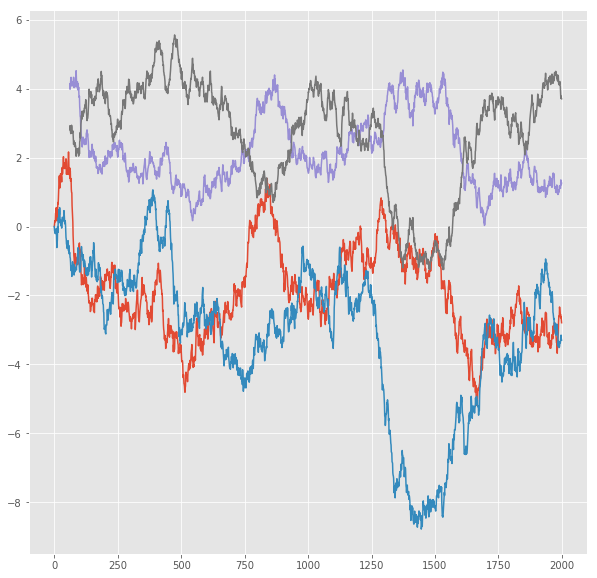

R^2 score for regression on Error: 0.4110
k = 0.9952


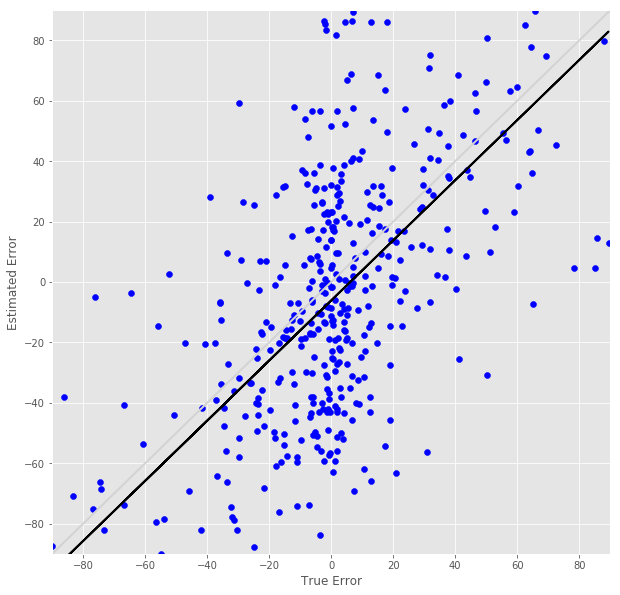

R^2 score for regression on RT: 0.2588
k = 0.6874


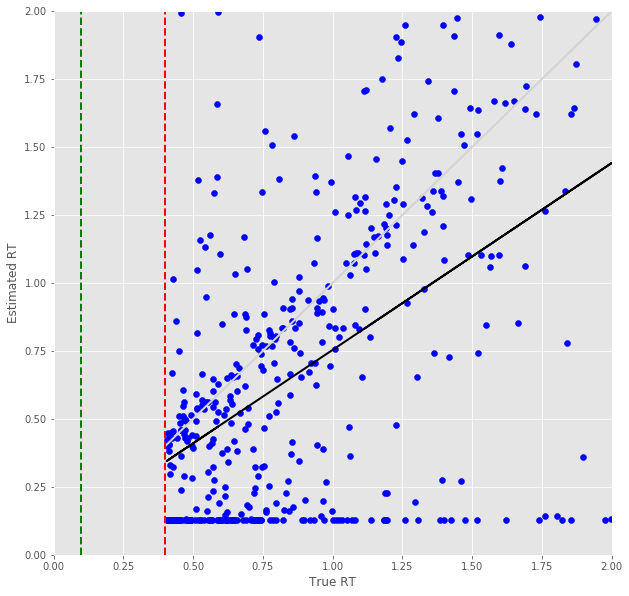

Error Prediction Score: 0.7657 RMSE
RT Prediction Score: 0.7044 RMSE
Error Prediction Corr: 0.4964
RT Prediction Corr: 0.0807
R^2 score for regression on Error: 0.2465
k = 0.7794


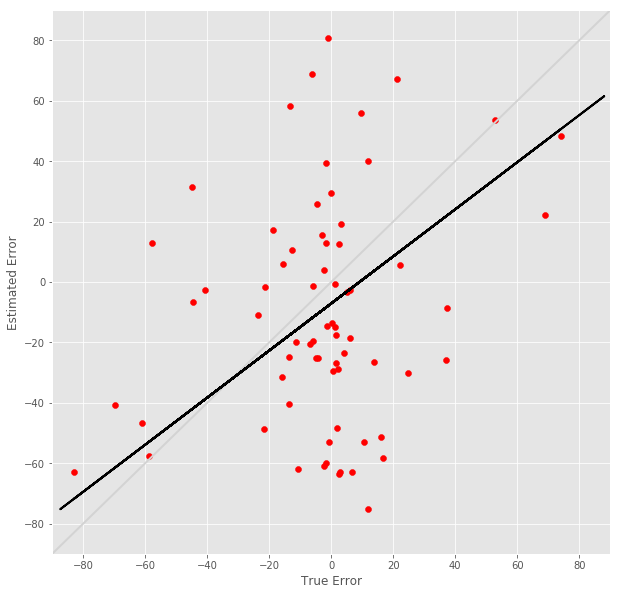

R^2 score for regression on RT: 0.0065
k = 0.0870


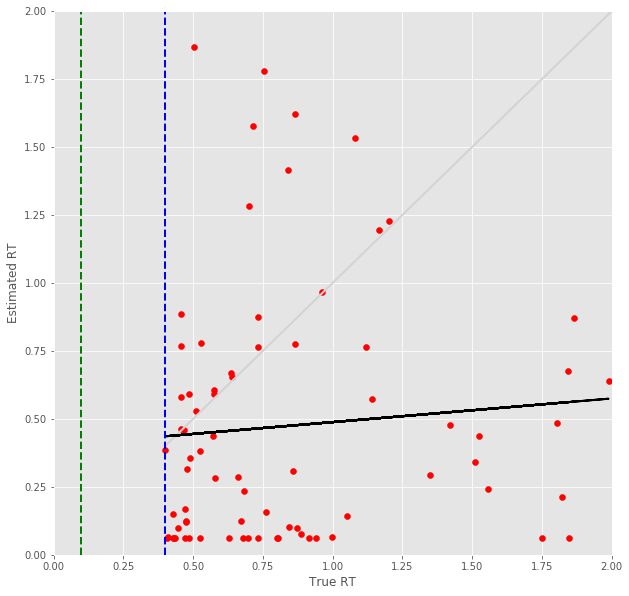

31 -step(s) forecast:
Test Score for 31 -steps forecast: 5.5415 RMSE
Predict Score for 31 -steps forecast: 4.4520 RMSE
Error Test Score for 31 -steps forecast: 0.6478 RMSE
RT Test Score for 31 -steps forecast: 0.5146 RMSE
Error Test Corr for 31 -steps forecast: 0.6407
RT Test Corr for 31 -steps forecast: 0.4906


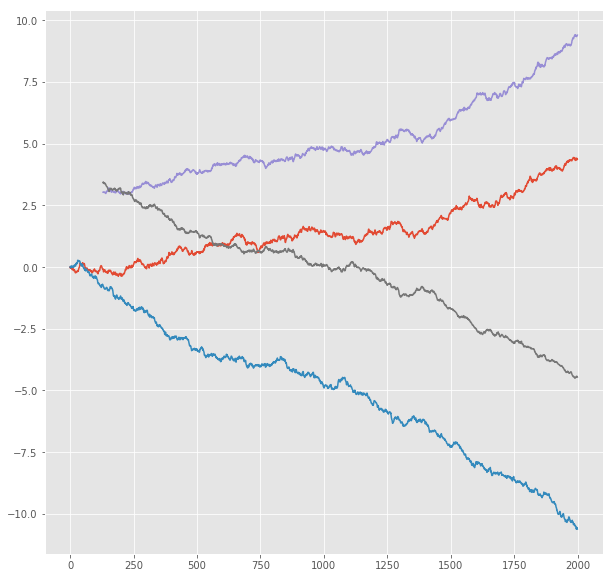

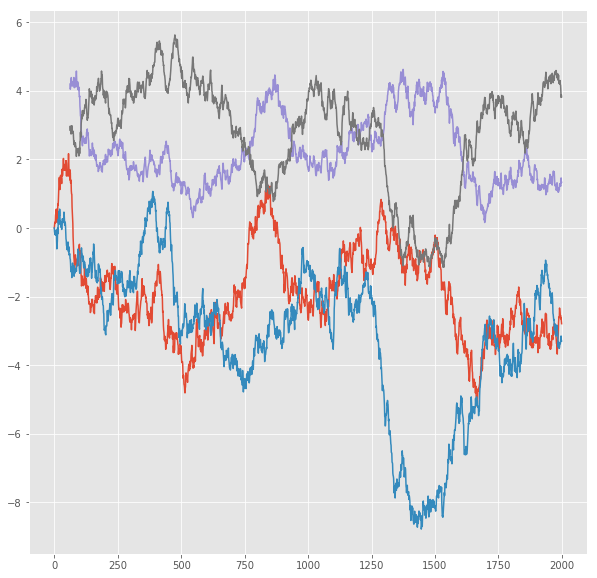

R^2 score for regression on Error: 0.4105
k = 1.0042


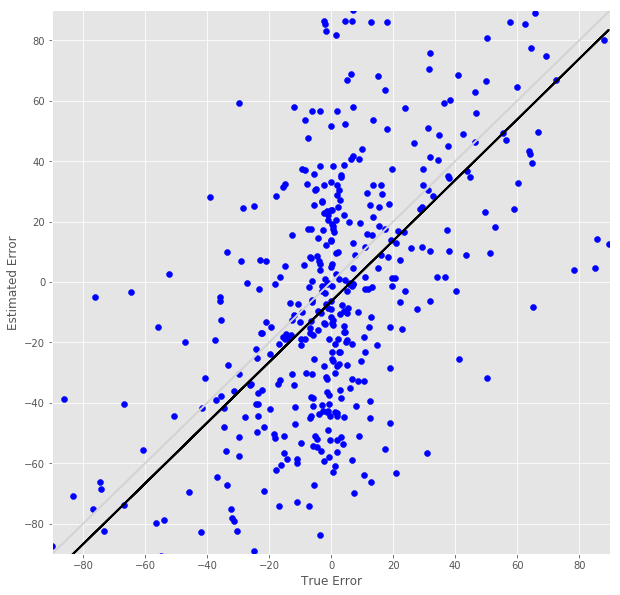

R^2 score for regression on RT: 0.2407
k = 0.6588


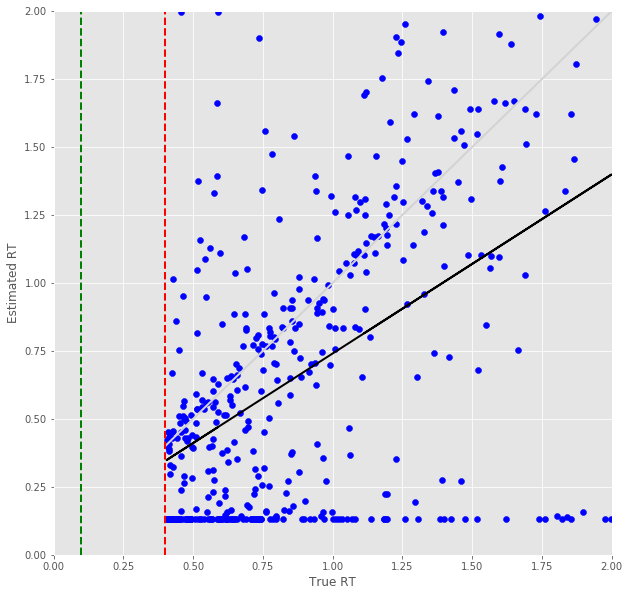

Error Prediction Score: 0.7801 RMSE
RT Prediction Score: 0.7083 RMSE
Error Prediction Corr: 0.4877
RT Prediction Corr: 0.0694
R^2 score for regression on Error: 0.2378
k = 0.7788


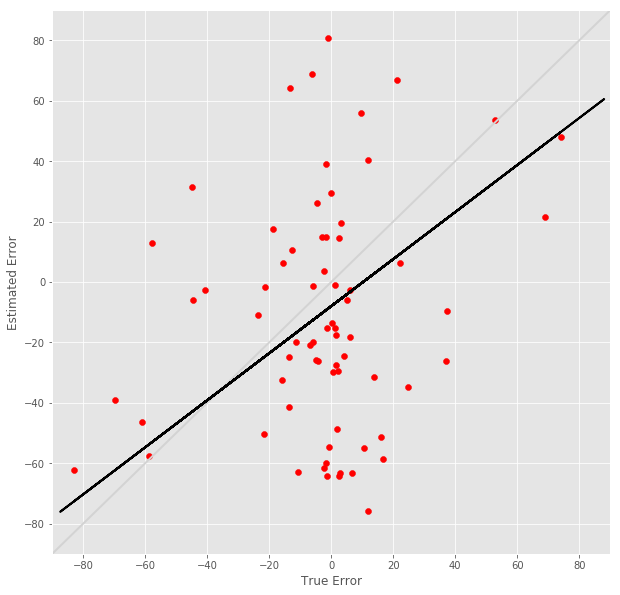

R^2 score for regression on RT: 0.0048
k = 0.0749


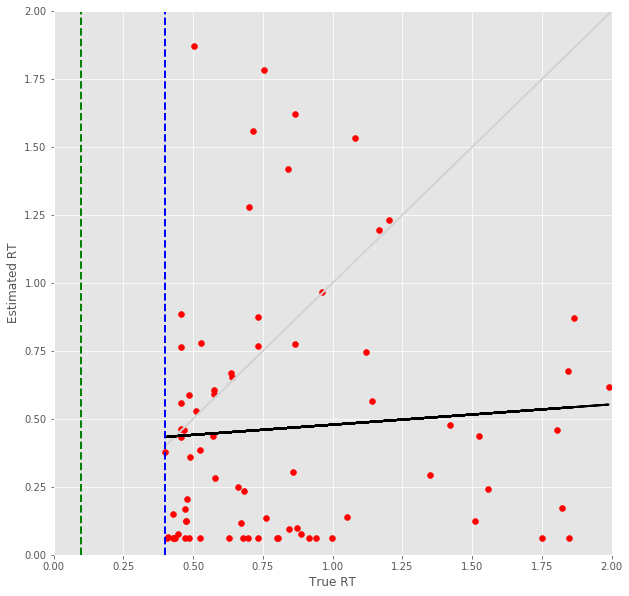

32 -step(s) forecast:
Test Score for 32 -steps forecast: 5.6306 RMSE
Predict Score for 32 -steps forecast: 4.5274 RMSE
Error Test Score for 32 -steps forecast: 0.6540 RMSE
RT Test Score for 32 -steps forecast: 0.5211 RMSE
Error Test Corr for 32 -steps forecast: 0.6434
RT Test Corr for 32 -steps forecast: 0.4737


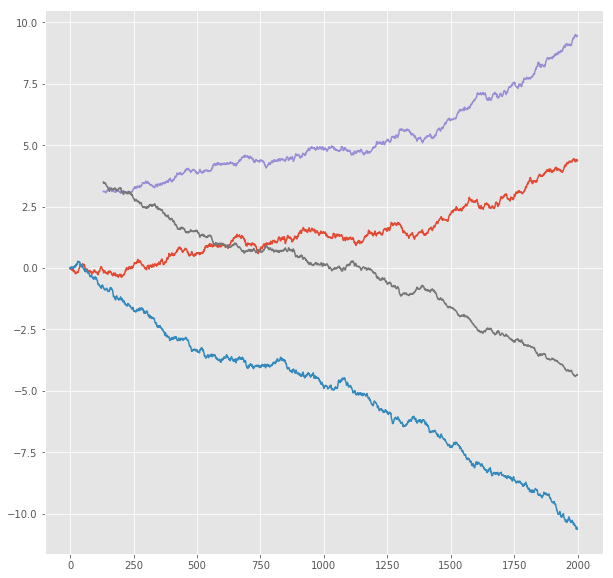

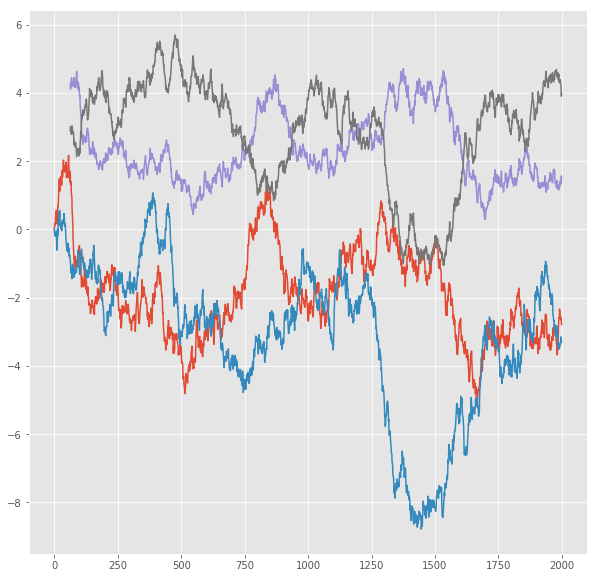

R^2 score for regression on Error: 0.4140
k = 1.0191


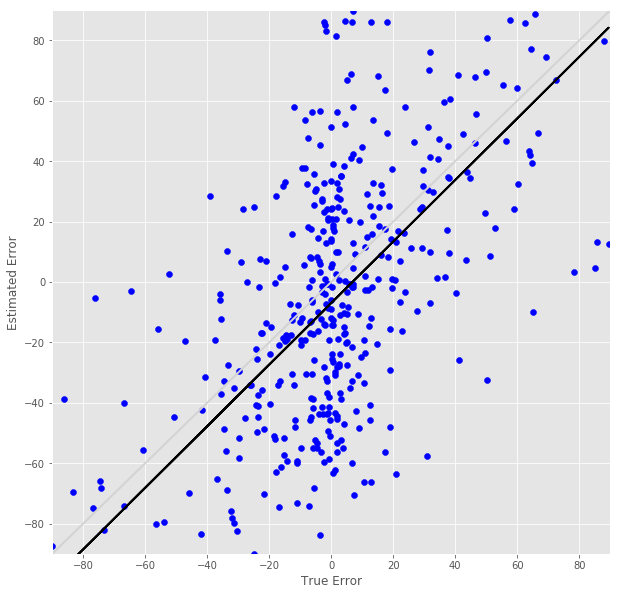

R^2 score for regression on RT: 0.2244
k = 0.6332


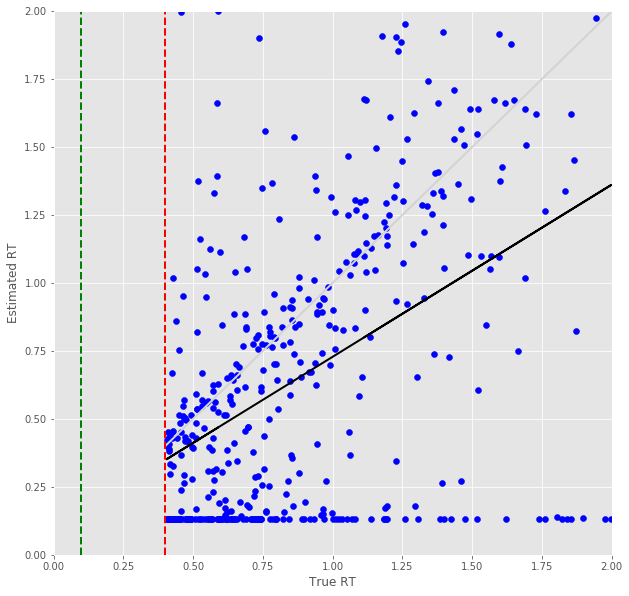

Error Prediction Score: 0.7890 RMSE
RT Prediction Score: 0.7075 RMSE
Error Prediction Corr: 0.4939
RT Prediction Corr: 0.0804
R^2 score for regression on Error: 0.2440
k = 0.8093


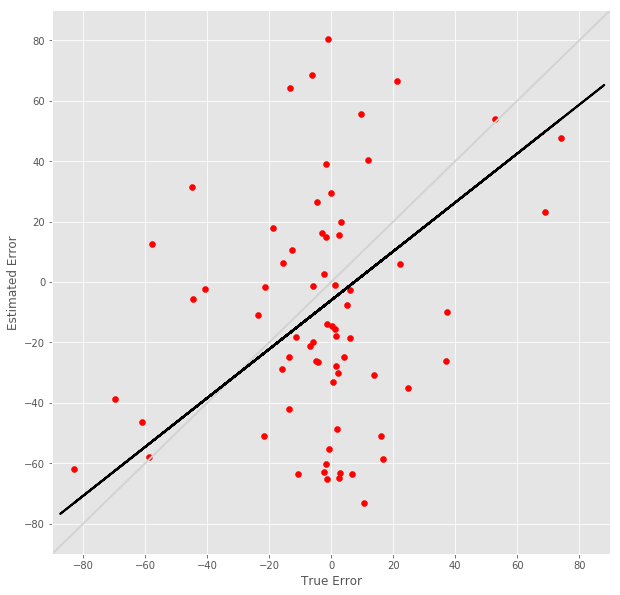

R^2 score for regression on RT: 0.0065
k = 0.0836


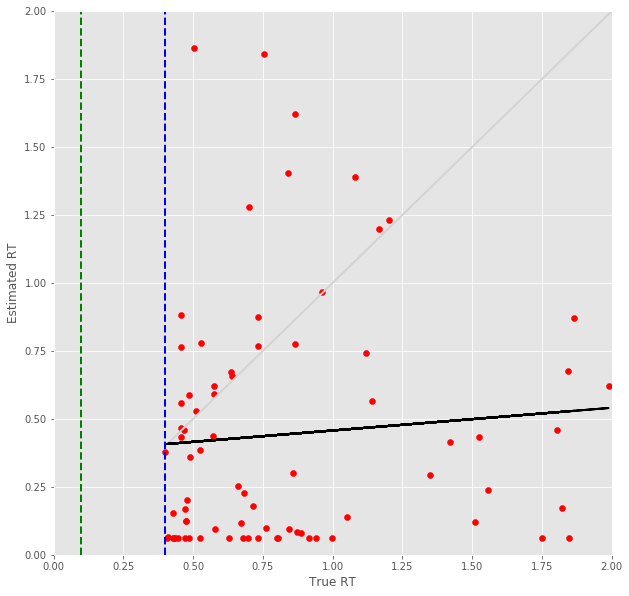

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

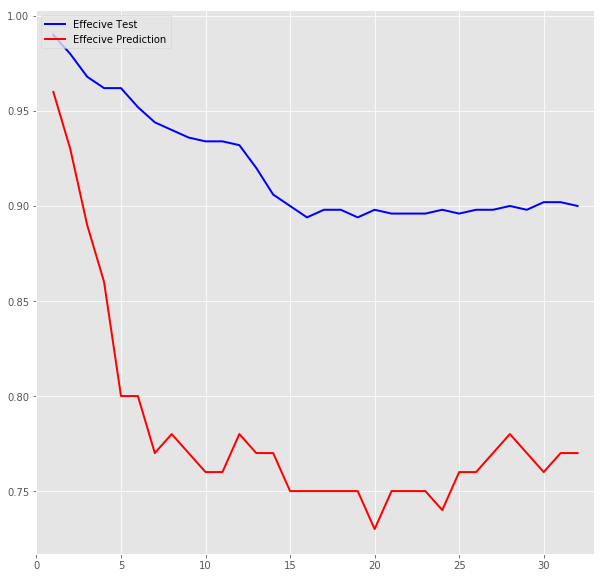

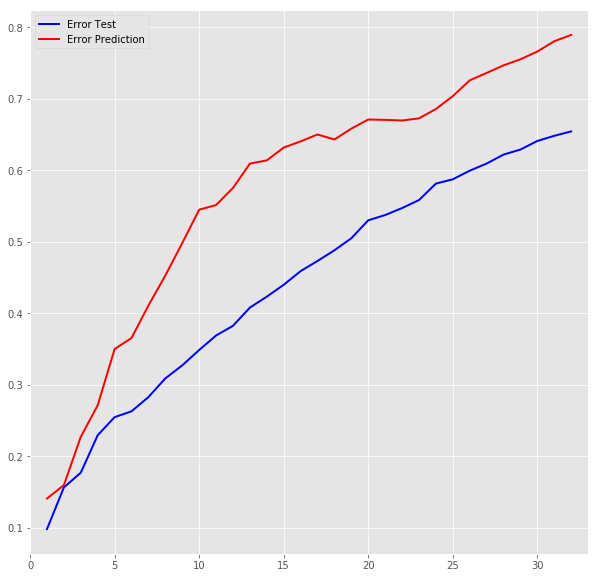

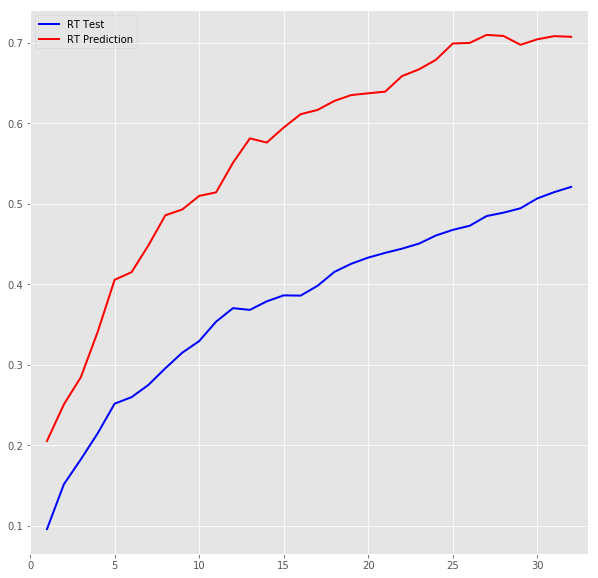

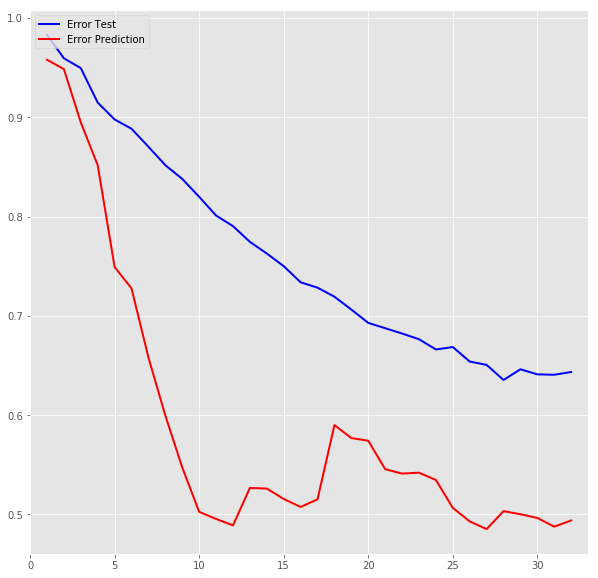

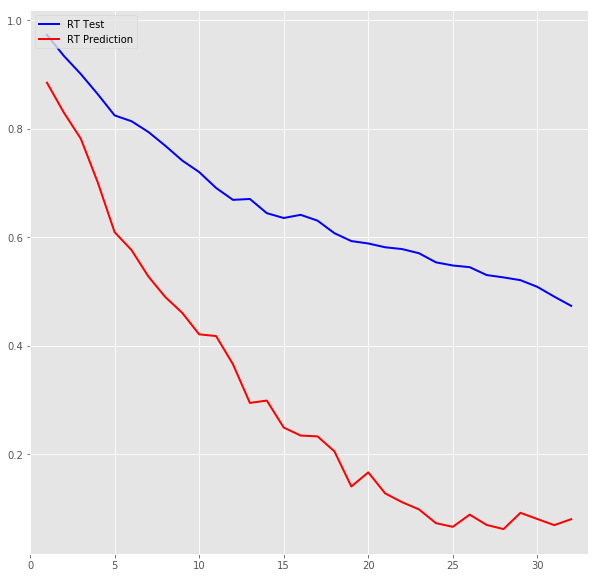

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
